# Projet 4 : Anticipez les besoins en consommation électrique de bâtiments

- **Rappel de la problématique** 
    - Prédiction de la consommation énergétique et de l'émission de CO2 des bâtiments non résidentiels de la ville de Seattle 
    
 - **Mission** : 
     - Réaliser une analyse exploratoire
     - Tester différents modèles de prédiction
     - Evaluer l'intérêt de l'EnergyStarScore pour la prédiction de l'émission de CO2
    
-  **Sources** : 
      - Des données détaillées sur des relevés minutieux de 2015 à 2016, et sur les caractéristiques individuelles           des bâtiments non résidentiels et multifamiliaux, à savoir la taille et usage des bâtiments, mention de travaux récents, date de construction, etc sont  publiées via le portail de ["Seattle Open data"](https://data.seattle.gov/)
      
      


### Sommaire 

**1-Chargement des librairies et le jeu de données**
**2-Nettoyages effectué** 

  - 2.1 – Nettoyage des variables sur la localisation des bâti  ment dans le deux jeu de données 
  - 2.2 - Typage de données
  - 2.3 – Supprimer les variables redondantes 
  - 2.4 – Concaténer les deux dataframes 
  - 2.5 - Traiter  des valeurs aberrantes 
     - Détecter les valeurs aberrantes pour le Nombre des étages et Nombre des bâtiment
     - Détecter les valeurs aberrantes pour la superficie des bâtiments
     - Détecter les valeurs aberrantes pour la consommation de l’énergie 
     - Détecter les valeurs aberrantes pour l’émission de CO2 
     - Détecter les anomalies de consommation énergétique pour les bâtiments sous deux ans 
     - Détecter les anomalies de l’émission de CO2 pour les bâtiment sous deux ans
     - Traiter des valeurs manquante
         -  Identifier le type de missingness dans le jeu de données
         -  Les valeurs manquantes des variables numériques et catégorielles 
		
**3-Regroupement de l’usage des bâtiment**

**4-Analyse exploratoire** 
  - 4.1 Projection des établissements sur la carte de Seattle
  - 4.2	Analyse univarié
    - Des variables catégorielles
     -  Les types de bâtiments
     - 	L’années de construction des bâtiments
    - Des variables numériques 
     - Comparer la distruburion de consommation d'energy & emission de GHG entre 2015 et 2016
  
  - 4.3. Analyse de multicolinéarité entre les variables
     - Vérification de multicolinéarité avec le VIF (Variance Inflation Factor)
     - La multicolinéarité des variables de la consomation énérgétique et l'émission de GHG
	 - La multicolinéarité des variables sur la caractéristique des bâtiments
	 - Feature engineering

  - 4.4 Analyse des variables à prédire 

**5-Modélisation sans « EnergyStarScore »**
   
  - 5.1	Data Préprocessing
     - One-Hot Encoding données catégorielles
     - Data Transformation (Features scaling)
     - Split data en train/test
  - 5.2 Créer le modèle baseline : Régression linéaire multivarié 
  - 5.3 Optimiser des hyperpramètres 
  - 5.4 Tester les modèle de régression 
     - Régression régularisée : ElasticNet
     - Régresssion non-linéaire, méthode ensembliste : RandomForestRegressor
     - Régression non-linéaire, boosting de gradient : XGBoost (eXtreme Gradient Boosting)
     - Régression de boosting de gradients : LightGBM
     
  - 5.5 Comparer les algorithmes
  - 5.6 Feature importance
  - 5.7 Evaluer le modèle selectionné
      - Visualisation des erreurs 
      - Visualisation des résidus et leur distribution
      
**6-Modélisation avec "EnergyStarSocre"**
  - 6.1 Créer le modèle
  - 6.2  Feature importance
  - 6.3  Analyser la performance du modèle sélectionné
	  - Visualisation des erreurs
	  - Visualisation des résidus et leur distribution


# 1-Chargement des librairies et le jeu de données

In [1]:
import pandas as pd
import numpy as np 
import missingno as msno

import matplotlib.pyplot as plt
import seaborn as sns 

import warnings
warnings.filterwarnings('ignore')

from IPython.core.display import HTML

import re
from pprint import pprint


In [2]:
df_15 = pd.read_csv(r"C:\Users\faeze\Documents\OC data science\PROJECT\Project4\Datas_P04\2015-building-energy-benchmarking.csv",low_memory=True)

In [3]:
df_16 = pd.read_csv(r"C:\Users\faeze\Documents\OC data science\PROJECT\Project4\Datas_P04\2016-building-energy-benchmarking.csv",low_memory=True)

In [4]:
# La dimension de deux dataframes

print("dimension donnée_2015 : ",df_15.shape, "\n")
print("dimension donnée_2016 :", df_16.shape, "\n")

display(df_15.head())
display(df_16.head())

dimension donnée_2015 :  (3340, 47) 

dimension donnée_2016 : (3376, 46) 



,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,...,GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,...,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,...,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122...",7,DOWNTOWN,1969,...,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122...",7,DOWNTOWN,1926,...,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122....",7,DOWNTOWN,1980,...,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [5]:
# Afficher le nom de colonnes 

df_15.columns.tolist()

['OSEBuildingID',
 'DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'TaxParcelIdentificationNumber',
 'Location',
 'CouncilDistrictCode',
 'Neighborhood',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearsENERGYSTARCertified',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'OtherFuelUse(kBtu)',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'DefaultData',
 'Comment',
 'ComplianceStatus',
 'Outlier',
 '2010 Census Tracts',

In [6]:
# Afficher le nom de colonnes 
df_16.columns.tolist()

['OSEBuildingID',
 'DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'Address',
 'City',
 'State',
 'ZipCode',
 'TaxParcelIdentificationNumber',
 'CouncilDistrictCode',
 'Neighborhood',
 'Latitude',
 'Longitude',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearsENERGYSTARCertified',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'DefaultData',
 'Comments',
 'ComplianceStatus',
 'Outlier',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']

## La description des variables : 

- **Définition des variables de 2015 disponible sur ce [lien](https://opendatanetwork.herokuapp.com/dataset/data.seattle.gov/h7rm-fz6m)** 
- **Définition des variable de 2016 disponible sur ce [lein](https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy)** 


- **SiteEUI(kBtu/sf)** : La consommation d'énergie du site divisée par sa surface de plancher brute. 

- **SiteEUIWN(kBtu/sf)** : La consommataion de l'énergie de la source WN du site divisée par sa surface de plancher brute, ajustée à ce que la propriété aurait consommée dans des conditions météorologiques moyennes de 30 ans


- **SourceEUI(kBtu/sf)** : La consommation d'énergie à la source d'une propriété divisée par sa surface de plancher brute.


- **SourceEUIWN(kBtu/sf)** : La consommation de l'énergie de la source divisée par la surface de plancher brute, ajustée à ce que la propriété aurait consommée dans des conditions météorologiques moyennes de 30 ans

- **SiteEnergyUse(kBtu)** : La consommation annuelle de l’énergie (toute les sources)


- **SiteEnergyUseWN(kBtu)**: La consommation annelle de toute les sources de l’energie ajustée à ce que la propriété aurait consommée dans des conditions météorologiques moyennes de 30 ans


- **SteamUse(kBtu)** :La consommation  annuelle de réseau de chauffage urbain, 

- **Electricity(kWh)** :La quantité annuelle d'électricité consommée par la propriété sur place en kwatt /hour 

- **Electricity(kBtu)** :La quantité annuelle d'électricité consommée par la propriété sur place (en unités thermiques britanniques (kBtu).


- **NaturalGas(therms)** : La quantité annuelle de gaz naturel fourni par les services publics et consommée par la propriété, (en therm)

- **NaturalGas(kBtu)** : La quantité annuelle de gaz naturel fourni par les services publics et consommée par la propriété, (KBtu)


- **GHGEmissions(MetricTonsCO2e) / TotalGHGEmissions** : La quantité totale d'émissions de gaz par e site mesurée en Tons métriques d'équivalent en CO2. 

- **GHGEmissionsIntensity(kgCO2e/ft2) /GHGEmissionsIntensity** :Émissions totales de gaz divisées par la surface de plancher brute de la propriété, mesurée en KG d'équivalent CO2 par pied(foot).
- **ENERGYSTARScore** : -	Basé sur un échelle de 1 à 100, EnergyStarScore mesure la performance énergétique des bâtiments. (plus le score est élevé, meilleure est la performance énergétique du bâtiment.)

# 2-Nettoyages des données

In [7]:
# Function pour comparer deux columns similaires de deux dataframes et 
#renvoyer les élements spécifique de chaque dataframe
def compare(tbl1, tbl2) : 
        return ((set(tbl1)-set(tbl2), set(tbl2)-set(tbl1)))
    
    
# Function pour la proportion total de valeur manquantes à la taille de jeu de données
def taux_null_total(dataframe) : 
    return((dataframe.isnull().sum().sum()/dataframe.shape[0]/dataframe.shape[1])*100)

# Function pour afficher le taux de valeurs manquantes pour chaque variable 
def taux_null (dataframe) :
    print(pd.DataFrame(dataframe.isnull().sum()/dataframe.shape[0])*100)
    
    
    
# Function pour identifier les colonne qui contient "kWh" ou "WN" (Normalisezd Wethere)

def search_string(df, suffix=None):
    componant = []
    for col in df.columns:
        if suffix in col: 
            componant.append(col)
    return componant


In [8]:
# Afficher la différence des colonnes de deux dfs

print("colonnes dans df_16 qui ne sont pas dans df_15:", set(df_16.columns.tolist()) -set(df_15.columns.tolist()))
print("colonnes dans df_15 qui ne sont pas dans df_16:" ,set(df_15.columns.tolist()) -set(df_16.columns.tolist()))

colonnes dans df_16 qui ne sont pas dans df_15: {'TotalGHGEmissions', 'Latitude', 'Address', 'Longitude', 'ZipCode', 'State', 'Comments', 'City', 'GHGEmissionsIntensity'}
colonnes dans df_15 qui ne sont pas dans df_16: {'GHGEmissionsIntensity(kgCO2e/ft2)', '2010 Census Tracts', 'Seattle Police Department Micro Community Policing Plan Areas', 'Location', 'OtherFuelUse(kBtu)', 'GHGEmissions(MetricTonsCO2e)', 'City Council Districts', 'Zip Codes', 'SPD Beats', 'Comment'}


## 2.1 – Nettoyage des variables sur la localisation des bâtiment dans le deux jeu de données

In [9]:
df_15['Location'][0]

'{\'latitude\': \'47.61219025\', \'longitude\': \'-122.33799744\', \'human_address\': \'{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}\'}'

- **On peut constater que la variable "Location" dans le df_2015 contient toutes les données de localisation qui sont présentes dans des variables différentiées en df_2016.**
- Nous allons séparer ces variables pour extraire les variables imbriquées :

In [10]:
# Extraire les variables de géolocalisation dans df_2015

import ast
df_15['Location'] = [ast.literal_eval(str(item)) for index, item in df_15.Location.iteritems()]
df_15 = pd.concat([df_15.drop(['Location'], axis=1), df_15['Location'].apply(pd.Series)], axis=1)
df_15['human_address'] = [ast.literal_eval(str(item)) for index, item in df_15.human_address.iteritems()]
df_15 = pd.concat([df_15.drop(['human_address'], axis=1), df_15['human_address'].apply(pd.Series)], axis=1)


#### Mise en forme des noms des variables dans les deux dataframes

In [11]:
print(df_16["Address"][0])
print(df_15['address'][0])


405 Olive way
405 OLIVE WAY


In [12]:
df_16['Address']= df_16['Address'].str.upper()
df_16['Address'][0]

'405 OLIVE WAY'

In [13]:
#Explorer le varaible zipcode de deux df


print(df_15['zip'].unique())
print("***")
print(df_15['Zip Codes'].unique())
print("***")
print(df_16['ZipCode'].unique())

['98101' '98121' '98104' '98118' '98105' '98112' '98125' '98109' '98103'
 '98199' '98115' '98107' '98144' '98119' '98122' '98126' '98133' '98146'
 '98106' '98108' '98134' '98117' '98136' '98116' '98177' '98102' '98155'
 '98178']
***
[18081 19576 18379 18800 18383 18789 19579 18390 18377 18235 18792 18386
 17919 19575 19578 19581 19582 17920 18385 18388 19584 18798 17916 18795
 17923 17926 18229 18376 18230]
***
[98101. 98121. 98104. 98154. 98118. 98105. 98112. 98125. 98109. 98070.
 98108. 98199. 98115. 98107. 98144. 98103. 98119. 98136. 98122. 98126.
 98133. 98146. 98033. 98106. 98111. 98134. 98117. 98116. 98191. 98164.
 98195. 98185. 98181. 98102. 98168. 98155. 98006. 98124. 98053. 98012.
 98013. 98028. 98178. 98114. 98127. 98165. 98011. 98198. 98113. 98040.
 98204. 98177. 98020. 98272. 98145.    nan]


- On constate que le variable "zip" dans le df_2015 est la meme que le variable "ZipCode" dans le df_2016. 
- On peut donc supprimer la varible "Zip Codes" dans df_2015 

In [14]:
df_15.drop(['Zip Codes'], axis= 1, inplace = True)

##  2.2 - Typage de données

In [15]:
print(df_15.dtypes.value_counts())

float64    23
object     20
int64       8
dtype: int64


In [16]:
print('Typage donnée_2015', "\n",df_15.dtypes)

Typage donnée_2015 
 OSEBuildingID                                                      int64
DataYear                                                           int64
BuildingType                                                      object
PrimaryPropertyType                                               object
PropertyName                                                      object
TaxParcelIdentificationNumber                                     object
CouncilDistrictCode                                                int64
Neighborhood                                                      object
YearBuilt                                                          int64
NumberofBuildings                                                  int64
NumberofFloors                                                   float64
PropertyGFATotal                                                   int64
PropertyGFAParking                                                 int64
PropertyGFABuilding(s)        

In [17]:
# Convertir longitude et latitude à float  
df_15['latitude'] = df_15['latitude'].astype('float64')
df_15['longitude'] = df_15['longitude'].astype('float64')
df_15['NumberofFloors'] = df_15['NumberofFloors'].astype('Int64')
df_15['zip'] = df_15['zip'].astype('str')

df_15.dtypes.value_counts()

float64    24
object     18
int64       8
Int64       1
dtype: int64

In [18]:
df_16.dtypes.value_counts()

float64    22
object     15
int64       8
bool        1
dtype: int64

In [19]:
print('Typage donnée_2016', "\n",df_16.dtypes)


Typage donnée_2016 
 OSEBuildingID                        int64
DataYear                             int64
BuildingType                        object
PrimaryPropertyType                 object
PropertyName                        object
Address                             object
City                                object
State                               object
ZipCode                            float64
TaxParcelIdentificationNumber       object
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                  float64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA        

In [20]:
# Convertir Zip code float à integer 
df_16['ZipCode'] = df_16['ZipCode'].astype('str')
df_16['NumberofBuildings'] = df_16['NumberofBuildings'].astype('Int64')
df_16.dtypes

OSEBuildingID                        int64
DataYear                             int64
BuildingType                        object
PrimaryPropertyType                 object
PropertyName                        object
Address                             object
City                                object
State                               object
ZipCode                             object
TaxParcelIdentificationNumber       object
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                    Int64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLarge

In [21]:
#Renommer les colonne df_2015 data columns comme les colonne de df_ 2016

df_16 = df_16.rename(columns={'Longitude' : 'longitude', 'Latitude' : 'latitude', 
                    'Address' : 'address'})

df_15 = df_15.rename(columns={'zip' : 'ZipCode'})

df_15.drop(['state', 'city'], axis = 1, inplace = True)

In [22]:
df_15["Neighborhood"].unique()

array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'CENTRAL', 'NORTH',
       'MAGNOLIA / QUEEN ANNE', 'LAKE UNION', 'GREATER DUWAMISH',
       'BALLARD', 'NORTHWEST', 'SOUTHWEST', 'DELRIDGE'], dtype=object)

In [23]:
df_16["Neighborhood"].unique()

array(['DOWNTOWN', 'SOUTHEAST', 'NORTHEAST', 'EAST', 'Central', 'NORTH',
       'MAGNOLIA / QUEEN ANNE', 'LAKE UNION', 'GREATER DUWAMISH',
       'BALLARD', 'NORTHWEST', 'CENTRAL', 'SOUTHWEST', 'DELRIDGE',
       'Ballard', 'North', 'Delridge', 'Northwest',
       'DELRIDGE NEIGHBORHOODS'], dtype=object)

In [24]:
df_16['Neighborhood']= df_16['Neighborhood'].str.upper()

df_16['Neighborhood'] = df_16['Neighborhood'].str.replace('DELRIDGE NEIGHBORHOODS','DELRIDGE')

#Check Point
df_16.loc[(df_16['Neighborhood']== 'DELRIDGE NEIGHBORHOODS')]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity


## 2.3 – Supprimer les variables redondantes

  - Selon la describtion des variables on a la consommation de l'energier et le gaz par deux unité différents "kBtu (British thermal unit)" et "kWh (Kilowatt-Hour)". On ne garde donc qu'une variables, celle en unité "kBtu"

 

In [25]:
# Afficher les variables de l'énergie  en KWh 
print("Les varibale l'unité Kwh dans le df_2015 sont:", "\n")

print(search_string(df_15, 'kWh'))


Les varibale l'unité Kwh dans le df_2015 sont: 

['Electricity(kWh)']


In [26]:
df_15 = df_15.drop(['Electricity(kWh)', 'NaturalGas(therms)'], axis = 1)

In [27]:
print("Les varibale de WN et avec l'unité Kwh dans le df_2016 sont:", "\n")
print(search_string(df_16, 'kWh'))

Les varibale de WN et avec l'unité Kwh dans le df_2016 sont: 

['Electricity(kWh)']


In [28]:
df_16 = df_16.drop (['Electricity(kWh)', 'NaturalGas(therms)'], axis = 1)

In [29]:
print("colonnes dans df_16 qui ne sont pas dans df_15:", set(df_16.columns.tolist()) -set(df_15.columns.tolist()))
print("colonnes dans df_15 qui ne sont pas dans df_16:" ,set(df_15.columns.tolist()) -set(df_16.columns.tolist()))

colonnes dans df_16 qui ne sont pas dans df_15: {'TotalGHGEmissions', 'State', 'Comments', 'City', 'GHGEmissionsIntensity'}
colonnes dans df_15 qui ne sont pas dans df_16: {'GHGEmissionsIntensity(kgCO2e/ft2)', '2010 Census Tracts', 'Seattle Police Department Micro Community Policing Plan Areas', 'OtherFuelUse(kBtu)', 'GHGEmissions(MetricTonsCO2e)', 'City Council Districts', 'SPD Beats', 'Comment'}


- **Suppression des variables redondantes pour l'emissoion de GHG dans les deux df de 2015 et 2016** :
- Selon la description des variables les deux variables : GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2) désigne l'émission de GHG en deux unités différente. 

In [30]:
df_15 = df_15.rename(columns={'GHGEmissions(MetricTonsCO2e)':'TotalGHGEmissions',
                                  'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity'})

### Supprimer les variables qui ne sont pas nécessiare pour l'analyse et modélisation : 


In [31]:
df_15.drop(['PropertyName', 'TaxParcelIdentificationNumber', 
           'YearsENERGYSTARCertified','Comment', '2010 Census Tracts', 
             'DefaultData', 'ComplianceStatus', 
              'Seattle Police Department Micro Community Policing Plan Areas', 'SPD Beats', 'Comment'],
           axis=1, inplace=True)


df_16.drop(['PropertyName', 'TaxParcelIdentificationNumber', 
             'YearsENERGYSTARCertified','DefaultData', 'ComplianceStatus', 
            'Comments', 'City', 'State'],
           axis=1, inplace=True)

## 2.4 – Concaténer les deux dataframes

In [32]:
df_concat = pd.concat([df_15[df_16.columns],df_16], axis = 0).sort_values(["OSEBuildingID"])
df_concat = df_concat.reset_index(drop=True)


In [33]:
# Afficher la dimension de nouveau df avec les données sur deux ans
print(df_concat.shape)
display(df_concat.head(3))

(6716, 36)


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,address,ZipCode,CouncilDistrictCode,Neighborhood,latitude,longitude,...,SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2015,NonResidential,Hotel,405 OLIVE WAY,98101,7,DOWNTOWN,47.61219,-122.337997,...,173.500000,175.100000,6981428.0,7097539.0,2023032.0,3686160.0,1272388.0,NaN,249.43,2.64
1,1,2016,NonResidential,Hotel,405 OLIVE WAY,98101.0,7,DOWNTOWN,47.61220,-122.337990,...,182.500000,189.000000,7226362.5,7456910.0,2003882.0,3946027.0,1276453.0,NaN,249.98,2.83
2,2,2016,NonResidential,Hotel,724 PINE STREET,98101.0,7,DOWNTOWN,47.61317,-122.333930,...,176.100006,179.399994,8387933.0,8664479.0,0.0,3242851.0,5145082.0,NaN,295.86,2.86


In [34]:
df = df_concat.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6716 entries, 0 to 6715
Data columns (total 36 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    6716 non-null   int64  
 1   DataYear                         6716 non-null   int64  
 2   BuildingType                     6716 non-null   object 
 3   PrimaryPropertyType              6716 non-null   object 
 4   address                          6716 non-null   object 
 5   ZipCode                          6716 non-null   object 
 6   CouncilDistrictCode              6716 non-null   int64  
 7   Neighborhood                     6716 non-null   object 
 8   latitude                         6716 non-null   float64
 9   longitude                        6716 non-null   float64
 10  YearBuilt                        6716 non-null   int64  
 11  NumberofBuildings                6708 non-null   Int64  
 12  NumberofFloors      

- 'CouncilDistrict' est aussi une variable catégorielle. On va donc modifier son typage 

## 2.5 - Traiter des valeurs aberrantes

- Le **variable "Outleir"** outliers peut être interessante pour nos analyses. Mais dans la documentation, on ne sait pas  rééllement à quoi correspondent ces outliers.
- Nous allons donc voir à quoi correspondent ces 'outliers'

In [35]:
df['Outlier'].unique()

array([nan, 'High Outlier', 'Low Outlier', 'High outlier', 'Low outlier'],
      dtype=object)

- On constate qu'il y a une différence d'écriture (ex. 'Low Outlier / Low outlier')
- Nous allons donc uniformisé l'écriture des valuers

In [36]:
df['Outlier'] = df['Outlier'].str.lower()


print(" Pourcnetage des valeur manquantes de variable Outlier:", df['Outlier'].isnull().sum()/df.shape[0]*100)

 Pourcnetage des valeur manquantes de variable Outlier: 98.27278141751043


- A présent on va voir comment la vaiable "Outlier" nous renseigne sur  la consommation de l'énergier et l'émission de GHG

In [37]:
df[~df['Outlier'].isna()][['SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'Outlier',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']].describe()

,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,114.000000,114.000000,114.000000,1.140000e+02,1.140000e+02,1.140000e+02,1.140000e+02,1.140000e+02,114.000000,114.000000
mean,79.573684,83.547369,184.189474,5.864962e+06,6.102546e+06,4.401507e+05,3.802363e+06,1.541483e+06,142.349474,1.892632
std,90.075876,91.415114,237.590975,9.829540e+06,1.003217e+07,2.866488e+06,7.845158e+06,2.533908e+06,306.518362,3.603222
min,0.400000,0.400000,-2.000000,1.340900e+04,1.340900e+04,0.000000e+00,1.137000e+04,0.000000e+00,0.090000,0.000000
25%,9.725000,10.325000,27.100000,3.190574e+05,3.220671e+05,0.000000e+00,2.504562e+05,0.000000e+00,3.095000,0.040000
50%,42.700000,43.100000,61.800000,2.205500e+06,2.475600e+06,0.000000e+00,7.231180e+05,1.692425e+05,37.555000,0.305000
75%,114.824999,125.825000,218.500005,6.731830e+06,6.956302e+06,0.000000e+00,2.557970e+06,2.168183e+06,157.080000,2.947500
max,460.400000,462.500000,978.900024,5.791850e+07,5.986162e+07,2.345852e+07,3.979467e+07,1.456413e+07,2340.630000,31.380000


In [38]:
df.loc[(~df['Outlier'].isna())&(df['Outlier']== 'high outlier')][['SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kBtu)',
 'NaturalGas(kBtu)',
 'Outlier',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']].describe()



,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
count,55.000000,55.000000,55.000000,5.500000e+01,5.500000e+01,5.500000e+01,5.500000e+01,5.500000e+01,55.000000,55.000000
mean,151.938182,159.534546,347.210909,1.087962e+07,1.131737e+07,9.123123e+05,6.948729e+06,3.018799e+06,279.189091,3.811455
std,80.915556,77.389423,255.029036,1.201822e+07,1.217136e+07,4.093358e+06,1.023353e+07,2.966145e+06,397.522559,4.461036
min,80.200000,87.600000,103.200000,1.996728e+06,2.141053e+06,0.000000e+00,2.360940e+05,0.000000e+00,17.020000,0.250000
25%,93.300000,102.600000,164.450000,3.111986e+06,3.645570e+06,0.000000e+00,1.204320e+06,1.033562e+06,97.230000,1.535000
50%,117.700000,129.400000,220.000000,5.978860e+06,6.570926e+06,0.000000e+00,2.436289e+06,2.221884e+06,160.100000,3.170000
75%,201.900000,206.850000,536.000000,1.355957e+07,1.506261e+07,0.000000e+00,6.803680e+06,4.262217e+06,306.835000,4.155000
max,460.400000,462.500000,978.900024,5.791850e+07,5.986162e+07,2.345852e+07,3.979467e+07,1.456413e+07,2340.630000,31.380000


- **On ne sais pas que les "high outleir " ou les "law outlier" correpsondent à quoi exactemnt**. 
- Elle n'est pas donc intéressnate pour notre analyse.

In [39]:
# Renommer le df_concate pour la suite du nettoyage 

df1 = df.drop('Outlier', axis= 1)


### Détecter les valeurs aberrantes pour le nombre des étages et nombre des bâtiments

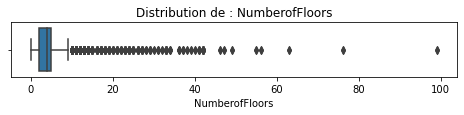

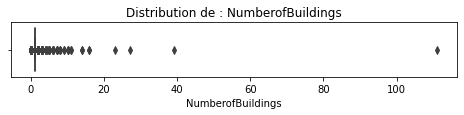

In [40]:

for column in ["NumberofFloors", "NumberofBuildings"] :
    plt.figure(figsize = (8,1))
    
    sns.boxplot(x=df1[column])
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)


In [41]:
df1[["NumberofFloors", "NumberofBuildings"]].describe()

,NumberofFloors,NumberofBuildings
count,6708.000000,6708.000000
mean,4.695736,1.071407
std,5.476218,1.593505
min,0.000000,0.000000
25%,2.000000,1.000000
50%,4.000000,1.000000
75%,5.000000,1.000000
max,99.000000,111.000000


In [42]:
# Identifier les ligne dont le nombre des floor>80 ou nombre de batiment >100
floor_building_outlier=df1.loc[(df1['NumberofBuildings'] > 100) | (df1['NumberofFloors'] > 80)][[
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity']]
floor_building_outlier

,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
2727,1977,1,99,21948,0,21948,Worship Facility,21948.0,80.0,14.900000,14.9,46.599998,46.599998,3.260012e+05,326001.1875,0.0,326001.0,0.0,2.27,0.10
2728,1977,1,99,21948,0,21948,Worship Facility,21948.0,54.0,14.500000,14.5,45.500000,45.500000,3.182050e+05,318205.0000,0.0,318218.0,0.0,2.22,0.04
6588,1900,111,0,9320156,0,9320156,College/University,9320156.0,NaN,93.800003,0.0,246.600006,0.000000,8.739237e+08,0.0000,84985240.0,657074389.0,0.0,11140.56,1.20


In [43]:
df1.drop(floor_building_outlier.index, axis = 0, inplace = True)

In [44]:

# Remplacer la valeur 0 de "Numero of Building" & "Numero of FLoor" par 1 
df1.loc[df1['NumberofBuildings']== 0, 'NumberofBuildings' ]= 1

df1.loc[df1['NumberofFloors']== 0, 'NumberofFloors']= 1

In [45]:
# Check point
df1[["NumberofFloors", "NumberofBuildings"]].describe()

,NumberofFloors,NumberofBuildings
count,6705.000000,6705.000000
mean,4.671290,1.068755
std,5.226886,0.849795
min,1.000000,1.000000
25%,2.000000,1.000000
50%,4.000000,1.000000
75%,5.000000,1.000000
max,76.000000,39.000000


### Détecter les valeurs aberrantes pour la superficie des bâtiments

In [46]:
# Idnetifier les variables de surface
surface_var = search_string(df1, 'GFA')

df1[surface_var].describe()

,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA
count,6.713000e+03,6713.000000,6.713000e+03,6.557000e+03,3238.000000,1156.000000
mean,9.146066e+04,9523.852227,8.193681e+04,7.568653e+04,28074.100153,11262.497750
std,1.499521e+05,33875.020760,1.317124e+05,1.235190e+05,53473.984688,26287.655182
min,1.128500e+04,-3.000000,-5.055000e+04,5.656000e+03,0.000000,0.000000
25%,2.849200e+04,0.000000,2.728800e+04,2.502100e+04,4993.000000,2325.000000
50%,4.401600e+04,0.000000,4.218800e+04,3.953000e+04,10631.000000,5039.000000
75%,8.939200e+04,0.000000,8.112000e+04,7.417800e+04,26462.000000,10270.000000
max,2.200000e+06,512608.000000,2.200000e+06,1.719643e+06,686750.000000,459748.000000


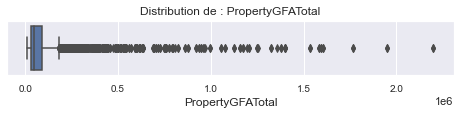

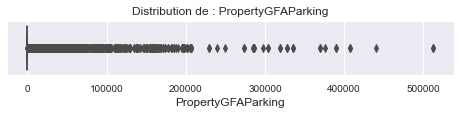

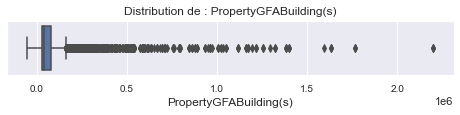

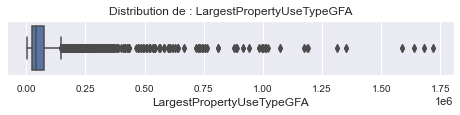

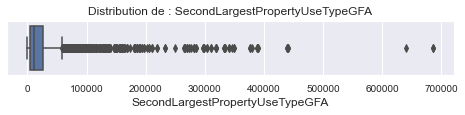

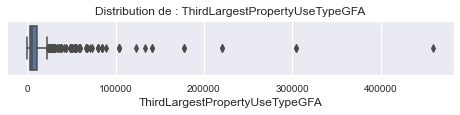

In [47]:
for column in surface_var :
    plt.figure(figsize = (8,1))
    
    sns.boxplot(x=df1[column])
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)


In [48]:
# Identifier les bâtiment avec le surface <0

parking_building = df1.loc[(df['PropertyGFAParking'] < 0) | (df1['PropertyGFABuilding(s)'] < 0)][[
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity']]
parking_building

,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
4827,1964,1,5,20967,-3,20970,Multifamily Housing,20967.0,81.0,25.7,27.5,80.8,86.4,539271.0,576638.0,0.0,539293.0,0.0,3.76,0.07
6231,2000,1,11,68452,-2,68454,Office,61665.0,81.0,53.6,58.3,168.4,182.9,3670298.0,3988260.0,0.0,3670451.0,0.0,25.59,0.14
6238,1982,1,5,54015,97325,-43310,Office,54015.0,65.0,64.0,64.0,200.9,200.9,3455247.0,3455247.0,0.0,3455391.0,0.0,24.09,0.17
6617,2014,1,3,33648,84198,-50550,Parking,83600.0,NaN,35.6,35.6,111.9,111.9,1389553.0,1389553.0,0.0,1389610.0,0.0,9.69,0.11


In [49]:
# supprimer les lignes pour PropertyGFAParking et PropertyGFABuilding(s) < 0

df1.drop(parking_building.index , axis = 0, inplace = True)


- Il y trois lignes avec le surface total supérieur à 2.000.000 sqaure feet(~185,806.1 m2)
- On peut donc les supprimer 

In [50]:
# Vérifier les anomalies pour les bâtiment dont le surface total > surface parking + surface building
df1[df1['PropertyGFATotal'] > df1['PropertyGFAParking'] + df1["PropertyGFABuilding(s)"]]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,address,ZipCode,CouncilDistrictCode,Neighborhood,latitude,longitude,...,SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity


- Il n'y a pas d'anomalie pour le surface total par rapport avec celui de parking et de building

In [51]:
df1[surface_var].max()

PropertyGFATotal                   2200000.0
PropertyGFAParking                  512608.0
PropertyGFABuilding(s)             2200000.0
LargestPropertyUseTypeGFA          1719643.0
SecondLargestPropertyUseTypeGFA     686750.0
ThirdLargestPropertyUseTypeGFA      459748.0
dtype: float64

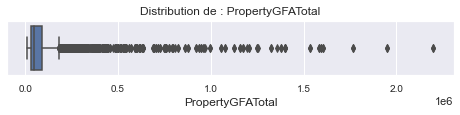

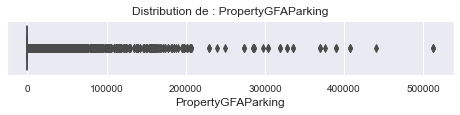

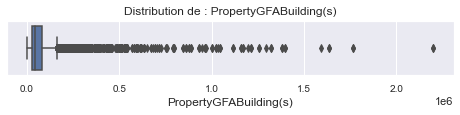

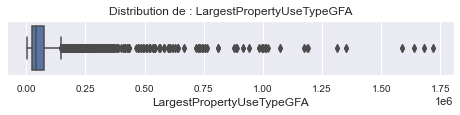

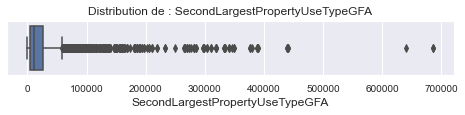

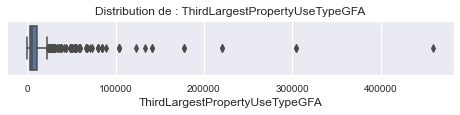

In [52]:
for column in surface_var :
    plt.figure(figsize = (8,1))
    
    sns.boxplot(x=df1[column])
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)

- On va identifier manintenant les bâtiment avec la surface max , ( > 2.000.000 squeer feet = 204386.7m²

Format)

In [53]:
surfac_extreme =df1.loc[(df1['PropertyGFATotal'] > 2000000) | (df1['PropertyGFABuilding(s)'] > 2000000)][['OSEBuildingID',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'DataYear',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType',
       'ENERGYSTARScore',
      'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity']]


surfac_extreme

,OSEBuildingID,YearBuilt,NumberofBuildings,NumberofFloors,DataYear,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,ENERGYSTARScore,SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
3000,22062,1939,39,2,2015,2200000,0,2200000,College/University,NaN,131427232.0,0.0,62416157.0,52666569.0,3232.23,1.35
3001,22062,1939,1,2,2016,2200000,0,2200000,College/University,NaN,123205560.0,0.0,61672821.0,52975694.0,3243.48,1.47


Les bâtiment dont le surface > 2000000 est un université. On le garde.

###  Détecter les valeurs aberrantes pour la consommation de l’énergie

- Pour le traitement des valeurs abérrantes notre stratégie consiste en deux étapes : 
   -  Détecter et supprimer les anomalies dans tout le jeu de données 
   -  Détecter et supprimer les anomalie pour les bâtiment dont on a des observations sur deux ans (2015, 2015)
   
#### - Détecter les valeures abérrantes de la consommation énergétique
- On va essayer 3 méthodes  : 
    - IQR méthod
    -  kd-tree (quick nearest-neighbor lookup)
    -  k-nearest neighbors


In [54]:
df1[['Electricity(kBtu)', 'NaturalGas(kBtu)', "SteamUse(kBtu)", 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)']].describe()



,Electricity(kBtu),NaturalGas(kBtu),SteamUse(kBtu),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf)
count,6.690000e+03,6.690000e+03,6.690000e+03,6.694000e+03,6.693000e+03,6692.000000,6693.000000,6690.000000,6690.000000
mean,3.495149e+06,1.312595e+06,2.500790e+05,5.068103e+06,5.244089e+06,54.193873,57.336366,133.515366,138.400792
std,9.604097e+06,5.688442e+06,3.558413e+06,1.471354e+07,1.501622e+07,55.122419,56.409109,135.727743,135.348164
min,-1.154170e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,-2.000000,-2.100000
25%,6.374082e+05,0.000000e+00,0.000000e+00,9.204910e+05,9.822860e+05,27.600000,29.600000,74.000000,79.200000
50%,1.167560e+06,3.061365e+05,0.000000e+00,1.791385e+06,1.928447e+06,38.000000,40.900000,95.600000,102.099999
75%,2.789499e+06,1.150674e+06,0.000000e+00,4.135558e+06,4.380680e+06,60.200000,65.000000,143.899994,149.775000
max,2.847263e+08,2.979090e+08,1.349435e+08,4.483853e+08,4.716139e+08,834.400024,834.400024,2620.000000,2620.000000


In [55]:
# Idnetifier toutes les variables qui nous rensignent sur la consommation de l'énergie

l1 =search_string(df1, 'EnergyUse')
l2 = search_string(df1, 'EUI')

energy_var = l1+l2#+l3+l4+l5

df1[energy_var].describe()

,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf)
count,6.694000e+03,6.693000e+03,6692.000000,6693.000000,6690.000000,6690.000000
mean,5.068103e+06,5.244089e+06,54.193873,57.336366,133.515366,138.400792
std,1.471354e+07,1.501622e+07,55.122419,56.409109,135.727743,135.348164
min,0.000000e+00,0.000000e+00,0.000000,0.000000,-2.000000,-2.100000
25%,9.204910e+05,9.822860e+05,27.600000,29.600000,74.000000,79.200000
50%,1.791385e+06,1.928447e+06,38.000000,40.900000,95.600000,102.099999
75%,4.135558e+06,4.380680e+06,60.200000,65.000000,143.899994,149.775000
max,4.483853e+08,4.716139e+08,834.400024,834.400024,2620.000000,2620.000000


In [56]:
# Identifier et supprimer les lignes avec la consommation énergétique <= 0
for i in energy_var:
    index_anomalie = df1[df1[i]<=0].index
print(index_anomalie)

Int64Index([  57,   63,   89,  125,  162,  171,  190,  264,  276,  302,  412,
             443,  494,  570,  609,  702,  897,  979, 1011, 1027, 1123, 1139,
            1150, 1222, 1230, 1260, 1499, 1519, 1528, 1775, 1776, 1918, 1919,
            2223, 2654, 2731, 3113, 3782, 3805, 4280, 5603, 5617, 6374, 6452,
            6453, 6589, 6591, 6628, 6658],
           dtype='int64')


In [57]:
df1.drop(labels = index_anomalie, inplace = True)

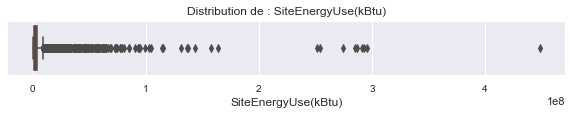

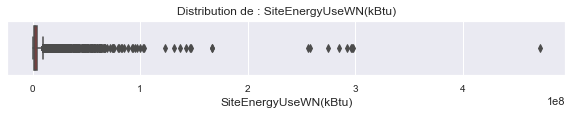

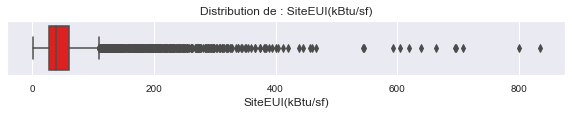

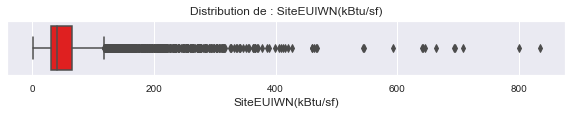

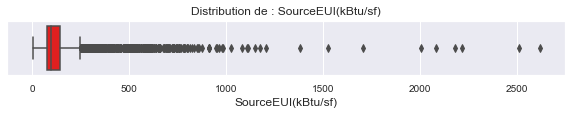

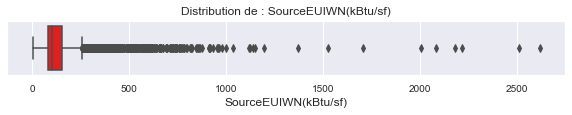

In [58]:
# Visualisation des valeurs abérrantes de la consommaiton de l"énergie
for column in energy_var:
    plt.figure(figsize = (10,1))
    
    sns.boxplot(x=df1[column],color  = 'red')
   
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)

#### IQR Score

In [59]:
def iqr_supprimer_outliers(df_in):
     for col in energy_var:
        q1 = df_in[col].quantile(0.05)
        q3 = df_in[col].quantile(0.95)
        iqr = q3-q1 #Interquartile range
        fence_low  = q1-1.5*iqr
        fence_high = q3+1.5*iqr
        df_out= df_in.loc[(df_in[col] > fence_low) & (df_in[col] < fence_high)]
        return(df_out)
    
outlier_removed= iqr_supprimer_outliers(df1[energy_var]).index


df_new= df1[df1.index.isin(outlier_removed)]


print("Nombre des lignes supprimées après le traitment des valeurs abberantes avec IQR score :", df1.shape[0]- df_new.shape[0])

Nombre des lignes supprimées après le traitment des valeurs abberantes avec IQR score : 117


In [60]:
# Check point
df_new[energy_var].describe()

,SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf)
count,6.543000e+03,6.543000e+03,6543.000000,6543.000000,6539.000000,6539.000000
mean,3.762731e+06,3.960476e+06,52.491105,55.854776,129.355192,134.836993
std,5.572900e+06,5.728911e+06,50.494348,51.947777,119.789963,119.676118
min,1.144100e+04,1.144100e+04,0.200000,0.200000,0.800000,0.800000
25%,9.177559e+05,9.843860e+05,27.500000,29.600000,74.000000,79.400002
50%,1.756668e+06,1.904848e+06,37.700000,40.700000,95.099998,101.700000
75%,3.914678e+06,4.192769e+06,59.200001,64.199997,141.200000,147.100006
max,4.304853e+07,4.568456e+07,834.400024,834.400024,2620.000000,2620.000000


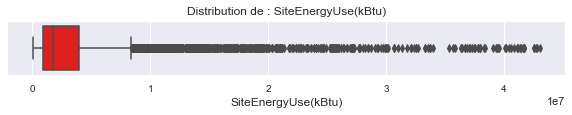

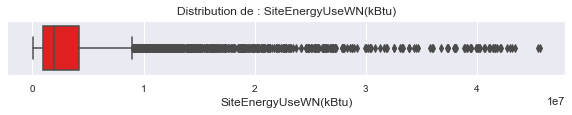

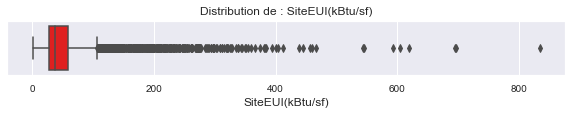

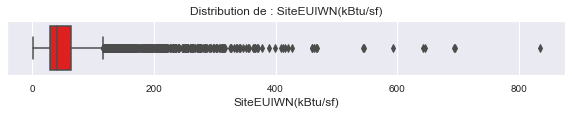

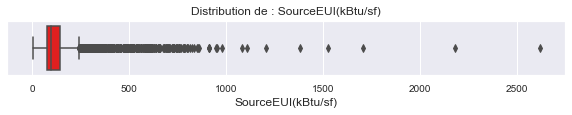

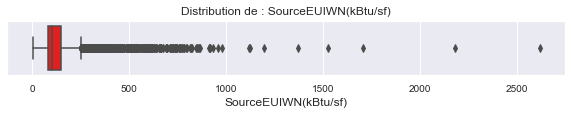

In [61]:
# Visualisation des outliers après le traitement avec IQR score
for column in energy_var:
    
    plt.figure(figsize = (10,1))
   
    sns.boxplot(x=df_new[column],color  = 'red')
 
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)

#### Kd_tree méthode

- A présent on va essayer de détecter et supprimer les valeurs abérantes de la consommation énergétique avec la méthode de kd-tree (quick nearest-neighbor lookup) 

In [62]:
from sklearn.neighbors import KDTree

energy_data = df1[energy_var].copy().dropna()
print(energy_data.shape)

#outliers éloignés par rapport à leurs voisins
kdt = KDTree(energy_data)

dist, ind = kdt.query(energy_data, k=5, return_distance=True)
energy_data['3N_distance'] = np.mean(dist, axis=1)    
energy_data2 = energy_data[energy_data['3N_distance'] < energy_data['3N_distance'].quantile(0.95)]
index_to_drop = energy_data2.index.tolist()
print("Nbr de lignes supprimées avec kdt", len(index_to_drop))


(6641, 6)
Nbr de lignes supprimées avec kdt 6308


- On constate que la méthode kdt pour détecter et supprimer les valeurs aberrante nous fait perdre beaucoup de donnée 

#### K-Nearest Neighbors méthode

Text(0.5, 1.0, 'distances moyennes pour chaque observation')

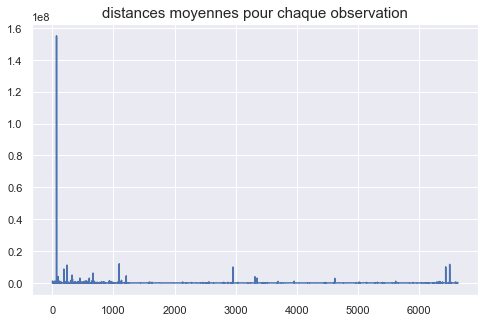

In [63]:
from sklearn.neighbors import NearestNeighbors


energy_value = df1[energy_var].dropna().values


nbrs = NearestNeighbors(n_neighbors = 3)
# fit model
nbrs.fit(energy_value)



# distances et indexes de k-neaighbors 
distances, indexes = nbrs.kneighbors(energy_value)

# plot la moyenne de k-distances de chaque observataion
plt.figure(figsize=(8,5))
plt.plot(distances.mean(axis =1))


plt.title('distances moyennes pour chaque observation', fontsize= 15)



- On constate qu'il y a des pics dans les mesures de distance, et ces pics sont potentiellement des anomalies ou des valeurs aberrantes dans l'ensemble de données.

- On détermine une valeur seuil de 0.02e+7  pour filtrer les anomalies

In [64]:
# visually determine cutoff values > 0.15
outlier_indexes = np.where(distances.mean(axis = 1) > 0.02e+7)
# filter outlier values
outlier_values = df1.iloc[outlier_indexes]
outlier_values.index

Int64Index([   4,    5,    6,   34,   35,   40,   41,   42,   43,   70,
            ...
            6433, 6486, 6489, 6545, 6546, 6551, 6552, 6581, 6651, 6677],
           dtype='int64', length=232)

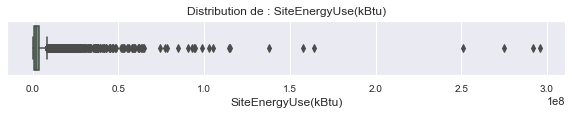

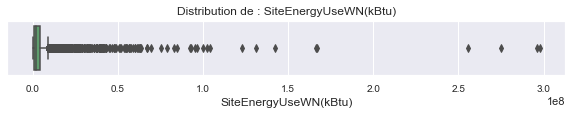

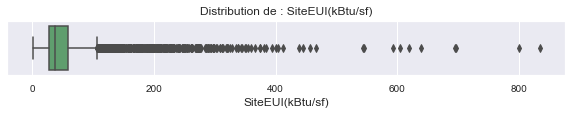

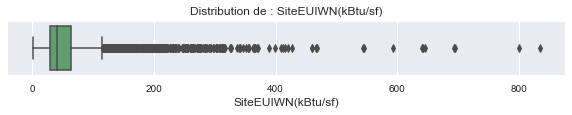

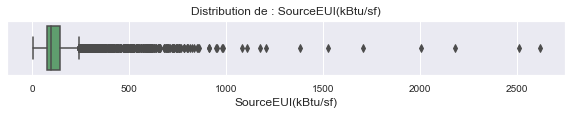

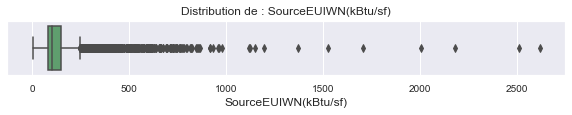

In [65]:
df_knn = df1[~df1.index.isin(outlier_values.index)]


for column in energy_var:
    plt.figure(figsize = (10,1))
    
    sns.boxplot(x=df_knn[column],color  = 'g')
   
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)

- On peut constater que la méthode de k-Nearest Neighbors (kNN) pour détecter et supprimer les outliers n'est pas pertinete pour notre jeu de donnée.
- **Le choix final pour le traitement des valuers aberrantes est donc la méthode IQR.** 

### 	Détecter les valeurs aberrantes pour l’émission de CO2

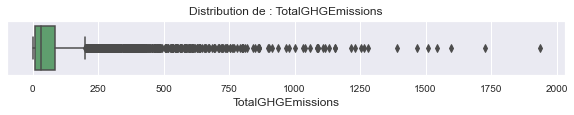

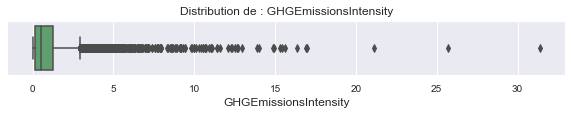

In [66]:
# Idnetifier toutes les variables sur l'émission de GHG 
ghg_var = search_string(df_new, 'GHG')
for column in ghg_var:
    plt.figure(figsize = (10,1))
    
    sns.boxplot(x=df_new[column],color  = 'g')
   
    chaine = 'Distribution de : ' + column
    plt.title(chaine)
    plt.xlabel(column)
    plt.xticks(fontsize = 10)
    plt.show()
    
sns.set(font_scale=1)

In [67]:
df_new[ghg_var].describe()

,TotalGHGEmissions,GHGEmissionsIntensity
count,6539.000000,6539.000000
mean,80.008786,1.042295
std,139.099471,1.613441
min,0.080000,0.000000
25%,9.260000,0.160000
50%,32.420000,0.530000
75%,86.385000,1.260000
max,1936.340000,31.380000


In [68]:
# Identifier et supprimer les lignes avec GHGEmissionsIntensity =0

df_new[df_new['GHGEmissionsIntensity']== 0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,address,ZipCode,CouncilDistrictCode,Neighborhood,latitude,longitude,...,SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
1192,797,2015,NonResidential,Refrigerated Warehouse,303 S RIVER ST,98108,2,GREATER DUWAMISH,47.543298,-122.330878,...,0.9,2.9,2.9,93802.00000,93802.0,0.0,93806.0,0.0,0.65,0.0
2465,21315,2016,NonResidential,Small- and Mid-Sized Office,1520 FIFTH AVE,98101.0,7,DOWNTOWN,47.611190,-122.335810,...,1.0,3.0,3.0,24105.50000,24105.5,0.0,24105.0,0.0,0.17,0.0
2466,21315,2015,NonResidential,Small- and Mid-Sized Office,1520 5TH AVE,98101,7,DOWNTOWN,47.611309,-122.335723,...,1.8,5.5,5.5,43943.00000,43943.0,0.0,43945.0,0.0,0.31,0.0
2598,21474,2015,NonResidential,Other,1315 1ST AVE,98101,7,DOWNTOWN,47.607051,-122.339036,...,1.0,3.2,3.2,24126.00000,24126.0,0.0,24127.0,0.0,0.17,0.0
3169,22548,2015,NonResidential,Self-Storage Facility\n,2648 15TH AVE W,98119,7,MAGNOLIA / QUEEN ANNE,47.644213,-122.375748,...,1.4,4.2,4.3,53401.00000,55113.0,0.0,53404.0,0.0,0.37,0.0
3811,23730,2015,NonResidential,Non-Refrigerated Warehouse,4021 13TH AVE W,98119,7,MAGNOLIA / QUEEN ANNE,47.656859,-122.375239,...,0.2,0.8,0.8,11441.00000,11441.0,0.0,11442.0,0.0,0.08,0.0
4399,24717,2016,NonResidential,Other,1701 FIRST AVE SOUTH,98134.0,2,GREATER DUWAMISH,47.587880,-122.334580,...,0.7,2.1,2.2,16808.90039,17260.0,0.0,16809.0,0.0,0.12,0.0
4400,24717,2015,NonResidential,Other,1701 1ST AVE S,98134,2,GREATER DUWAMISH,47.587876,-122.334577,...,0.7,2.2,2.2,17150.00000,17150.0,0.0,17150.0,0.0,0.12,0.0
6680,50071,2016,Multifamily MR (5-9),Mid-Rise Multifamily,801 E THOMAS ST,98102.0,3,EAST,47.621070,-122.321560,...,0.4,1.1,1.1,13409.00000,13409.0,0.0,13409.0,0.0,0.09,0.0


In [69]:
# Supprimer les anomalie
ghg_anomalie = df_new[df_new['GHGEmissionsIntensity']== 0].index

len(ghg_anomalie)
df_new.drop(labels= ghg_anomalie, inplace = True)

### Détecter les anomalies pour consommation entre 2015 et 2016 pour les bâtiments identiques

- A présent on va traiter les valeurs aberrantes de la consommation de l'énergie sous deux ans 

In [70]:
# Idnentifier les bâtiments dont on a la relevé de la consommation de l'energie sous deux ans
df_two_years = df_new.groupby("OSEBuildingID").filter(lambda x: len(x) > 1).sort_values(by='OSEBuildingID')

energy_consom = pd.DataFrame(df_two_years.groupby('OSEBuildingID')['SiteEnergyUse(kBtu)'].agg(['max','min']))

energy_consom.columns = ['max_energy', 'min_energy']
energy_consom['ecart'] = (abs(energy_consom['min_energy']-energy_consom['max_energy']) / energy_consom['min_energy'])*100
energy_consom

,max_energy,min_energy,ecart
OSEBuildingID,,,
1,7.226362e+06,6981428.0,3.508372
2,8.387933e+06,8354235.0,0.403364
5,2.822932e+07,6794584.0,315.467967
8,1.482910e+07,14172606.0,4.632126
9,1.208662e+07,12051984.0,0.287355
...,...,...,...
50049,1.248599e+06,1142949.0,9.243632
50055,1.625696e+06,1543282.0,5.340161
50057,1.683441e+07,15404161.0,9.284848


In [71]:
energy_consom[['ecart']].describe().T

,count,mean,std,min,25%,50%,75%,max
ecart,3169.0,12.175443,58.692687,0.002401,1.981562,4.437655,9.709197,1990.526811


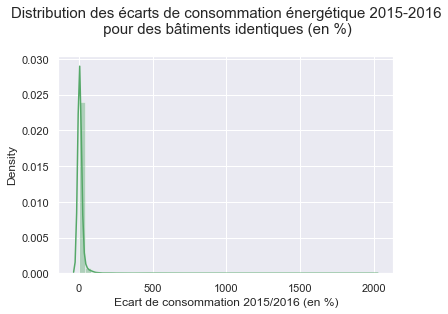

In [74]:
plt.title('Distribution des écarts de consommation énergétique 2015-2016\n pour des bâtiments identiques (en %)\n', fontsize= 15)
sns.distplot(energy_consom['ecart'], color = 'g')
plt.xlabel('Ecart de consommation 2015/2016 (en %)')
plt.savefig("Ecart energy", bbox_inches='tight')
plt.show()

<AxesSubplot:xlabel='ecart'>

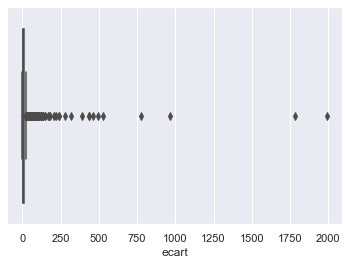

In [75]:
sns.boxplot(energy_consom['ecart'])

In [76]:
# identifier le batiment avec maximum de l'ecart de la consommation de l'énergie

max_ecart= energy_consom[energy_consom['ecart'] ==energy_consom['ecart'].max()].index
df[df['OSEBuildingID'].isin(max_ecart)][['BuildingType','YearBuilt', 
                                                'LargestPropertyUseType','PrimaryPropertyType',
                                                'SecondLargestPropertyUseType', 
                                                 'ThirdLargestPropertyUseType',
                                                 'NumberofBuildings', 'NumberofFloors',
                                                 'PropertyGFATotal', 'PropertyGFAParking',
                                                  'PropertyGFABuilding(s)']]


,BuildingType,YearBuilt,LargestPropertyUseType,PrimaryPropertyType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s)
4091,NonResidential,1960,Other,Other,NaN,NaN,1,1,27933,0,27933
4092,NonResidential,1960,Other,Other,NaN,NaN,1,1,27933,0,27933


In [77]:
# Idnetifier les bâtiements dont l'écart de la consommation sous deux ans est suppérieur à 20 
id_ecart_high=  energy_consom.loc[energy_consom["ecart"] >20].index
high_energy_ecart = df_two_years[df_two_years["OSEBuildingID"].isin(energy_consom[energy_consom['ecart']> 40].index)][['YearBuilt', 
                                                'LargestPropertyUseType','PrimaryPropertyType',
                                                'SecondLargestPropertyUseType',]]
print("nombre des batiments dont l'ecart de la consommation de l'energie sur deux ans est > 20 % :\n",high_energy_ecart.shape[0])
high_energy_ecart.sort_values(by = 'YearBuilt', ascending= True)

nombre des batiments dont l'ecart de la consommation de l'energie sur deux ans est > 20 % :
 282


,YearBuilt,LargestPropertyUseType,PrimaryPropertyType,SecondLargestPropertyUseType
1573,1900,Office,Small- and Mid-Sized Office,Restaurant
4706,1900,Multifamily Housing,Low-Rise Multifamily,NaN
4707,1900,Multifamily Housing,Low-Rise Multifamily,NaN
1572,1900,Office,Small- and Mid-Sized Office,Restaurant
2225,1900,Office,Small- and Mid-Sized Office,NaN
...,...,...,...,...
6511,2014,Office,Large Office,Parking
6512,2014,Office,Large Office,Parking
6627,2014,Senior Care Community,Senior Care Community,NaN
6626,2014,Senior Care Community,Senior Care Community,NaN


- **Pour certains batiments, on ne constate aucun changement d'usage qui aurait pu expliquer l'ecart entre la consommation de l'energy sur deux ans.
- **Pour simplifier on va donc supprimer lse valeurs extrêmes.**

<AxesSubplot:xlabel='SiteEnergyUse(kBtu)'>

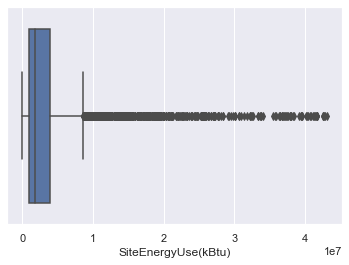

In [78]:
sns.boxplot(df_new[~df_new['OSEBuildingID'].isin(id_ecart_high)]['SiteEnergyUse(kBtu)'])

In [79]:
df2 = df_new[~df_new['OSEBuildingID'].isin(id_ecart_high)]
df2.shape

(5904, 35)

### Détecter les anomalies  pour l’émission de CO2 entre 2015 et 2016 pour les bâtiments identiques

In [80]:
df_two_years2 = df2.groupby("OSEBuildingID").filter(lambda x: len(x) > 1).sort_values(by='OSEBuildingID')

emission_ecart = pd.DataFrame(df_two_years2.groupby('OSEBuildingID')['TotalGHGEmissions'].agg(['max','min']))

emission_ecart.columns = ['max_emission', 'min_emission']
emission_ecart['ecart'] = (abs(emission_ecart['min_emission']-emission_ecart['max_emission']) / emission_ecart['min_emission'])*100
emission_ecart
#energy_consom.sort_values(by = 'ecart', ascending = False).head()

,max_emission,min_emission,ecart
OSEBuildingID,,,
1,249.98,249.43,0.220503
2,295.86,263.51,12.276574
8,507.70,505.01,0.532663
9,304.62,301.81,0.931049
10,208.46,176.14,18.349041
...,...,...,...
50049,8.70,7.97,9.159348
50055,31.46,30.69,2.508961
50057,627.97,395.26,58.875171


In [81]:
emission_ecart[['ecart']].describe().T

,count,mean,std,min,25%,50%,75%,max
ecart,2854.0,7.838323,11.074411,0.0,2.160466,4.994743,9.975883,226.686641


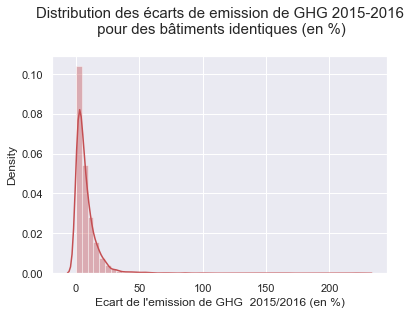

In [84]:

plt.title('Distribution des écarts de emission de GHG 2015-2016\n pour des bâtiments identiques (en %)\n', fontsize= 15)
sns.distplot(emission_ecart['ecart'], color = 'r')
plt.xlabel("Ecart de l'emission de GHG  2015/2016 (en %)")
#plt.savefig("Ecart de l'emission de GHG", bbox_inches='tight')
plt.show()

In [85]:
# idnetifier le batiment avec maximum de l'emission de GHG sur deux ans

max_emission_ecart= emission_ecart[emission_ecart['ecart'] ==emission_ecart['ecart'].max()].index
df2.loc[(df2["OSEBuildingID"].isin(max_emission_ecart))][['BuildingType','YearBuilt', 
                                                'LargestPropertyUseType','PrimaryPropertyType',
                                                'SecondLargestPropertyUseType']]


,BuildingType,YearBuilt,LargestPropertyUseType,PrimaryPropertyType,SecondLargestPropertyUseType
579,Campus,1908,Retail Store,Mixed Use Property,Other - Restaurant/Bar
580,Campus,1908,Retail Store,Mixed Use Property,Other - Restaurant/Bar


<AxesSubplot:xlabel='ecart'>

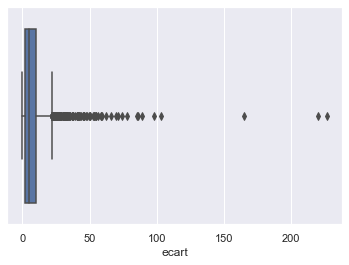

In [86]:
sns.boxplot(emission_ecart['ecart'])

In [87]:
id_high_emission = emission_ecart[emission_ecart["ecart"] > 20].sort_values(by = "ecart").index

df_high_emission = df_two_years2[df_two_years2["OSEBuildingID"].isin(id_high_emission)][['OSEBuildingID','BuildingType','DataYear','YearBuilt', 
                                                'LargestPropertyUseType','PrimaryPropertyType',
                                                'SecondLargestPropertyUseType']]
print("Nombre des batiment dont l'écart de l'emission de GHG est >100%: \n", df_high_emission.shape[0])
df_high_emission.sort_values(by = 'OSEBuildingID')

Nombre des batiment dont l'écart de l'emission de GHG est >100%: 
 394


,OSEBuildingID,BuildingType,DataYear,YearBuilt,LargestPropertyUseType,PrimaryPropertyType,SecondLargestPropertyUseType
48,30,NonResidential,2016,1928,College/University,University,NaN
49,30,NonResidential,2015,1928,College/University,College/University,NaN
126,89,NonResidential,2015,1965,Medical Office,Medical Office,NaN
127,89,NonResidential,2016,1965,Medical Office,Medical Office,NaN
150,112,Nonresidential COS,2016,1928,Other,Other,NaN
...,...,...,...,...,...,...,...
6587,49966,NonResidential,2015,2009,Pre-school/Daycare,Other,NaN
6609,49998,NonResidential,2015,2014,Self-Storage Facility,Self-Storage Facility\n,NaN
6610,49998,NonResidential,2016,2014,Self-Storage Facility,Self-Storage Facility,NaN
6669,50057,Multifamily HR (10+),2016,2015,Multifamily Housing,High-Rise Multifamily,Other - Lodging/Residential


- **Pour certains batiments, on ne constate aucun changement d'usage qui aurait pu expliquer l'ecart entre la consommation de l'energy sur deux ans.
Pour simplifier on va donc supprimer lse valeurs extrêmes.**

In [88]:
df3 = df2.loc[(~df2['OSEBuildingID'].isin(id_high_emission))]
df3.shape

(5510, 35)

## Traiter des valeurs manquante

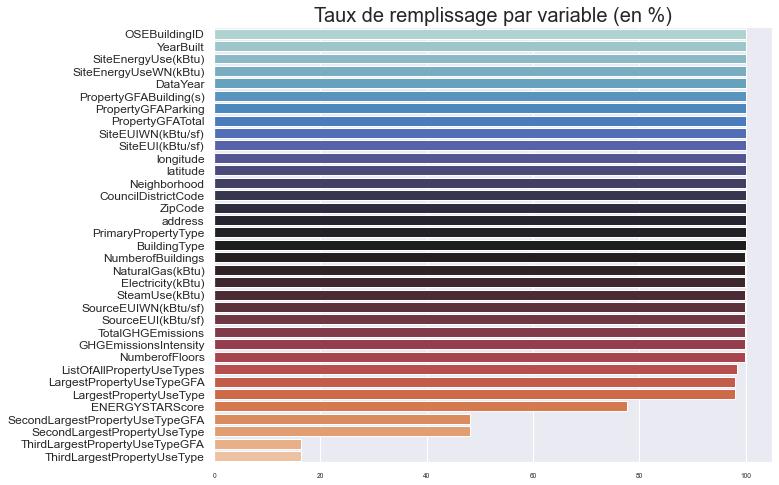

In [89]:
#Taux de remplissage par variables 
rempli = (((df3.shape[0]-df3.isnull().sum())/df3.shape[0])*100).sort_values(ascending = False)


# Visualiser le taux de remplissage de jeu de données
plt.figure(figsize=(10,8))
sns.set(font_scale = 0.6)
ax = sns.barplot(y = rempli.index, x=rempli.values, palette="icefire")
plt.yticks(fontsize= 12)
plt.title('Taux de remplissage par variable (en %)', size=20)
plt.savefig("Taux de remplissage par variables", bbox_inches='tight')
plt.show()

In [90]:
# Pourcentage valeur manquantes pour 2015
print("taux total de null: ", round(taux_null_total(df2)))
taux_null(df3)

taux total de null:  9
                                         0
OSEBuildingID                     0.000000
DataYear                          0.000000
BuildingType                      0.000000
PrimaryPropertyType               0.000000
address                           0.000000
ZipCode                           0.000000
CouncilDistrictCode               0.000000
Neighborhood                      0.000000
latitude                          0.000000
longitude                         0.000000
YearBuilt                         0.000000
NumberofBuildings                 0.054446
NumberofFloors                    0.090744
PropertyGFATotal                  0.000000
PropertyGFAParking                0.000000
PropertyGFABuilding(s)            0.000000
ListOfAllPropertyUseTypes         1.651543
LargestPropertyUseType            1.978221
LargestPropertyUseTypeGFA         1.978221
SecondLargestPropertyUseType     51.851180
SecondLargestPropertyUseTypeGFA  51.851180
ThirdLargestPropertyUseType    

<AxesSubplot:title={'center':'Distribution du nombre de NaN par colonne'}, ylabel='Count'>

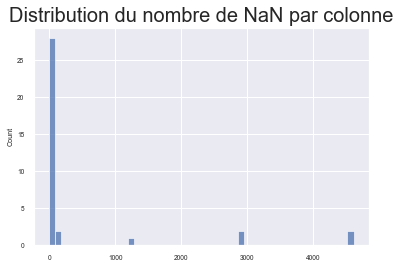

In [91]:
plt.title('Distribution du nombre de NaN par colonne', fontsize = 20)
sns.histplot(df3.isna().sum(axis=0), bins=50)

- On constate qu'à part de deux variables 'ThirdLargestPropetyType' et 'ThirdLargestPropertyTypeGFA' avec les valuer null de plus 88% les autres sont bien renseignées.
- On va vérifier le type de missingness de des valeurs manquantes avec le "Matrix de Missingo" 

### Identifier le type de missingness dans le jeu de données

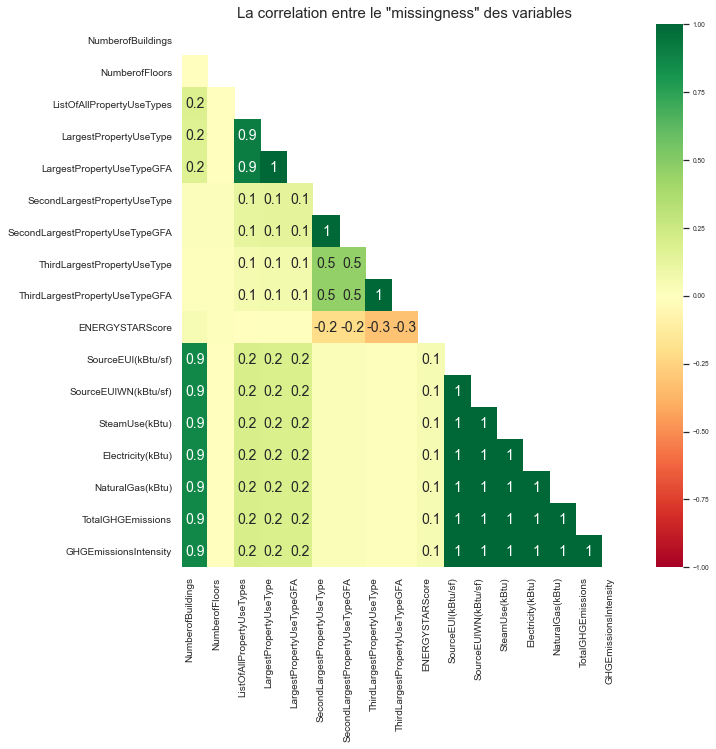

In [92]:
msno.heatmap(df3, figsize=(10, 10), cmap="RdYlGn")
plt.xticks(rotation= 90, fontsize = 10)
plt.yticks(fontsize = 10)
plt.title('La correlation entre le "missingness" des variables', size = 15)
plt.savefig('msno_heatmap.png', bbox_inches='tight')

<AxesSubplot:>

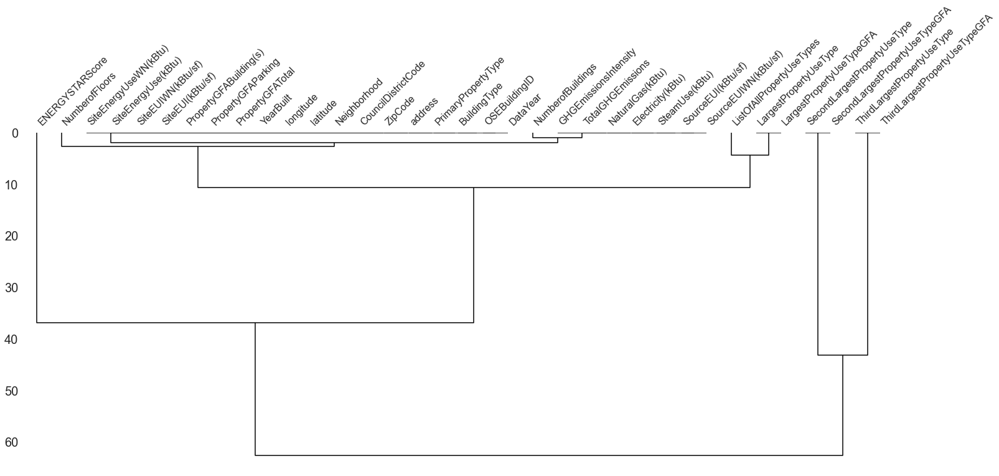

In [93]:
msno.dendrogram(df2)


- On constate une forte corrélation de "missingness" entre les variables sur la consommations de l'énergie. 
- On vérifie cela avec le matrix de missingo 

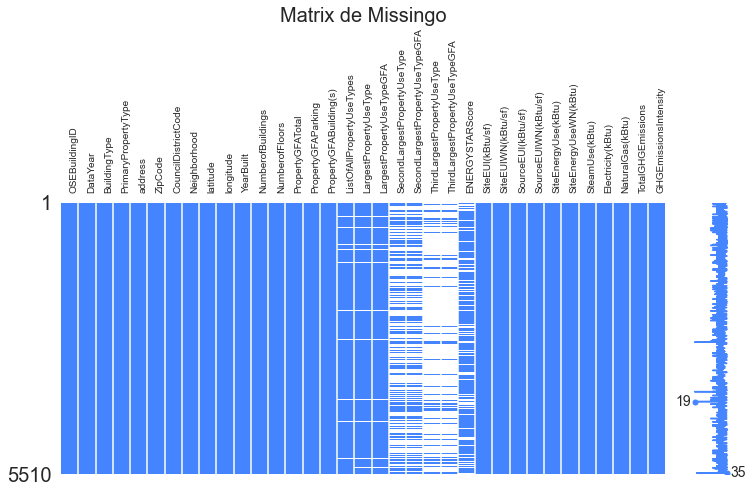

In [94]:
# Visualiser les valuers manquantes avec matrix plot
msno.matrix(df3, figsize=(12, 5), color=(0.27, 0.52, 1.0))
plt.xticks(rotation= 90, fontsize = 10)
plt.title("Matrix de Missingo", fontsize = 20)
plt.savefig("missingness",bbox_inches='tight') 


- On constate que pour les variables relatives aux second & third property use, le valeurs manquantes ne sont pas au hasard.Elles auront une relation systématique entre eux. 
- Pour les autres variable les valeurs manquantes sont aléatoirs et leur nombre est faible. Les valeurs manquant sont donc complètement au hasard (MCAR = Missing Completely At Random).
- On va supprimer donc les variables avec plus de 80% de valeurs manquantes

In [95]:
df_new2 = df3.drop([ 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA'], axis= 1)

### Les valeurs manquantes des variables numériques et catégorielles

In [96]:
# Convertir le typage de deux variavles "NumerofFloors" ,  "NumberofBuildings"" 
#pour remplacer les valeur Null par le moyenne

df_new2['NumberofFloors'] = df_new2['NumberofFloors'].astype(float)
df_new2['NumberofBuildings'] = df_new2['NumberofBuildings'].astype(float)

for i in df_new2.select_dtypes(['int64', 'float64']).columns.tolist():
    df_new2[i] = round(df_new2[i].fillna(df_new2[i].mean()), 2)
    

In [97]:
for i in df_new2.select_dtypes('object').columns.tolist():
    df_new2[i] = df_new2[i].fillna('no info')

In [98]:
taux_null(df_new2)

                                   0
OSEBuildingID                    0.0
DataYear                         0.0
BuildingType                     0.0
PrimaryPropertyType              0.0
address                          0.0
ZipCode                          0.0
CouncilDistrictCode              0.0
Neighborhood                     0.0
latitude                         0.0
longitude                        0.0
YearBuilt                        0.0
NumberofBuildings                0.0
NumberofFloors                   0.0
PropertyGFATotal                 0.0
PropertyGFAParking               0.0
PropertyGFABuilding(s)           0.0
ListOfAllPropertyUseTypes        0.0
LargestPropertyUseType           0.0
LargestPropertyUseTypeGFA        0.0
SecondLargestPropertyUseType     0.0
SecondLargestPropertyUseTypeGFA  0.0
ENERGYSTARScore                  0.0
SiteEUI(kBtu/sf)                 0.0
SiteEUIWN(kBtu/sf)               0.0
SourceEUI(kBtu/sf)               0.0
SourceEUIWN(kBtu/sf)             0.0
S

# 3-Regroupement de l’usage des bâtiment

In [99]:
building_types = sorted(df_new2['BuildingType'].unique())
print(building_types)

['Campus', 'Multifamily HR (10+)', 'Multifamily LR (1-4)', 'Multifamily MR (5-9)', 'NonResidential', 'Nonresidential COS', 'Nonresidential WA', 'SPS-District K-12']


In [100]:
largest_property_types = sorted(df_new2['LargestPropertyUseType'].unique())
largest_property_types

['Adult Education',
 'Automobile Dealership',
 'Bank Branch',
 'College/University',
 'Data Center',
 'Distribution Center',
 'Financial Office',
 'Fire Station',
 'Fitness Center/Health Club/Gym',
 'Food Service',
 'Hospital (General Medical & Surgical)',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Library',
 'Lifestyle Center',
 'Manufacturing/Industrial Plant',
 'Medical Office',
 'Movie Theater',
 'Multifamily Housing',
 'Museum',
 'Non-Refrigerated Warehouse',
 'Office',
 'Other',
 'Other - Education',
 'Other - Entertainment/Public Assembly',
 'Other - Lodging/Residential',
 'Other - Mall',
 'Other - Public Services',
 'Other - Recreation',
 'Other - Restaurant/Bar',
 'Other - Services',
 'Other - Utility',
 'Other/Specialty Hospital',
 'Outpatient Rehabilitation/Physical Therapy',
 'Parking',
 'Performing Arts',
 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
 'Police Station',
 'Prison/Incarceration',
 'Refrigerated Warehouse',
 'Repair Services (Vehicle, Shoe, Locksmit

In [101]:
usage = ['PrimaryPropertyType','SecondLargestPropertyUseType','LargestPropertyUseType']


for column in usage:
    print('Colonne {}, valeurs uniques :\n{}\n'.format(column, df_new2[column].unique()))
    
for column in usage:
    print('Colonne {}, {} valeurs uniques'.format(column, df_new2[column].nunique()))

Colonne PrimaryPropertyType, valeurs uniques :
['Hotel' 'Other' 'Mid-Rise Multifamily' 'Mixed Use Property' 'K-12 School'
 'Small- and Mid-Sized Office' 'Self-Storage Facility'
 'Self-Storage Facility\n' 'Large Office' 'Low-Rise Multifamily'
 'Senior Care Community' 'Retail Store' 'University' 'College/University'
 'Residence Hall/Dormitory' 'Residence Hall' 'Non-Refrigerated Warehouse'
 'Warehouse' 'Distribution Center\n' 'Distribution Center'
 'SPS-District K-12' 'Worship Facility' 'Supermarket/Grocery Store'
 'Supermarket / Grocery Store' 'Medical Office' 'Laboratory' 'Hospital'
 'Refrigerated Warehouse' 'High-Rise Multifamily' 'Restaurant\n'
 'Restaurant' 'Office']

Colonne SecondLargestPropertyUseType, valeurs uniques :
['no info' 'Parking' 'Office' 'Restaurant' 'K-12 School'
 'Non-Refrigerated Warehouse' 'Vocational School' 'Retail Store'
 'Personal Services (Health/Beauty, Dry Cleaning, etc)'
 'Other - Entertainment/Public Assembly' 'Data Center' 'Swimming Pool'
 'Other' 'Courth

- On constate que la variable "LargestPropertyUseType" a le nombre le plus élevé des valeurs uniques
- Cepandant on va examiner les valeurs unique des autres variables sur le type de bâtiment
- On constate aussi que des catégories sont des doublons avec un caractère d'échappement. ( ex. "Self-Storage Facility" & "Self-Storage Facility\n")
- On va donc les corriger.

In [102]:
for i in usage : 
    df_new2[i] = [re.compile(r'[\n\r\t]').sub("", item) for index, item in df_new2[i].iteritems()]
    df_new2[i] = [re.compile(r' / ').sub("/", item) for index, item in df_new2[i].iteritems()]
    
    
for i in usage : 
    df_new2[i] = df_new2[i].str.upper()


In [103]:
building_types_and_usages = {}

for building_type in building_types:
    temp = df_new2[df_new2['BuildingType']==building_type]['LargestPropertyUseType'].unique()
    building_types_and_usages[building_type]=temp.tolist()

display(HTML('<br />'))

i=0
for group,subgroups in building_types_and_usages.items():
    text = "<strong>" + group + ": </strong>"
    for subgroup in subgroups:
        text += subgroup + ", "
        i = i +1
    display(HTML(text+'<br />'))
    
display(HTML('<br />'))

print('Il y a {} groupe/sous-catégories et {} catégories uniques'.format(i,len(building_types_and_usages))) 


Il y a 91 groupe/sous-catégories et 8 catégories uniques


- On constate que les types d'usages des bâtiments (PropertyType) ne sont pas sous-catégories uniqes des types de bâtiments. 
-On constate aussi un usage de type "Low-Rise Multifamily" dans le type "NonResidential". 
- On va analyser cela


In [104]:
anomalie1=df_new2[(df_new2['BuildingType']=='NonResidential')& (df_new2['SecondLargestPropertyUseType'].str.contains("MULTIFAMILY"))][[
                                                                                                        'PrimaryPropertyType',
                                                                                                        'SecondLargestPropertyUseType',
                                                                                                        'LargestPropertyUseType']]
anomalie1

,PrimaryPropertyType,SecondLargestPropertyUseType,LargestPropertyUseType
976,MIXED USE PROPERTY,MULTIFAMILY HOUSING,PARKING
1081,MIXED USE PROPERTY,MULTIFAMILY HOUSING,NON-REFRIGERATED WAREHOUSE
1082,MIXED USE PROPERTY,MULTIFAMILY HOUSING,NON-REFRIGERATED WAREHOUSE
1836,MIXED USE PROPERTY,MULTIFAMILY HOUSING,RETAIL STORE
1837,MIXED USE PROPERTY,MULTIFAMILY HOUSING,RETAIL STORE
1856,OTHER,MULTIFAMILY HOUSING,OTHER - ENTERTAINMENT/PUBLIC ASSEMBLY
1857,OTHER,MULTIFAMILY HOUSING,OTHER - ENTERTAINMENT/PUBLIC ASSEMBLY
2638,MIXED USE PROPERTY,MULTIFAMILY HOUSING,OFFICE
2639,MIXED USE PROPERTY,MULTIFAMILY HOUSING,OFFICE
3563,MIXED USE PROPERTY,MULTIFAMILY HOUSING,OFFICE


In [105]:
df2[(df2['BuildingType']=='NonResidential')& (df2['LargestPropertyUseType'].str.contains("MULTIFAMILY"))][['BuildingType',
                                                                                                        'PrimaryPropertyType',
                                                                                                        'SecondLargestPropertyUseType',
                                                                                                        'LargestPropertyUseType'
                                                                                                                ]]



,BuildingType,PrimaryPropertyType,SecondLargestPropertyUseType,LargestPropertyUseType


- On va donc supprimer ces lignes qu'il s'agit d'un anomalie

In [106]:
df_new[df_new['PropertyGFATotal']< 20000][['BuildingType', 
                                           'PrimaryPropertyType',
                                           'SecondLargestPropertyUseType',
                                           'LargestPropertyUseType']]
                                                                                                                
                                                                                                

,BuildingType,PrimaryPropertyType,SecondLargestPropertyUseType,LargestPropertyUseType
4518,NonResidential,Distribution Center,NaN,Distribution Center
6701,Nonresidential COS,Other,NaN,Prison/Incarceration
6702,Nonresidential COS,Other,NaN,Prison/Incarceration
6703,Nonresidential COS,Other,NaN,Prison/Incarceration
6704,Nonresidential COS,Other,Fitness Center/Health Club/Gym,Other - Recreation
6705,Nonresidential COS,Other,Fitness Center/Health Club/Gym,Other - Recreation
6706,Nonresidential COS,Office,NaN,Office
6709,Nonresidential COS,Office,NaN,Office
6710,Nonresidential COS,Other,NaN,Other - Recreation
6711,Nonresidential COS,Office,NaN,Office


In [107]:

df_new2= df_new2[~df_new2.index.isin(anomalie1.index)]

- A porésent on va essayer de détecter et supprimer les bâtiment résidentiel pour chquae usages de bâtiment

In [108]:
# identifier les bâtiment avec l'usage "residential"
residential = df_new2[df_new2['LargestPropertyUseType'].str.contains("RESIDENTIAL")][['BuildingType',
                                                                'LargestPropertyUseType']]

print(residential.shape[0])
display(residential)

12


,BuildingType,LargestPropertyUseType
226,NonResidential,OTHER - LODGING/RESIDENTIAL
227,NonResidential,OTHER - LODGING/RESIDENTIAL
3877,NonResidential,OTHER - LODGING/RESIDENTIAL
3878,NonResidential,OTHER - LODGING/RESIDENTIAL
5423,Multifamily LR (1-4),OTHER - LODGING/RESIDENTIAL
5424,Multifamily LR (1-4),OTHER - LODGING/RESIDENTIAL
5453,NonResidential,OTHER - LODGING/RESIDENTIAL
5454,NonResidential,OTHER - LODGING/RESIDENTIAL
5581,NonResidential,OTHER - LODGING/RESIDENTIAL
5582,NonResidential,OTHER - LODGING/RESIDENTIAL


In [109]:
residential2 = df_new2[df_new2['PrimaryPropertyType'].str.contains("RESIDENTIAL")][['BuildingType',
                                                                'PrimaryPropertyType']]
residential2

,BuildingType,PrimaryPropertyType


In [110]:
residential3 = df_new2[df_new2['SecondLargestPropertyUseType'].str.contains("RESIDENTIAL")][['BuildingType',
                                                                'SecondLargestPropertyUseType']]
residential3

,BuildingType,SecondLargestPropertyUseType


- Il y 12 bâtiment dont le type est "non résidential" et l'unsage est résidnetial. Il s'agit donc des anomalies et on va les supprimer


In [111]:
df_new2 =df_new2[df_new2['LargestPropertyUseType'] != "OTHER - LODGING/RESIDENTIAL"]

- De toutes les variables sur l'usage des bâtiment, on garde uniqument 'LargestPropertyType'

In [112]:
df_new2.drop(['PrimaryPropertyType', 'SecondLargestPropertyUseType'], axis= 1, inplace= True)

In [113]:
df_new2[df_new2['LargestPropertyUseType'].str.contains('HOUSING')][['BuildingType','LargestPropertyUseType']]['BuildingType'].unique()

array(['Multifamily MR (5-9)', 'Multifamily LR (1-4)', 'NonResidential',
       'Multifamily HR (10+)', 'Campus'], dtype=object)

- On constate que le type de bâtiments 'Multifamily' ne sont pas nécessairement les bâtiment résidentiels. 

In [114]:
df_new2['LargestPropertyUseType'].unique()

array(['HOTEL', 'POLICE STATION', 'OTHER - ENTERTAINMENT/PUBLIC ASSEMBLY',
       'MULTIFAMILY HOUSING', 'NO INFO', 'LIBRARY',
       'FITNESS CENTER/HEALTH CLUB/GYM', 'SOCIAL/MEETING HALL',
       'K-12 SCHOOL', 'AUTOMOBILE DEALERSHIP', 'OFFICE',
       'SELF-STORAGE FACILITY', 'OTHER - MALL', 'SENIOR CARE COMMUNITY',
       'MEDICAL OFFICE', 'RETAIL STORE', 'OTHER', 'MUSEUM',
       'COLLEGE/UNIVERSITY',
       'REPAIR SERVICES (VEHICLE, SHOE, LOCKSMITH, ETC)',
       'RESIDENCE HALL/DORMITORY', 'OTHER/SPECIALTY HOSPITAL',
       'FINANCIAL OFFICE', 'NON-REFRIGERATED WAREHOUSE',
       'DISTRIBUTION CENTER', 'PARKING', 'WORSHIP FACILITY',
       'DATA CENTER', 'LABORATORY', 'SUPERMARKET/GROCERY STORE',
       'URGENT CARE/CLINIC/OTHER OUTPATIENT',
       'HOSPITAL (GENERAL MEDICAL & SURGICAL)', 'OTHER - SERVICES',
       'STRIP MALL', 'WHOLESALE CLUB/SUPERCENTER',
       'REFRIGERATED WAREHOUSE', 'LIFESTYLE CENTER',
       'OTHER - PUBLIC SERVICES', 'MANUFACTURING/INDUSTRIAL PLANT',


In [115]:
# Créer un dictionnaire pour le regroupment de l'usage des bâtiments
usetype_dict = {'RETAIL STORE' : 'RETAIL',
                'SUPERMARKET/GROCERY STORE' : 'RETAIL',
                'REPAIR SERVICES (VEHICLE, SHOE, LOCKSMITH, ETC)' : 'RETAIL',
                'AUTOMOBILE DEALERSHIP': 'RETAIL',
                'CONVENIENCE STORE WITHOUT GAS STATION': 'RETAIL',
                'PERSONAL SERVICES': 'RETAIL',
                'ENCLOSED MALL': 'RETAIL',
                'STRIP MALL': 'RETAIL',
                'WHOLESALE CLUB/SUPERCENTER': 'RETAIL',
                'OTHER - MALL': 'RETAIL',
                'SUPERMARKET / GROCERY STOR': 'RETAIL',
                'SUPERMARKET / GROCERY STORE' :'RETAIL',
                
                'FOOD SALES': 'LEISURE',
                'RESTAURANT' : 'LEISURE',
                'OTHER - RESTAURANT/BAR' : 'LEISURE',
                'FOOD SERVICE': 'LEISURE' ,
                'WORSHIP FACILITY': 'LEISURE',
                'OTHER - RECREATION': 'LEISURE',
                'OTHER - ENTERTAINMENT/PUBLIC ASSEMBLY': 'LEISURE',
                'PERFORMING ARTS': 'LEISURE',
                'BAR/NIGHTCLUB': 'LEISURE',
                'MOVIE THEATER': 'LEISURE',
                'MUSEUM': 'LEISURE',
                'SOCIAL/MEETING HALL': 'LEISURE',
                'FITNESS CENTER/HEALTH CLUB/GYM': 'LEISURE',
                'LIFESTYLE CENTER': 'LEISURE',
                'FAST FOOD RESTAURANT': 'LEISURE',
                'RESTAURANT' : 'LEISURE',
                'PERSONAL SERVICES (HEALTH/BEAUTY, DRY CLEANING, ETC)' : 'LEISURE',
                'SWIMMING POOL' : 'LEISURE',
                
                
                'MULTIFAMILY HOUSING' : 'HOTEL/SENIOR CARE/HOUSING',
                'RESIDENCE HALL/DORMITORY': 'HOTEL/SENIOR CARE/HOUSING',
                'RESIDENCE HALL' : 'HOTEL/SENIOR CARE/HOUSING',
                'HOTEL' : 'HOTEL/SENIOR CARE/HOUSING',
                'SENIOR CARE COMMUNITY' : 'HOTEL/SENIOR CARE/HOUSING',
                'RESIDENTIAL CARE FACILITY' : 'HOTEL/SENIOR CARE/HOUSING',
                'HIGH-RISE MULTIFAMILY': 'HOTEL/SENIOR CARE/HOUSING',
                'PRISON/INCARCERATION' : 'HOTEL/SENIOR CARE/HOUSING',
                'PARKING' : 'HOTEL/SENIOR CARE/HOUSING',
                'MID-RISE MULTIFAMILY' : 'HOTEL/SENIOR CARE/HOUSING',
                'MIXED USE PROPERTY'   : 'HOTEL/SENIOR CARE/HOUSING',

          
                'MEDICAL OFFICE' : 'HEALTH',
                'HOSPITAL (GENERAL MEDICAL & SURGICAL)': 'HEALTH',
                'OTHER/SPECIALTY HOSPITAL': 'HEALTH',
                'OUTPATIENT REHABILITATION/PHYSICAL THERAPY':'HEALTH',
                'URGENT CARE/CLINIC/OTHER OUTPATIENT' : 'HEALTH',
                'LABORATORY' : 'HEALTH',
                'HOSPITAL' : 'HEALTH',
                
                'OTHER - SERVICES' : 'OFFICE',
                'BANK BRANCH' : 'OFFICE',
                'FINANCIAL OFFICE' : 'OFFICE',
                'OTHER - PUBLIC SERVICES': 'OFFICE',
                'POLICE STATION': 'OFFICE',
                'COURTHOUSE' : 'OFFICE',
                'SMALL- AND MID-SIZED OFFICE' : 'OFFICE',
                'LARGE OFFICE' : 'OFFICE',
                'OTHER - UTILITY' : 'OFFICE',
                'OTHER - TECHNOLOGY/SCIENCE' : 'OFFICE',
                'CONVENTION CENTER' : 'OFFICE',
                
                'INDUSTRY' : 'INDUSTRY/COMPLEX',
                'MANUFACTURING/INDUSTRIAL PLANT': 'INDUSTRY/COMPLEX', 
                'FIRE STATION' : 'INDUSTRY/COMPLEX',
                
                'SELF-STORAGE FACILITY' : 'INDUSTRY/COMPLEX',
                'DISTRIBUTION CENTER' : 'INDUSTRY/COMPLEX',
                'REFRIGERATED WAREHOUSE' :'INDUSTRY/COMPLEX',
                'NON-REFRIGERATED WAREHOUSE' : 'INDUSTRY/COMPLEX', 
                'DATA CENTER' : 'INDUSTRY/COMPLEX',
                'WAREHOUSE' : 'INDUSTRY/COMPLEX',

       
                'K-12 SCHOOL' : 'EDUCATION',
                'SPS-DISTRICT K-12' :'EDUCATION',
                'OTHER - EDUCATION': 'EDUCATION',
                'VOCATIONAL SCHOOL' : 'EDUCATION', 
                'ADULT EDUCATION' : 'EDUCATION',
                'PRE-SCHOOL/DAYCARE': 'EDUCATION',
                'UNIVERSITY': 'EDUCATION',
                'COLLEGE/UNIVERSITY': 'EDUCATION',
                'LIBRARY': 'EDUCATION'
               }

#Remplacer les usage par le dictionnaire

df_new2["LargestPropertyUseType"] = df_new2["LargestPropertyUseType"].replace(usetype_dict)


In [116]:
df_new2['LargestPropertyUseType'].unique()

array(['HOTEL/SENIOR CARE/HOUSING', 'OFFICE', 'LEISURE', 'NO INFO',
       'EDUCATION', 'RETAIL', 'INDUSTRY/COMPLEX', 'HEALTH', 'OTHER'],
      dtype=object)

- Nous allons maintenant examiner la analyser la variable  'List of Property Use'

In [117]:
df_new2['ListOfAllPropertyUseTypes'].nunique()

387

- Réaliser 'OneHotEncoder' , c'est-à-dire transformer 472 valeurs unique sous la forme d'un tableau numérique unique, ne serait pas oportun. Nous allons donc créer une variable pour le nombre total d'usage du bâtiment

In [118]:
def split_words(df, column = None):
    list_words = set()
    for word in df[column].str.split(','):
        if isinstance(word, float):
            continue
    list_words = set().union(word, list_words)
    return list(list_words)

list_use_type = split_words(df_new2, 'ListOfAllPropertyUseTypes')
print("Nombre de type d'usages dans la base : {}".format(len(list_use_type)))

Nombre de type d'usages dans la base : 5


In [119]:
df_new2['TotalUseTypeNumber'] = [str(word).count(",") + 1 for word in df_new2['ListOfAllPropertyUseTypes'].str.split(',')]
df_new2.drop('ListOfAllPropertyUseTypes', axis=1, inplace=True)

In [120]:
df_new2["TotalUseTypeNumber"]=df_new2['TotalUseTypeNumber'].astype('str')

- Nous allons voir quel est le rapport entre les deux variables "LargestPropertyUseType" et "BuildingType" pour réaliser un regroupment de ce dernier

In [121]:
pd.DataFrame(df_new2.groupby("BuildingType")['LargestPropertyUseType'].value_counts())

LargestPropertyUseType
BuildingType         LargestPropertyUseType                           
Campus               EDUCATION                                       9
                     OTHER                                           6
                     HOTEL/SENIOR CARE/HOUSING                       4
                     INDUSTRY/COMPLEX                                2
                     LEISURE                                         2
Multifamily HR (10+) HOTEL/SENIOR CARE/HOUSING                     171
                     NO INFO                                         7
Multifamily LR (1-4) HOTEL/SENIOR CARE/HOUSING                    1829
                     NO INFO                                        45
                     OTHER                                           5
                     EDUCATION                                       2
                     OFFICE                                          2
Multifamily MR (5-9) HOTEL/SENIOR CARE/HOUSING                     998
                     NO INFO                                        12
NonResidential       OFFICE                                        742
                     INDUSTRY/COMPLEX                              383
                     HOTEL/SENIOR CARE/HOUSING                     242
                     RETAIL                                        239
                     LEISURE                                       211
                     OTHER                                          98
                     HEALTH                                         96
                     EDUCATION                                      82
                     NO INFO                                        42
Nonresidential COS   LEISURE                                        32
                     OFFICE                                         26
                     OTHER                                          20
                     INDUSTRY/COMPLEX                               11
                     EDUCATION                                       7
                     RETAIL                                          4
                     HOTEL/SENIOR CARE/HOUSING                       3
                     HEALTH                                          2
Nonresidential WA    EDUCATION                                       1
SPS-District K-12    EDUCATION                                     140
                     NO INFO                                         3
                     OTHER                                           2

- On constate que le variable 'BuildingType' ne nous donne pas des informations supplémentatire. On va donc le supprimer. 
- De toutes les variables sur l'usage d batiment on garde "LargestPropertyUseType" et celle qu'on a créé :"TotalUseTypeNumber"

In [122]:
df_new2= df_new2.drop(['BuildingType', ],
                  axis= 1)

#### Analyse des quartiers et des districts:

In [123]:
df_new2['Neighborhood'].unique().tolist()

['DOWNTOWN',
 'SOUTHEAST',
 'NORTHEAST',
 'EAST',
 'CENTRAL',
 'NORTH',
 'MAGNOLIA / QUEEN ANNE',
 'LAKE UNION',
 'BALLARD',
 'NORTHWEST',
 'SOUTHWEST',
 'DELRIDGE',
 'GREATER DUWAMISH']

In [124]:
df_new2['CouncilDistrictCode'].unique()

array([7, 2, 4, 3, 5, 6, 1], dtype=int64)

- Nous allon à présent réaliser un regroupment sur le variable "Neighborhood". 
- Les infos sur "Neighborhoods" & "Council Districts" de la ville Seattle sont disponible [ici](https://www.seattle.gov/neighborhoods/neighborhoods-and-districts)

In [125]:
area_dict = {"BALLARD" :"NORTHWEST",
             "DELRIDGE" : "WEST",
             "DELRIDGE NEIGHBORHOODS" : "WEST",
             "DOWNTOWN" : "MAGNOLIA / QUEEN ANNE"}
    
df_new2['Neighborhood'] = df_new2['Neighborhood'].replace(area_dict)    

In [126]:
district_dict = {"1" : "West",
               "2"  : "Southeast",
                "3" : "Central",
                "4" : "Northeast",
                "5" : "North",
                "6" : "Northwest",
                "7" : "Pioneer Square to Magnolia"}

df_new2['CouncilDistrictCode'] = df_new2['CouncilDistrictCode'].replace(district_dict)

- On va mettre les quariers en majuscule.

In [127]:
df_new2.groupby("Neighborhood")["CouncilDistrictCode"].unique()

Neighborhood
CENTRAL                           [3]
EAST                           [7, 3]
GREATER DUWAMISH            [2, 3, 1]
LAKE UNION               [4, 7, 3, 6]
MAGNOLIA / QUEEN ANNE       [7, 2, 3]
NORTH                          [5, 4]
NORTHEAST                   [4, 5, 3]
NORTHWEST                   [6, 5, 4]
SOUTHEAST                      [2, 3]
SOUTHWEST                         [1]
WEST                              [1]
Name: CouncilDistrictCode, dtype: object

In [128]:
df_new2.groupby("CouncilDistrictCode")["Neighborhood"].unique()

CouncilDistrictCode
1                  [SOUTHWEST, WEST, GREATER DUWAMISH]
2    [SOUTHEAST, GREATER DUWAMISH, MAGNOLIA / QUEEN...
3    [CENTRAL, EAST, LAKE UNION, SOUTHEAST, MAGNOLI...
4            [NORTHEAST, LAKE UNION, NORTH, NORTHWEST]
5                        [NORTH, NORTHWEST, NORTHEAST]
6                              [NORTHWEST, LAKE UNION]
7            [MAGNOLIA / QUEEN ANNE, EAST, LAKE UNION]
Name: Neighborhood, dtype: object

In [129]:
df_new2.head()

,OSEBuildingID,DataYear,address,ZipCode,CouncilDistrictCode,Neighborhood,latitude,longitude,YearBuilt,NumberofBuildings,...,SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,TotalUseTypeNumber
0,1,2015,405 OLIVE WAY,98101,7,MAGNOLIA / QUEEN ANNE,47.61,-122.34,1927,1.0,...,173.5,175.1,6981428.0,7097539.0,2023032.0,3686160.0,1272388.0,249.43,2.64,1
1,1,2016,405 OLIVE WAY,98101.0,7,MAGNOLIA / QUEEN ANNE,47.61,-122.34,1927,1.0,...,182.5,189.0,7226362.5,7456910.0,2003882.0,3946027.0,1276453.0,249.98,2.83,1
2,2,2016,724 PINE STREET,98101.0,7,MAGNOLIA / QUEEN ANNE,47.61,-122.33,1996,1.0,...,176.1,179.4,8387933.0,8664479.0,0.0,3242851.0,5145082.0,295.86,2.86,3
3,2,2015,724 PINE ST,98101,7,MAGNOLIA / QUEEN ANNE,47.61,-122.33,1996,1.0,...,191.3,195.2,8354235.0,8765788.0,0.0,3905411.0,4448985.0,263.51,2.38,3
8,8,2016,401 LENORA ST,98121.0,7,MAGNOLIA / QUEEN ANNE,47.61,-122.34,1980,1.0,...,211.4,215.6,14172606.0,14656503.0,0.0,5368607.0,8803998.0,505.01,2.88,3


- Nous allons à présent nettoyaer les variables numérique en détéctant les valeurs aberrantes

- On va mettre les quariers en majuscule.

In [130]:
df_analyse = df_new2.copy()
df_analyse.shape

(5480, 30)

# 4-Analyse exploratoire

## Projection des établissements sur la carte de Seattle

In [131]:
import folium
map_osm = folium.Map()
map_osm = folium.Map(location=[df_analyse['latitude'].mean(), df_analyse['longitude'].mean()],zoom_start=5)
for i in range(0,len(df_analyse)):
    folium.Circle([df_analyse.iloc[i]['latitude'],df_analyse.iloc[i]['longitude']], 
                     popup=df_analyse.iloc[i]['address'], radius =100).add_to(map_osm)
map_osm


### 4.2 Analyse univarié


In [132]:
font_title = {'family': 'serif',
              'color':  '#1d479b',
              'weight': 'bold',
              'size': 18,
             }

### Des variables catégorielles
#### Les types de bâtiments

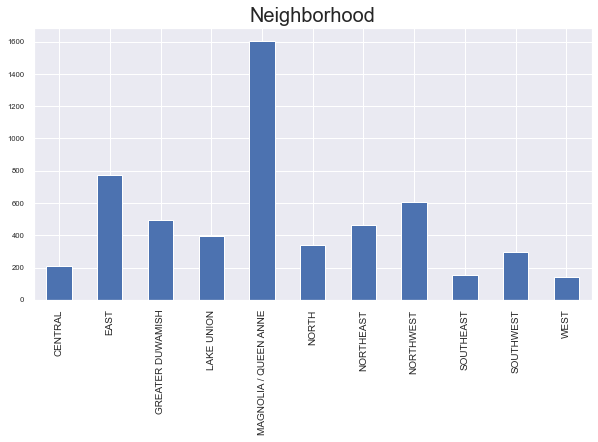

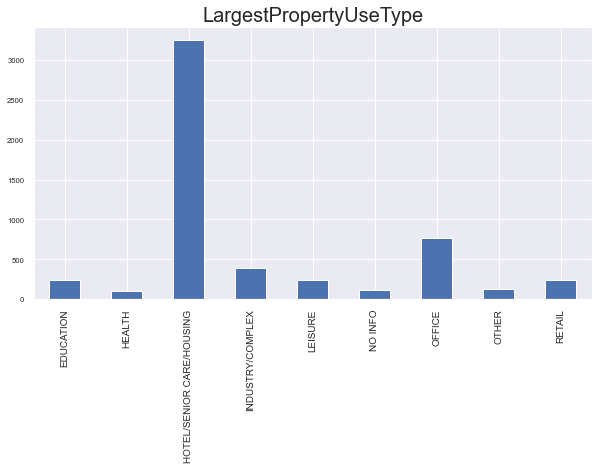

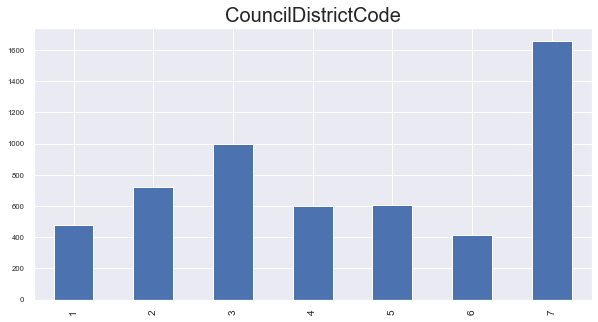

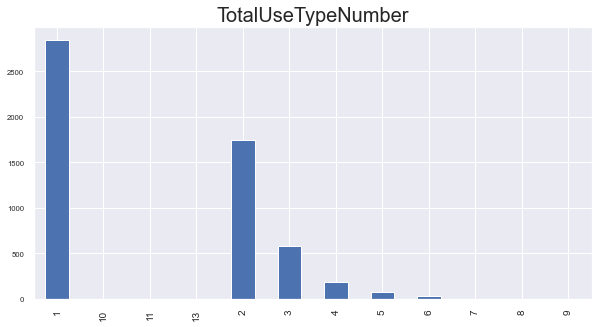

In [135]:
variable_categ = ['Neighborhood','LargestPropertyUseType', 'CouncilDistrictCode','TotalUseTypeNumber']

for column in variable_categ:
    
    fig = plt.figure(figsize=(10,5))
    df_analyse[column].value_counts().sort_index(axis=0).plot(kind='bar')
    plt.xticks(rotation = 90, fontsize = 10)
    plt.title(column,fontsize = 20)
    plt.show()
    

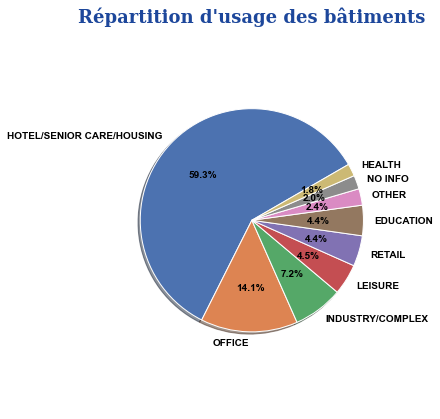

In [136]:
# Créer un Donut Chart pour la proportion des batiments dans le jeu de donnée concatenée 

building_usage = df_analyse['LargestPropertyUseType'].value_counts()

fig, ax = plt.subplots(figsize=(6,6))
ax.pie(building_usage.values, labels=building_usage.index, 
       autopct='%1.1f%%', shadow=True, startangle=30,
       textprops=dict(color="black",size=10, weight="bold"))
ax.axis('equal')
ax.set_title("Répartition d'usage des bâtiments", fontdict = font_title)
plt.tight_layout()
plt.savefig('répartition_usage bâtiment.png',orientation='portrait', bbox_inches='tight')  
plt.show()

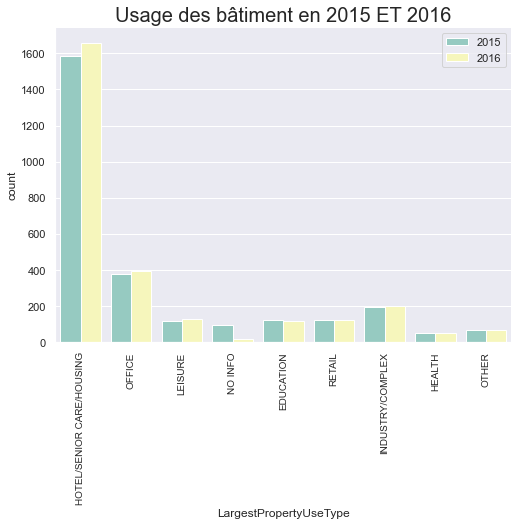

In [137]:
# Nombre de l'usage des batiment pour 2015 et 2016

sns.set(font_scale = 1)
sns.catplot(x="LargestPropertyUseType", 
            kind="count",
            data=df_analyse,
            hue = 'DataYear', 
            palette="Set3", 
           legend_out = False,
                 height=5, aspect=1.5)
plt.legend(loc='upper right')
plt.title ("Usage des bâtiment en 2015 ET 2016", fontsize= 20)
plt.xticks(rotation = 90, fontsize = 10)
plt.savefig('building_usage.png',orientation='portrait', bbox_inches='tight')  
plt.show()

## Bilan sur l'analyse exploiratoire de type des bâtiments :




- Les types de batiments sous deux ans 2015 -2016 sont  presqu'également représentés.
- Mais le type des bâtiments ne sont pas représenté également.
- Certains quartiers sont très peu représentés.



#### L’années de construction des bâtiments

In [138]:
#L'Age des bâtiment
df_analyse['BuildingAge'] = df_analyse['DataYear'] - df_analyse['YearBuilt']

print(df_analyse['YearBuilt'].min())
print(df_analyse['YearBuilt'].max())

1900
2015


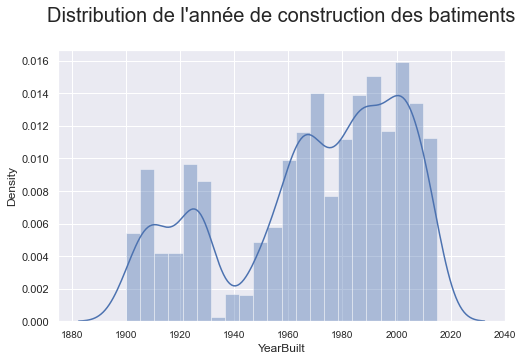

In [139]:
fig = plt.figure(figsize=(8,5))
ax = sns.distplot(df_analyse['YearBuilt'])
plt.xticks(fontsize= 10)
plt.title("Distribution de l'année de construction des batiments\n", fontsize = 20)
plt.savefig('annee construction.png', bbox_inches='tight')  
plt.show()

##### La Distribution de l'age des batiments 

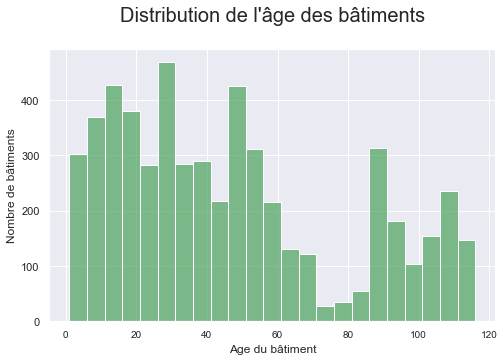

<Figure size 432x288 with 0 Axes>

In [140]:
# La répartition de l'age des batiments 

fig = plt.figure(figsize=(8,5))
ax = sns.histplot(data=df_analyse, x='BuildingAge', bins=int((df_analyse["BuildingAge"].max() - df_analyse["BuildingAge"].min())/5),
                  color = 'g')
ax.set_xlabel("Age du bâtiment")
ax.set_ylabel("Nombre de bâtiments")
plt.xticks(fontsize= 10)
plt.title("Distribution de l'âge des bâtiments\n", fontsize = 20)
plt.savefig('Age batiment.png', bbox_inches='tight')  
plt.show()
plt.tight_layout()

# Bilan de l'analyse des l'age des bâtiment

- Il y a très peu de construction bâtie aux années 40 ce qui est expliqué par la crise de la 2nde guerre mondiale.
- on a peu de construction récentes 
- On a les donnée sur les bâtiment depuis 1900.

###  Des variables numériques 

In [141]:
df_analyse.select_dtypes(['int64', 'float64']).columns

Index(['OSEBuildingID', 'DataYear', 'CouncilDistrictCode', 'latitude',
       'longitude', 'YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)',
       'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kBtu)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'BuildingAge'],
      dtype='object')

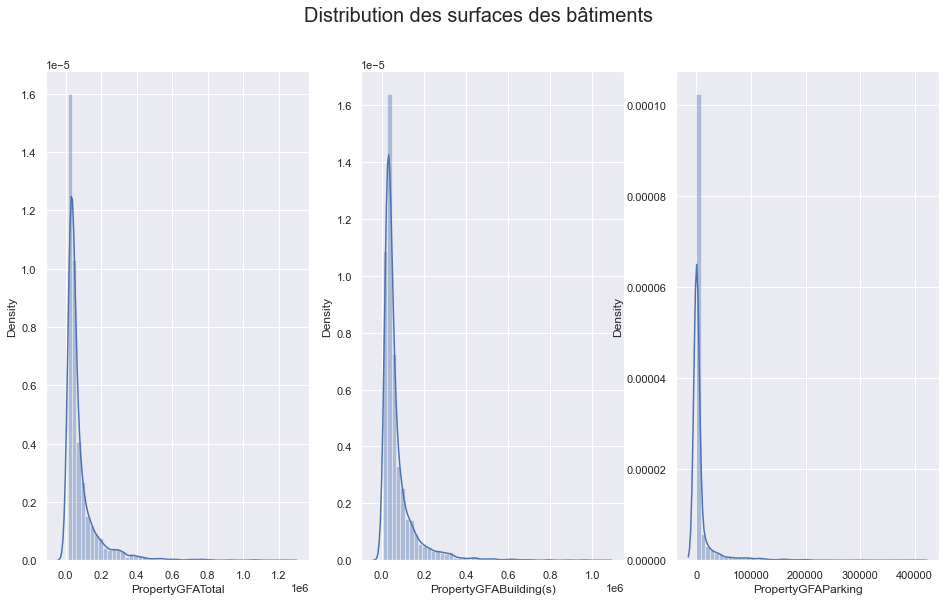

In [142]:
fig, axes = plt.subplots(1, 3,
                            figsize=(16, 9))
sns.set(font_scale = 0.7)


f1 =sns.distplot(df_analyse['PropertyGFATotal'], ax= axes[0]) 


f2=sns.distplot(df_analyse['PropertyGFABuilding(s)'], ax= axes[1])


f3=sns.distplot(df_analyse['PropertyGFAParking'], ax= axes[2])

plt.suptitle("Distribution des surfaces des bâtiments", 
              fontsize=20)

plt.show()

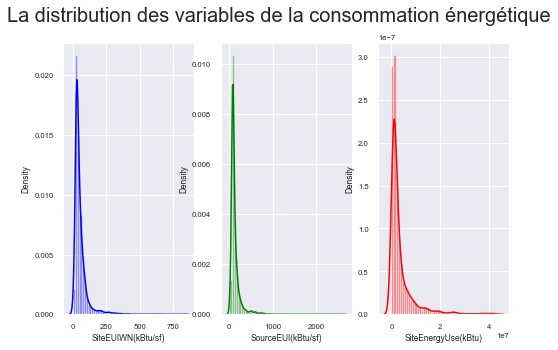

In [143]:

fig, axes = plt.subplots(1, 3, figsize=(8, 5))
sns.set(font_scale = 0.8)
fig.suptitle("La distribution des variables de la consommation énergétique", fontsize = 20)

f1 = sns.distplot(df_analyse['SiteEUIWN(kBtu/sf)'], color="blue", ax=axes[0], kde=True)

f2= sns.distplot(df_analyse['SourceEUI(kBtu/sf)'], color="green", ax=axes[1], kde=True)

f3 = sns.distplot(df_analyse['SiteEnergyUse(kBtu)'], color="red", ax=axes[2], kde=True)

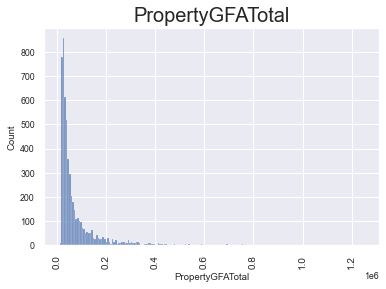

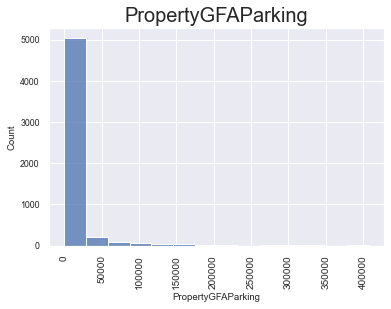

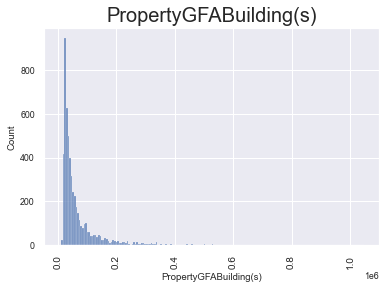

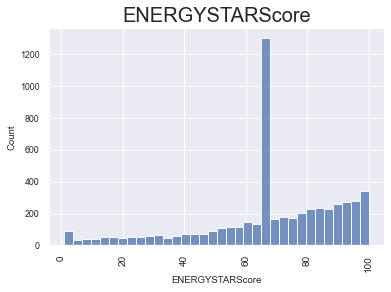

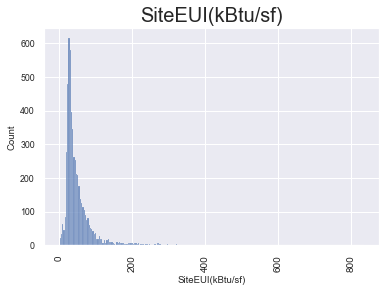

...

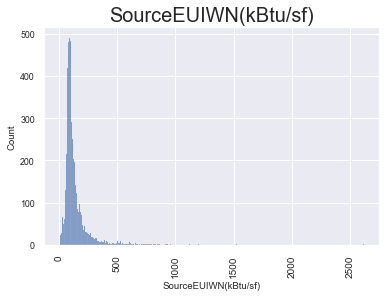

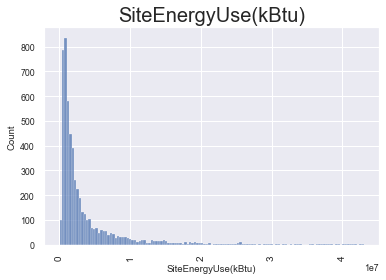

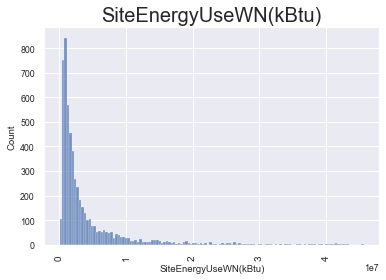

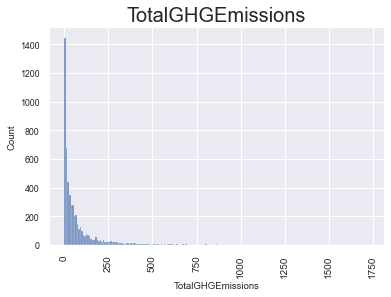

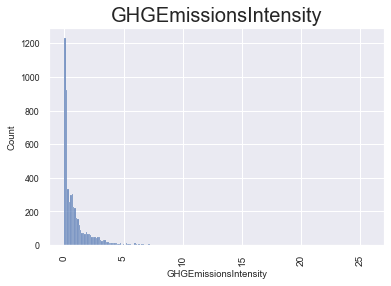

<Figure size 432x288 with 0 Axes>

In [144]:
numerique_var = ['PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
        'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)','TotalGHGEmissions',
       'GHGEmissionsIntensity']

for column in numerique_var :
    
    #fig = plt.figure(figsize=(10,5))
    sns.histplot(data = df_analyse, x= column)
    plt.xticks(rotation = 90, fontsize = 10)
    plt.title(column,fontsize = 20)
    plt.show()
    
plt.savefig('distribution.png',orientation='portrait', bbox_inches='tight')  

#### Comparer la distruburion de consommation d'energy & emission de GHG entre 2015 et 2016

In [145]:
df_two_years_final =df_analyse.groupby("OSEBuildingID").filter(lambda x: len(x) > 1).sort_values(by='OSEBuildingID')
df_one_year_final= df_analyse.groupby("OSEBuildingID").filter(lambda x: len(x) == 1).sort_values(by='OSEBuildingID')

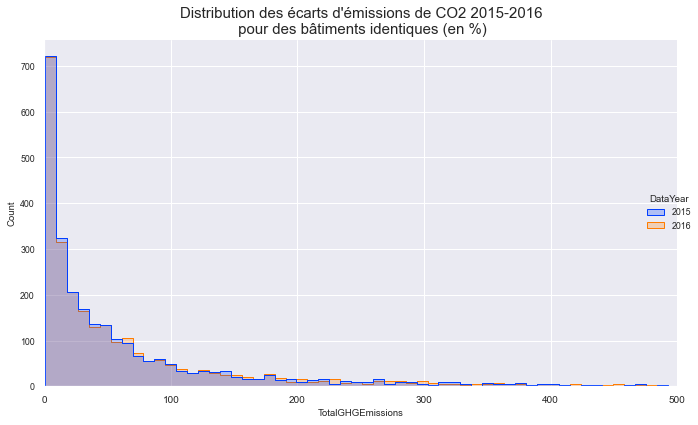

In [146]:
sns.displot(df_two_years_final, x='TotalGHGEmissions', hue='DataYear',  
            element="step", palette='bright', height=6, aspect=1.5)

plt.xlim(0,1000)

ax= plt.title(f"Distribution des écarts d'émissions de CO2 2015-2016\n pour des bâtiments identiques (en %)",
         fontsize = 15)
plt.xticks(fontsize = 10)
plt.xlim(left=0,right=500)
plt.tight_layout()

In [147]:
df_two_years_final[["TotalGHGEmissions", "SiteEnergyUse(kBtu)"]].describe()

,TotalGHGEmissions,SiteEnergyUse(kBtu)
count,5286.000000,5.286000e+03
mean,77.637079,3.680863e+06
std,135.905347,5.375959e+06
min,0.660000,7.971180e+04
25%,8.335000,9.063045e+05
50%,30.040000,1.722685e+06
75%,83.635000,3.841111e+06
max,1597.560000,4.258403e+07


## 4.3. Analyse de multicolinéarité :Vérification de multicolinéarité avec le VIF (Variance Inflation Factor)

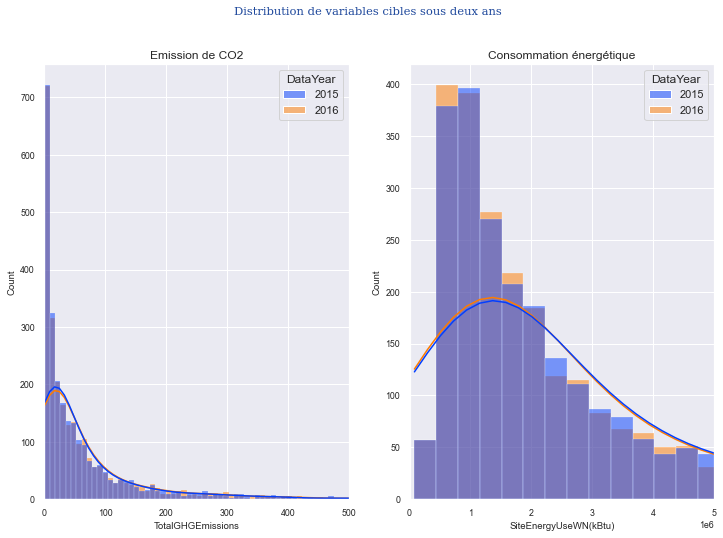

In [148]:
#plt.figure(figsize=(8,5))
f, axs = plt.subplots(1, 2, figsize=(12, 8))
f.suptitle("Distribution de variables cibles sous deux ans", fontdict = font_title)
sns.set(font_scale= 1)
ax1 =sns.histplot(data=df_two_years_final, x="TotalGHGEmissions", hue="DataYear", kde=True, palette='bright', ax=axs[0])        
ax1.set_title("Emission de CO2")
#f1.set_ylim(auto= True)
ax1.set_xlim(left=0,right=500)
ax1.set_xlim(auto= True)

ax2=sns.histplot(data=df_two_years_final, x="SiteEnergyUseWN(kBtu)", hue="DataYear", kde=True,
             palette='bright', ax=axs[1])
ax2.set_title("Consommation énergétique")
#f2.set_ylim(auto= True)
ax2.set_xlim(left=0,right=5000000)
plt.savefig("distribution de energy_ghg_deux ans", bbox_inches='tight')

#f.tight_layout()

-  **Pour la suite de l'analyse, on va créer  des variables booléannes pour l'utilisation du 'Gaz' , 'Electricity' et 'Steam'**

In [149]:
df_analyse['Electricity_usage'] = ["Yes" if s >0 else "No" for s in df_analyse['Electricity(kBtu)']]
df_analyse["Gas_usage"] =["Yes" if s >0 else "No" for s in df_analyse['NaturalGas(kBtu)']]
df_analyse["Steam_usage"] =["Yes" if s >0 else "No" for s in df_analyse['SteamUse(kBtu)']]

df_analyse.drop(['SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)'], axis= 1, inplace = True)

In [150]:
df_analyse['Electricity_usage'].unique()

array(['Yes', 'No'], dtype=object)

In [151]:
df_analyse.columns

Index(['OSEBuildingID', 'DataYear', 'address', 'ZipCode',
       'CouncilDistrictCode', 'Neighborhood', 'latitude', 'longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)',
       'TotalGHGEmissions', 'GHGEmissionsIntensity', 'TotalUseTypeNumber',
       'BuildingAge', 'Electricity_usage', 'Gas_usage', 'Steam_usage'],
      dtype='object')

In [152]:
var_to_analyse = ['NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)',
       'SourceEUIWN(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)',
       'TotalGHGEmissions', 'GHGEmissionsIntensity', 'TotalUseTypeNumber',
       'BuildingAge', 'Electricity_usage', 'Gas_usage', 'Steam_usage']

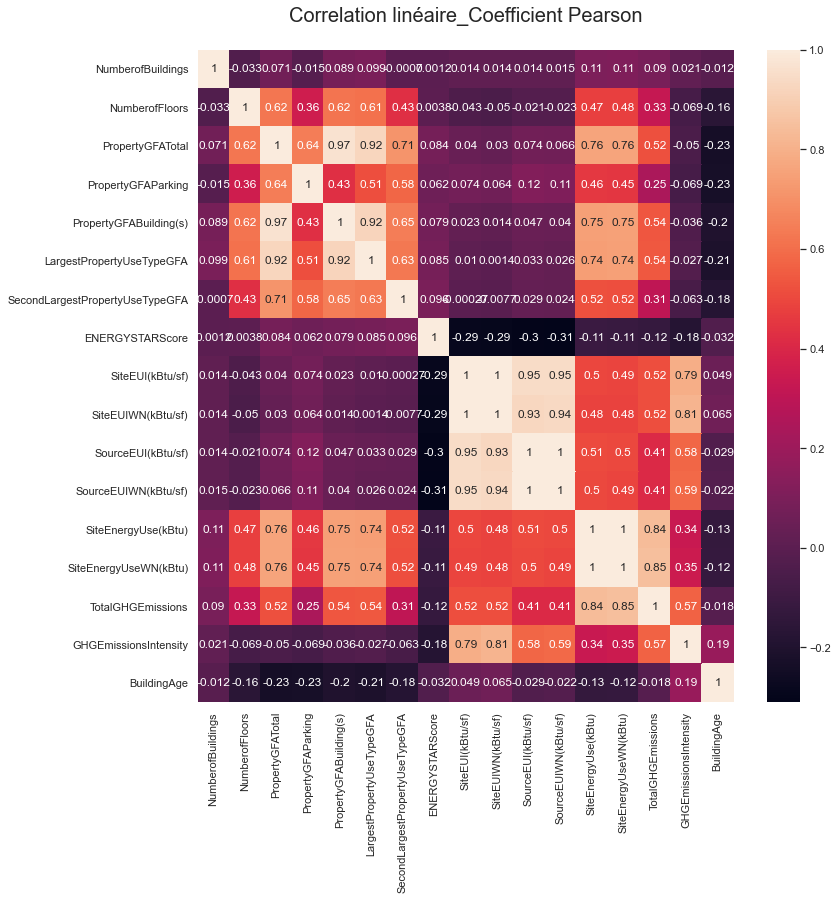

In [153]:
plt.subplots(figsize=(12, 12))
sns.set(font_scale=1)

sns.heatmap(df_analyse[var_to_analyse].corr(), 
                        annot = True, xticklabels=True, yticklabels=True) 

plt.title("Correlation linéaire_Coefficient Pearson\n", size = 20)
plt.savefig("corrélation", bbox_inches='tight')
plt.show()

In [154]:
correlation = df_analyse[var_to_analyse].corr()


threshold1 = 0.7
corr_pairs= correlation .unstack().sort_values(kind="quicksort")
fort_corr1 = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > threshold1)])
               .reset_index().rename(columns={0:'corr_coeff'}))
fort_corr1 = fort_corr1[(fort_corr1.index%2 == 0) & (fort_corr1['level_0'] != fort_corr1['level_1'])]
fort_corr1.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
40,SourceEUIWN(kBtu/sf),SourceEUI(kBtu/sf),0.998961
38,SiteEnergyUseWN(kBtu),SiteEnergyUse(kBtu),0.998775
36,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),0.997618
34,PropertyGFATotal,PropertyGFABuilding(s),0.967570
32,SourceEUIWN(kBtu/sf),SiteEUI(kBtu/sf),0.948757
30,SiteEUI(kBtu/sf),SourceEUI(kBtu/sf),0.945835
28,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),0.937211
26,SourceEUI(kBtu/sf),SiteEUIWN(kBtu/sf),0.931764
24,LargestPropertyUseTypeGFA,PropertyGFATotal,0.924278
22,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.920914


- On constate de très forte correlation plus de 95% entre les variables normalisées et non normalisées. Il s'agit donc des variables redonnates.



### Vérification de multicolinéarité avec le VIF (Variance Inflation Factor) : 

##### Rappel : 
- La multicolinéarité se produit lorsque deux ou plusieurs variables indépendantes sont fortement corrélées entre elles dans un modèle de régression.

- VIF (Variance Inflation Factor) signifie Facteur d'Inflation de la Variance. Au cours de l'analyse de régression, VIF évalue si les varaibles sont corrélés les uns aux autres (multi-colinéarité), ce qui pourrait influencer les autres variable et réduire la fiabilité du modèle.Si un VIF est supérieur à 10, vous avez une multi-colinéarité élevée : la variation semblera plus grande et le variable apparaîtra plus influent qu'il ne l'est. Si VIF est plus proche de 1, alors le modèle est beaucoup plus robuste, car les facteurs ne sont pas influencés par la corrélation avec d'autres facteurs.

In [155]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


strong_corr_model = list(set(list(fort_corr1['level_0'].values) + list(fort_corr1['level_1'].values)))
x_test1 = df_analyse[strong_corr_model].replace([np.inf, -np.inf], np.nan)
x_test1 = x_test1.dropna()

vif_data1 = pd.DataFrame()
vif_data1["feature"] =x_test1.columns
vif_data1["VIF"] = [variance_inflation_factor(x_test1.values, i) 
                  for i in range(len(x_test1.columns))]
vif_data1[vif_data1['VIF'] >5]

,feature,VIF
0,SourceEUI(kBtu/sf),3518.013415
1,TotalGHGEmissions,9.759122
3,LargestPropertyUseTypeGFA,13.374639
4,SiteEnergyUse(kBtu),1297.136789
5,PropertyGFABuilding(s),29.964620
6,SiteEnergyUseWN(kBtu),1384.324531
7,PropertyGFATotal,38.993185
8,SourceEUIWN(kBtu/sf),3285.765162
9,SiteEUI(kBtu/sf),2610.125087
10,SiteEUIWN(kBtu/sf),2277.221232


#### La multicolinéarité des variables de la consomation énérgétique et l'émission de GHG

In [156]:
print(search_string(df_analyse, 'EUI'))
print(search_string(df_analyse, 'Energy'))

['SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)']
['SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)']


In [157]:
energy_corr = df_analyse[[
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)', 
 'SiteEnergyUseWN(kBtu)',
 'TotalGHGEmissions', 
 'GHGEmissionsIntensity']].corr()


threshold = 0.7
corr_pairs2= energy_corr.unstack().sort_values(kind="quicksort")
fort_corr2 = (pd.DataFrame(corr_pairs2[(abs(corr_pairs2) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
fort_corr2 = fort_corr2[(fort_corr2.index%2 == 0) & (fort_corr2['level_0'] != fort_corr2['level_1'])]
fort_corr2.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
20,SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),0.998961
18,SiteEnergyUseWN(kBtu),SiteEnergyUse(kBtu),0.998775
16,SiteEUIWN(kBtu/sf),SiteEUI(kBtu/sf),0.997618
14,SourceEUIWN(kBtu/sf),SiteEUI(kBtu/sf),0.948757
12,SourceEUI(kBtu/sf),SiteEUI(kBtu/sf),0.945835
10,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),0.937211
8,SourceEUI(kBtu/sf),SiteEUIWN(kBtu/sf),0.931764
6,SiteEnergyUseWN(kBtu),TotalGHGEmissions,0.847792
4,TotalGHGEmissions,SiteEnergyUse(kBtu),0.838292
2,GHGEmissionsIntensity,SiteEUIWN(kBtu/sf),0.812280


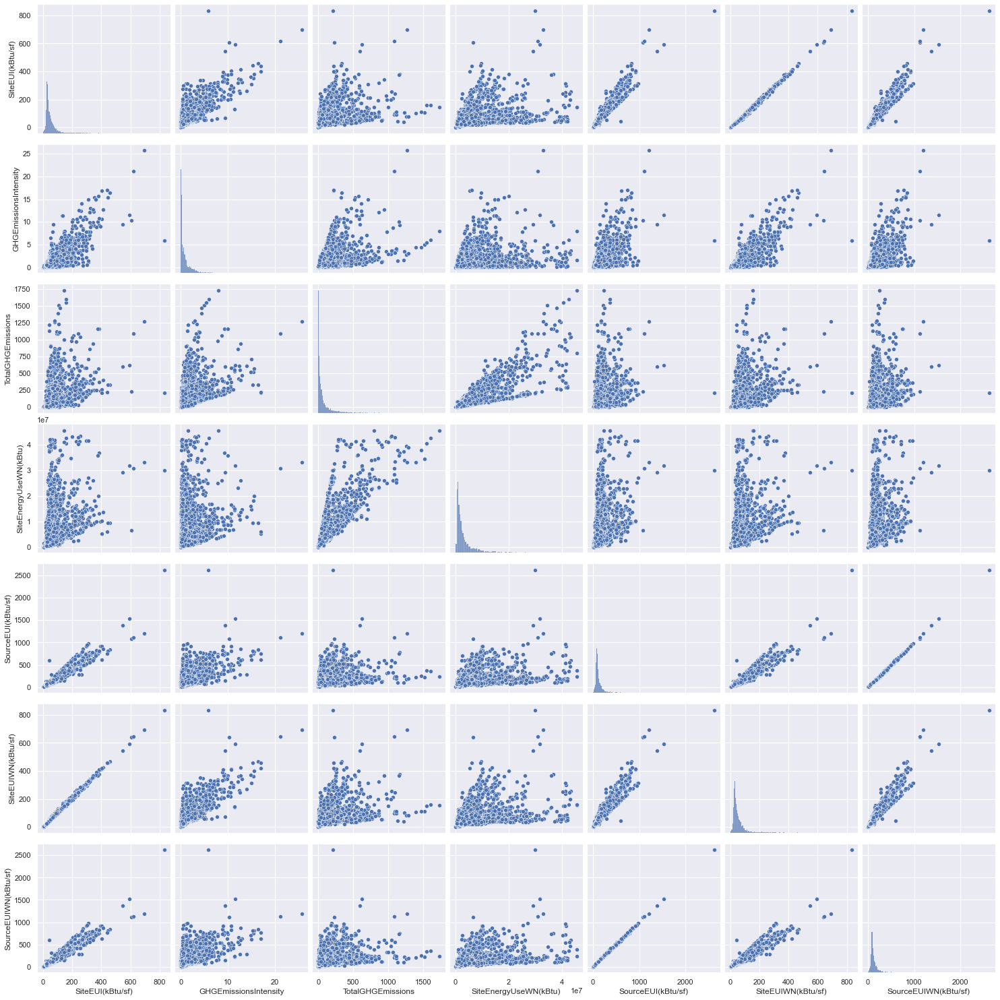

In [158]:

sns.set(font_scale=1)

sns.pairplot(df_analyse[fort_corr2['level_0'].unique().tolist()], height = 3, palette = 'bright')
plt.savefig("corrélation_plot", bbox_inches='tight')

In [159]:
strong_corr_model2 = list(set(list(fort_corr2['level_0'].values) + list(fort_corr2['level_1'].values)))
x_test2 = df_analyse[strong_corr_model2].replace([np.inf, -np.inf], np.nan)
x_test2 = x_test2.dropna()

vif_data2 = pd.DataFrame()
vif_data2["feature"] =x_test2.columns
vif_data2["VIF"] = [variance_inflation_factor(x_test2.values, i) 
                  for i in range(len(x_test2.columns))]
vif_data2[vif_data2['VIF'] >5]

,feature,VIF
0,SourceEUI(kBtu/sf),3231.280342
1,TotalGHGEmissions,8.993205
2,SiteEnergyUse(kBtu),1220.578996
3,SiteEnergyUseWN(kBtu),1278.046301
4,SourceEUIWN(kBtu/sf),2994.643110
5,SiteEUI(kBtu/sf),2550.986429
6,SiteEUIWN(kBtu/sf),2224.120658
7,GHGEmissionsIntensity,17.469481


- Les variables avec suffix "EUI" (Energy Use Intensity) sont des variable sur la consommation énergétique divisé par la surface. 
Nous avons les variable de GFA. Il est donc inutile de garder les variable EUI et "GHGEmissionsIntensity"qui est la variables de l'emission de GHG divisé par la surface.



In [160]:
df_analyse_final = df_analyse.drop(['SiteEUIWN(kBtu/sf)','SourceEUIWN(kBtu/sf)', 
                    'SiteEUI(kBtu/sf)', 'SourceEUI(kBtu/sf)',
                   'GHGEmissionsIntensity', 'SiteEnergyUseWN(kBtu)'], axis= 1)

#### L'Analyse de la multicolinéarité des variables sur la caractéristique des bâtiments

- On costate une très forte corrélation entre les variables sur surface. 


,level_0,level_1,corr_coeff
4,PropertyGFABuilding(s),PropertyGFATotal,0.967570
2,PropertyGFATotal,LargestPropertyUseTypeGFA,0.924278
0,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.920914


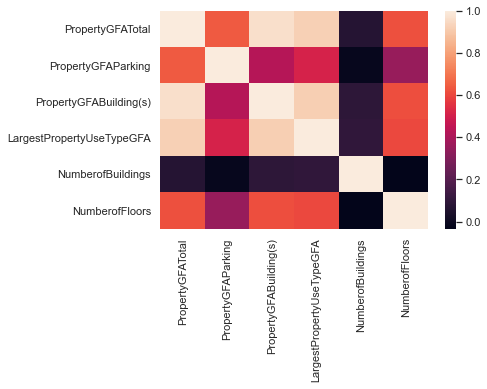

In [161]:
gfa_corr= df_analyse_final[['PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA',
'NumberofBuildings',
 'NumberofFloors',
                ]].corr()


sns.heatmap(gfa_corr)



threshold1= 0.7
corr_gfa = gfa_corr.unstack().sort_values(kind="quicksort")
fort_corr3 = (pd.DataFrame(corr_gfa[((corr_gfa) > threshold)])
               .reset_index().rename(columns={0:'corr_coeff'}))
fort_corr3 = fort_corr3[(fort_corr3.index%2 == 0) & (fort_corr3['level_0'] != fort_corr3['level_1'])]
fort_corr3.sort_values('corr_coeff', ascending=False)


- Cela signifie qu'une variable indépendante peut être prédite à partir d'une autre variable indépendante dans un modèle de régression. 
- Ici on voit une forte corrélation entre les varaibles avec suffix GFA (variable de suface) 

In [162]:

strong_corr_model3 = list(set(list(fort_corr3['level_0'].values) + list(fort_corr3['level_1'].values)))
x_test3 = df_analyse_final[strong_corr_model3].replace([np.inf, -np.inf], np.nan)
x_test3 = x_test3.dropna()

vif_data3 = pd.DataFrame()
vif_data3["feature"] =x_test3.columns
vif_data3["VIF"] = [variance_inflation_factor(x_test3.values, i) 
                  for i in range(len(x_test3.columns))]
vif_data3[vif_data3['VIF'] >5]

,feature,VIF
0,LargestPropertyUseTypeGFA,12.254808
1,PropertyGFABuilding(s),28.010085
2,PropertyGFATotal,28.508959


#### Feature engineering

- On va créer de nouvelles variables en calculant Building surface/total 

In [163]:
df_analyse_final["Building/Total_GFA"] = df_analyse_final["PropertyGFABuilding(s)"]/ df_analyse["PropertyGFATotal"]

In [164]:
df_final = df_analyse_final.drop(['PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA'
                
                        ], axis= 1)

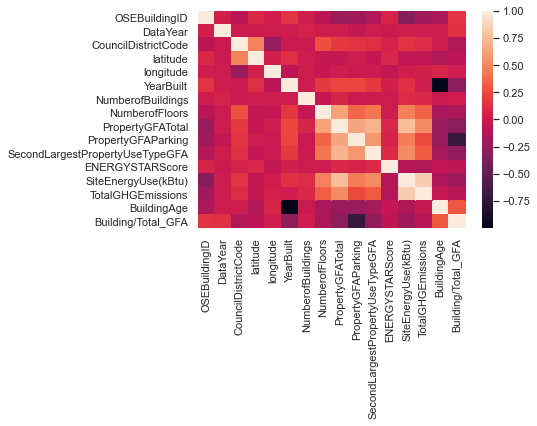

In [165]:
sns.heatmap(df_final.corr())
plt.savefig("corrélation2", bbox_inches='tight')

## 1.2 - Analyse bi-variée

## Analyse exploiratoire des variable à prédire 

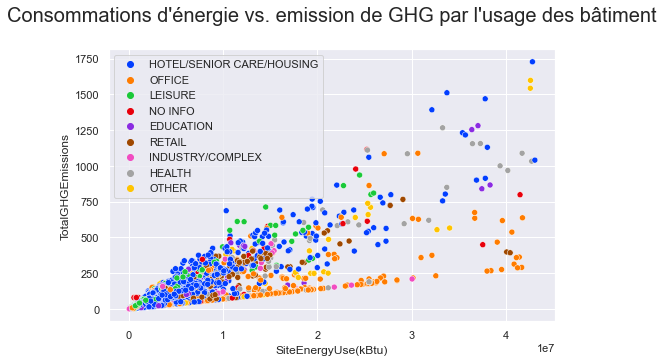

In [167]:
fig = plt.figure(figsize=(8,5))
sns.scatterplot(data = df_final, x='SiteEnergyUse(kBtu)', y='TotalGHGEmissions',
                hue='LargestPropertyUseType', 
               legend= "full", palette = 'bright')
plt.legend(loc='upper left')
plt.title(f"Consommations d'énergie vs. emission de GHG par l'usage des bâtiment\n", 
          fontsize = 20)

plt.savefig("energy_ghg", bbox_inches='tight')
plt.show()

- Nous allons à présent regarder la répartition de ces 2 variables en fonction du type de bâtiement.



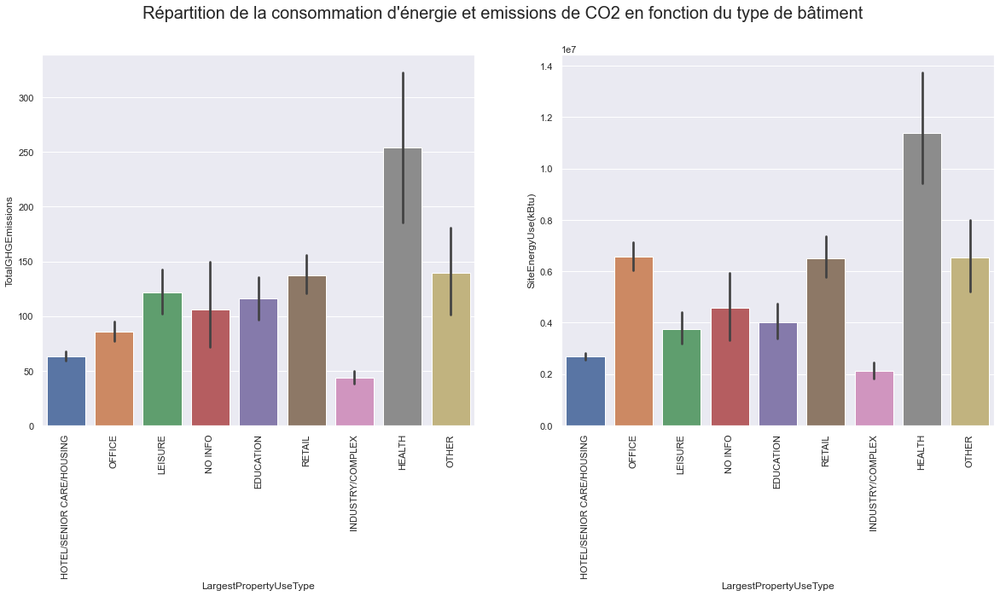

In [168]:
# la consommation d'energie et l'emission de CO2 par type du bâtiment

fig, axes = plt.subplots(nrows=1, ncols=2, sharey=False, figsize=(20,8))

gaz_fig =sns.barplot(x='LargestPropertyUseType',y='TotalGHGEmissions',data=df_final, ax=axes[0])
gaz_fig.set_xticklabels(gaz_fig.get_xticklabels(), rotation=90)

energy_fig=sns.barplot(x='LargestPropertyUseType',y='SiteEnergyUse(kBtu)',data=df_final, ax=axes[1])
energy_fig.set_xticklabels(energy_fig.get_xticklabels(), rotation=90)

plt.suptitle("Répartition de la consommation d'énergie et emissions de CO2 en fonction du type de bâtiment", 
              fontsize= 20)

plt.savefig('repartition',bbox_inches='tight')

plt.show()

- On constate que les établissements avec type d'usage "Health" et les "Office" consomme plus que les autre de l"énergie. 
- plus de de gaz à effet serre est émis par les établissement du type d'usgae 'Health" et "Retail".

###  4.4 Analyse des variables à prédire

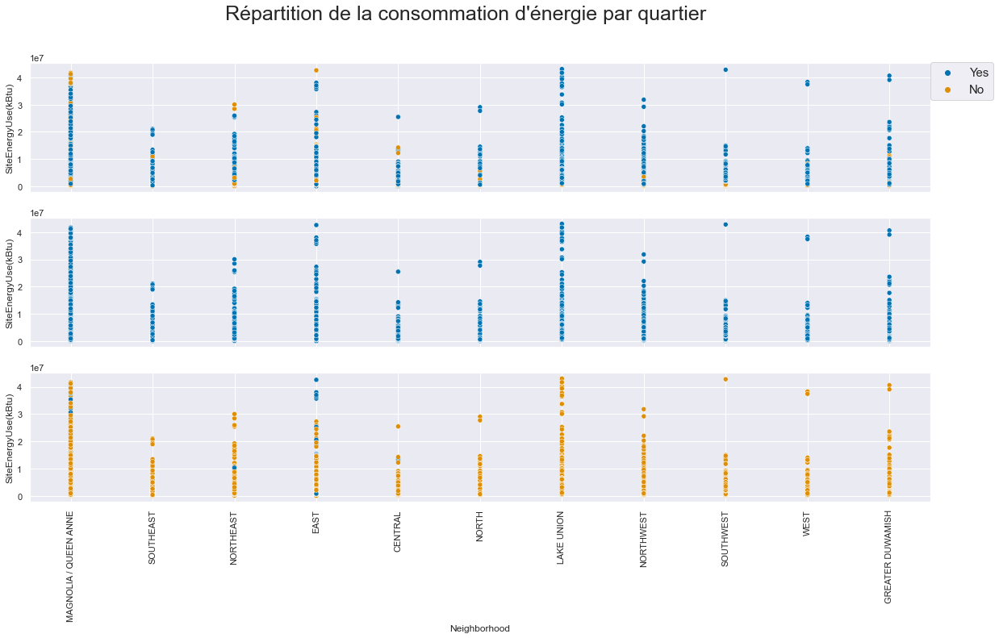

In [169]:
fig, axes = plt.subplots(3, 1, sharex=True,
                            figsize=(20, 10))
sns.set(font_scale = 1.1)
plt.xticks(rotation =90)

f1 =sns.scatterplot(x="Neighborhood", y="SiteEnergyUse(kBtu)", 
           hue = 'Gas_usage',
       data=df_final, ax= axes[0],palette='colorblind')
f1.legend(bbox_to_anchor=(1, 1.01),
           borderaxespad=0, fontsize=15)

f2=sns.scatterplot(x="Neighborhood", y="SiteEnergyUse(kBtu)", 
           hue = 'Electricity_usage',
            data=df_final, ax= axes[1], palette='colorblind')
f2.legend([],[], frameon=False)


f3=sns.scatterplot(x="Neighborhood", y="SiteEnergyUse(kBtu)", 
           hue = 'Steam_usage',
            data=df_final, ax= axes[2], palette='colorblind')
f3.legend([],[], frameon=False)

plt.suptitle("Répartition de la consommation d'énergie par quartier", 
              fontsize=25)

plt.show()

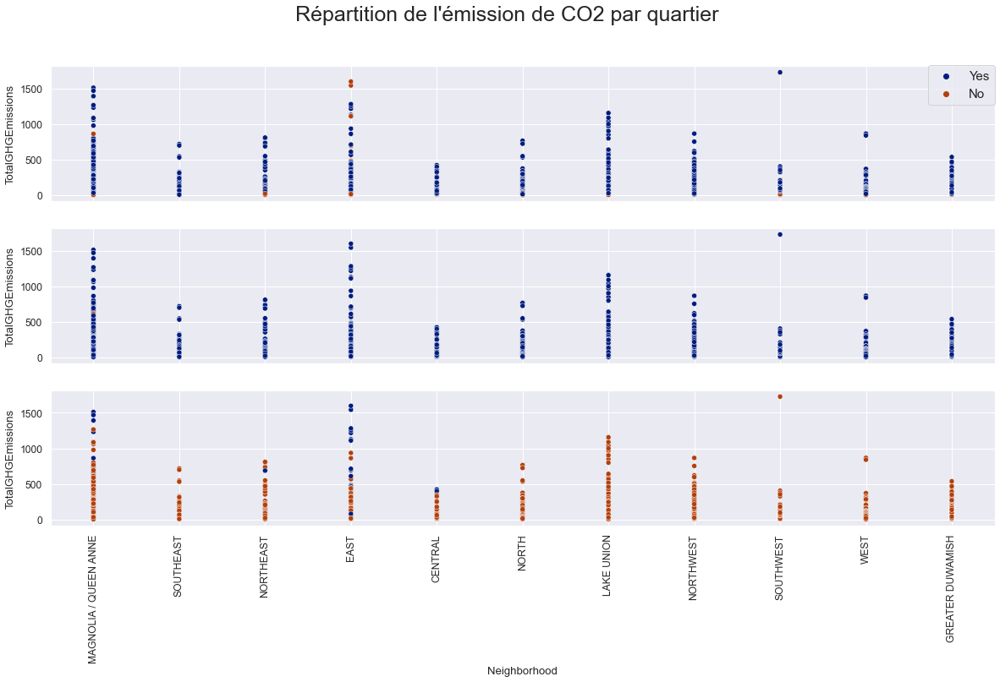

In [170]:
fig, axes = plt.subplots(3, 1, sharex=True,
                            figsize=(20, 10))
sns.set(font_scale = 1.1)
plt.xticks(rotation =90)
f1 =sns.scatterplot(x="Neighborhood", y="TotalGHGEmissions", 
           hue = 'Gas_usage',
       data=df_final, ax= axes[0], palette = 'dark')
f1.legend(bbox_to_anchor=(1, 1.01),
           borderaxespad=0, fontsize=15)

f2=sns.scatterplot(x="Neighborhood", y="TotalGHGEmissions", 
           hue = 'Electricity_usage',
            data=df_final, ax= axes[1], palette='dark')
f2.legend([],[], frameon=False)


f3=sns.scatterplot(x="Neighborhood", y="TotalGHGEmissions", 
           hue = 'Steam_usage',
            data=df_final, ax= axes[2], palette='dark')
f3.legend([],[], frameon=False)



plt.suptitle("Répartition de l'émission de CO2 par quartier", 
              fontsize=25)
plt.show()

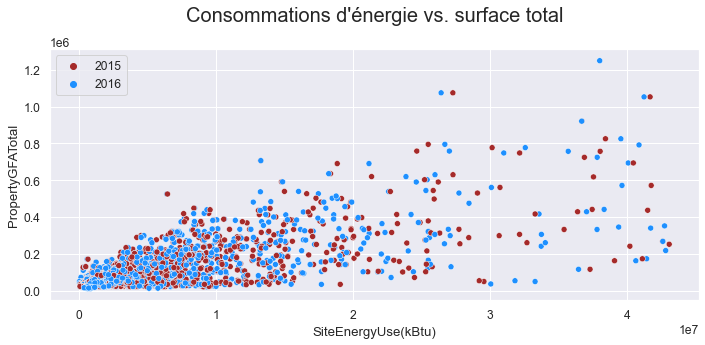

In [171]:
fig = plt.figure(figsize=(10,5))
sns.scatterplot(data = df_final, y='PropertyGFATotal', x='SiteEnergyUse(kBtu)', 
                hue="DataYear", palette=['brown','dodgerblue'])
plt.legend(loc='upper left')
plt.title(f"Consommations d'énergie vs. surface total\n", 
           fontsize=20)
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Emission de GHG vs. surface total\n')

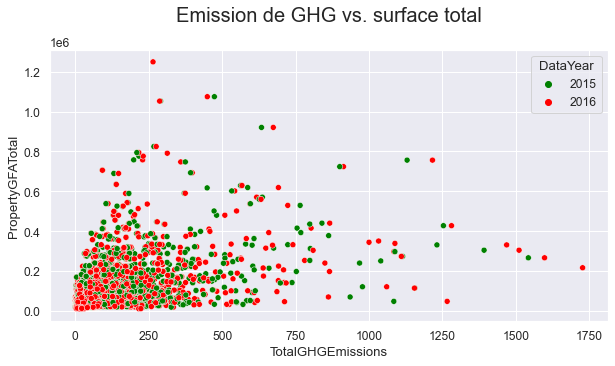

In [172]:
plt.figure(figsize=(10,5))
sns.scatterplot(data= df_final, y="PropertyGFATotal", x="TotalGHGEmissions", 
                hue="DataYear",
                palette=['green','red'])
plt.title(f"Emission de GHG vs. surface total\n", fontsize=20)

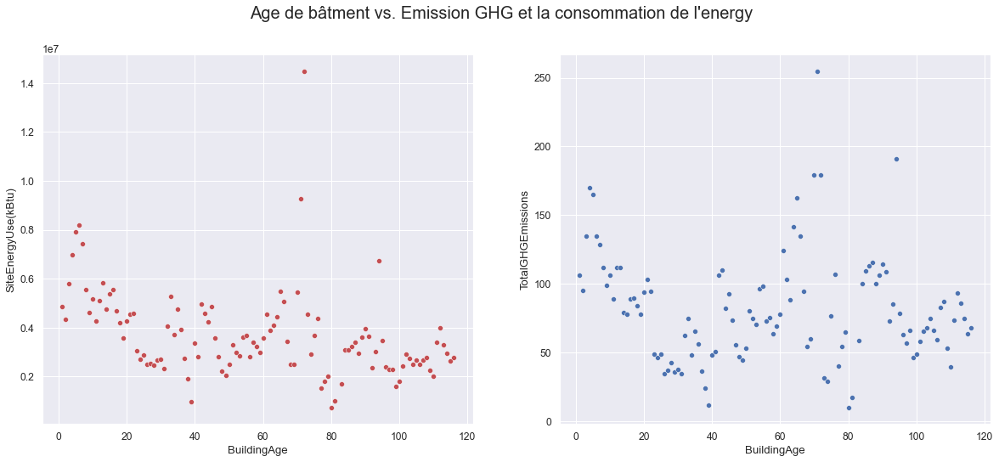

In [173]:
age_energy = pd.DataFrame(df_final.groupby('BuildingAge')['SiteEnergyUse(kBtu)'].mean()).reset_index()
ghg_age = pd.DataFrame(df_final.groupby('BuildingAge')['TotalGHGEmissions'].mean()).reset_index()


fig, axes = plt.subplots(nrows=1, ncols=2, sharey=False, figsize=(20,8))

energy_age =sns.scatterplot(x="BuildingAge", y="SiteEnergyUse(kBtu)", color= 'r', data=age_energy, ax=axes[0])
#energy_age.get_xticklabels(), rotation=90

gaz_age=sns.scatterplot(x="BuildingAge", y="TotalGHGEmissions", color = 'b', data=ghg_age, ax=axes[1])
#gaz_age.get_xticklabels(), rotation=90

plt.suptitle("Age de bâtment vs. Emission GHG et la consommation de l'energy\n", 
              fontsize=20)

plt.show()

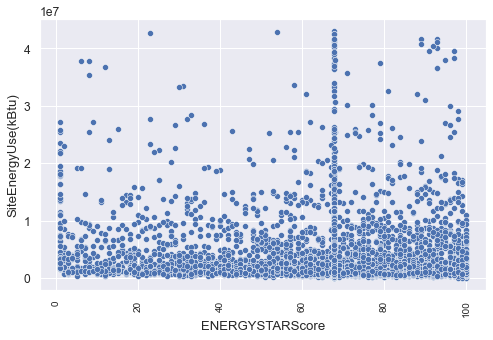

In [174]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x="ENERGYSTARScore", y="SiteEnergyUse(kBtu)", 
  
           estimator=None, data=df_analyse)
plt.xticks(rotation= 90, fontsize = 10)
plt.show()

<Figure size 576x360 with 0 Axes>

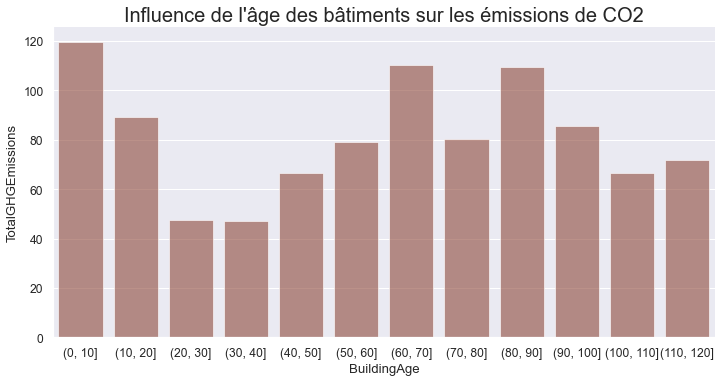

In [175]:
bins = pd.IntervalIndex.from_tuples([(0, 10), (10, 20), (20, 30), (30, 40), (40, 50), 
                                     (50, 60), (60, 70), (70,80), (80,90), (90,100), 
                                     (100,110), (110,120)])
plt.figure(figsize=(8, 5))
sns.catplot(
    data=df_analyse, kind="bar",
    x=pd.cut(df_analyse['BuildingAge'], bins=bins), y="TotalGHGEmissions",
    ci=None, color="#9C3E2D", alpha=.6,
    height=5, aspect=2
)
plt.title("Influence de l'âge des bâtiments sur les émissions de CO2", fontsize = 20)
plt.savefig("age_ghg", bbox_inches='tight')
plt.show()

# 5-Modélisation sans « EnergyStarScore »

In [176]:
# Sélectionner des variables pour la modélisation

model_variable = [
        'Neighborhood', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'LargestPropertyUseType',
       'SiteEnergyUse(kBtu)', 'TotalGHGEmissions',
       'BuildingAge', 'Electricity_usage', 'Gas_usage', 'Steam_usage',
       'Building/Total_GFA']

df_model = df_final[model_variable]

In [177]:
print(df_model.shape)
display(df_model.head())


(5480, 13)


,Neighborhood,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,LargestPropertyUseType,SiteEnergyUse(kBtu),TotalGHGEmissions,BuildingAge,Electricity_usage,Gas_usage,Steam_usage,Building/Total_GFA
0,MAGNOLIA / QUEEN ANNE,1.0,12.0,88434,0,HOTEL/SENIOR CARE/HOUSING,6981428.0,249.43,88,Yes,Yes,Yes,1.000000
1,MAGNOLIA / QUEEN ANNE,1.0,12.0,88434,0,HOTEL/SENIOR CARE/HOUSING,7226362.5,249.98,89,Yes,Yes,Yes,1.000000
2,MAGNOLIA / QUEEN ANNE,1.0,11.0,103566,15064,HOTEL/SENIOR CARE/HOUSING,8387933.0,295.86,20,Yes,Yes,No,0.854547
3,MAGNOLIA / QUEEN ANNE,1.0,11.0,103566,15064,HOTEL/SENIOR CARE/HOUSING,8354235.0,263.51,19,Yes,Yes,No,0.854547
8,MAGNOLIA / QUEEN ANNE,1.0,18.0,175580,62000,HOTEL/SENIOR CARE/HOUSING,14172606.0,505.01,36,Yes,Yes,No,0.646885


In [178]:
#data preprocessing libraries
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import TransformedTargetRegressor

from sklearn.model_selection import train_test_split

# Libraire pour hyperparamètre et Feature selection
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score, KFold

# Modelisation libraries
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNet, ElasticNetCV
import lightgbm as lgb
import xgboost as xgb


# Hyperparamètres tuning 
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import *

import random

## 5.1 Data Préprocessing

###  One-Hot Encoding données catégorielles

In [179]:
# Transformation des variables catégorielles en varibales ordinales 
df_dummies = pd.get_dummies(df_model, columns = ['LargestPropertyUseType', 'Neighborhood',
                                                'Electricity_usage','Gas_usage', 'Steam_usage'])


In [180]:
df_dummies = df_dummies.drop(['Gas_usage_No', 'Steam_usage_No', 'Electricity_usage_No'], axis = 1)

df_dummies = df_dummies.rename(columns= {
       'Electricity_usage_Yes': 'Electricity_use' ,
       'Gas_usage_Yes': 'Gas_use' ,
        'Steam_usage_Yes': 'Steam_use'})

In [181]:
df_dummies.columns.tolist()

['NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'SiteEnergyUse(kBtu)',
 'TotalGHGEmissions',
 'BuildingAge',
 'Building/Total_GFA',
 'LargestPropertyUseType_EDUCATION',
 'LargestPropertyUseType_HEALTH',
 'LargestPropertyUseType_HOTEL/SENIOR CARE/HOUSING',
 'LargestPropertyUseType_INDUSTRY/COMPLEX',
 'LargestPropertyUseType_LEISURE',
 'LargestPropertyUseType_NO INFO',
 'LargestPropertyUseType_OFFICE',
 'LargestPropertyUseType_OTHER',
 'LargestPropertyUseType_RETAIL',
 'Neighborhood_CENTRAL',
 'Neighborhood_EAST',
 'Neighborhood_GREATER DUWAMISH',
 'Neighborhood_LAKE UNION',
 'Neighborhood_MAGNOLIA / QUEEN ANNE',
 'Neighborhood_NORTH',
 'Neighborhood_NORTHEAST',
 'Neighborhood_NORTHWEST',
 'Neighborhood_SOUTHEAST',
 'Neighborhood_SOUTHWEST',
 'Neighborhood_WEST',
 'Electricity_use',
 'Gas_use',
 'Steam_use']

#### Découper les donnée en variables explicatives (X)  et les variables cible (y_energy)

In [182]:
# Créer dataframe pour les prédicteur 
X_features = df_dummies.drop(['TotalGHGEmissions','SiteEnergyUse(kBtu)' ],
                    axis = 1)

# Créer un dataframe pour le variable cible
y_energy =  df_dummies[['SiteEnergyUse(kBtu)']]
y_gaz = df_dummies[['TotalGHGEmissions']]

<AxesSubplot:xlabel='SiteEnergyUse(kBtu)'>

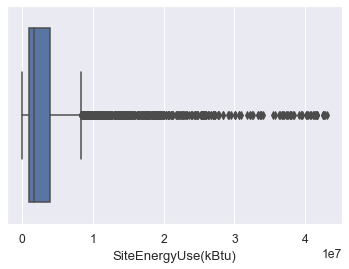

In [183]:
sns.boxplot(df_dummies['SiteEnergyUse(kBtu)'])

In [184]:
x_corr = X_features.corr()


threshold1 = 0.7
corr_x_pair= x_corr.unstack().sort_values(kind="quicksort")
fort_x_corr = (pd.DataFrame(corr_x_pair[(abs(corr_x_pair) > threshold1)])
               .reset_index().rename(columns={0:'corr_coeff'}))
fort_x_corr = fort_x_corr[(fort_x_corr.index%2 == 0) & (fort_x_corr['level_0'] != fort_x_corr['level_1'])]
fort_x_corr.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
0,PropertyGFAParking,Building/Total_GFA,-0.708605


In [185]:

strong_corr_x = list(set(list(fort_x_corr['level_0'].values) + list(fort_x_corr['level_1'].values)))
x_test_corr = X_features[strong_corr_x].replace([np.inf, -np.inf], np.nan)
x_test_corr = x_test_corr.dropna()

vif_x_corr = pd.DataFrame()
vif_x_corr["feature"] =x_test_corr.columns
vif_x_corr["VIF"] = [variance_inflation_factor(x_test_corr.values, i) 
                  for i in range(len(x_test_corr.columns))]
vif_x_corr[vif_x_corr['VIF'] >5]

,feature,VIF


### Data Transformation (Features scaling)

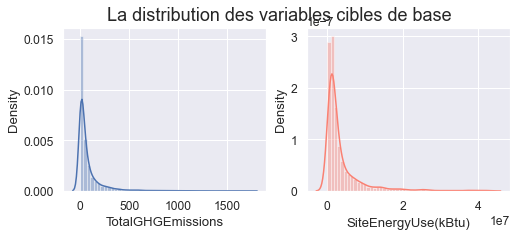

In [186]:
f, axs = plt.subplots(1, 2, figsize=(8, 3))

f.suptitle(f"La distribution des variables cibles de base\n", fontsize = 18)

ax1 =sns.distplot(df_dummies["TotalGHGEmissions"], kde=True,
                color = 'b',ax=axs[0])

ax2= sns.distplot(df_dummies["SiteEnergyUse(kBtu)"], kde=True,
             color = 'salmon',ax=axs[1])

#f.tight_layout()

- On a pu aussi voir plus haut que distribution de cette variables est asymétrique vers le gauche  de (highly positive skew distribution).

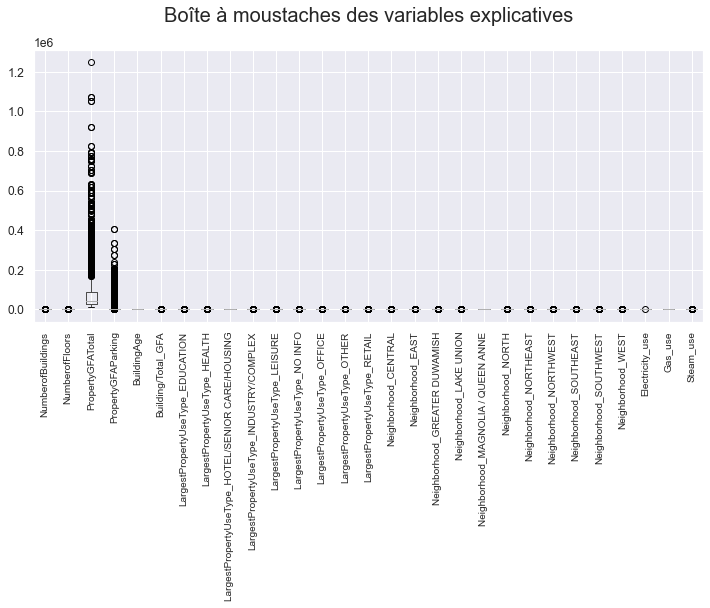

In [187]:
# Rescaling des prédicteurs
plt.figure(figsize = (12,5))
X_features.boxplot()

plt.xticks(rotation = 90, fontsize = 10)
plt.title("Boîte à moustaches des variables explicatives\n", fontsize = 20)
plt.show()

In [188]:
round(X_features.var().T,2)

NumberofBuildings                                   3.900000e-01
NumberofFloors                                      1.837000e+01
PropertyGFATotal                                    1.010998e+10
PropertyGFAParking                                  7.911806e+08
BuildingAge                                         1.067050e+03
Building/Total_GFA                                  2.000000e-02
LargestPropertyUseType_EDUCATION                    4.000000e-02
LargestPropertyUseType_HEALTH                       2.000000e-02
LargestPropertyUseType_HOTEL/SENIOR CARE/HOUSING    2.400000e-01
LargestPropertyUseType_INDUSTRY/COMPLEX             7.000000e-02
LargestPropertyUseType_LEISURE                      4.000000e-02
LargestPropertyUseType_NO INFO                      2.000000e-02
LargestPropertyUseType_OFFICE                       1.200000e-01
LargestPropertyUseType_OTHER                        2.000000e-02
LargestPropertyUseType_RETAIL                       4.000000e-02
Neighborhood_CENTRAL     

- On constate que des ordres de grandeurs des variables explicatives sont différents. D'où la nécessité de les recnetrer.  

#### Recentrage des variables explicatives

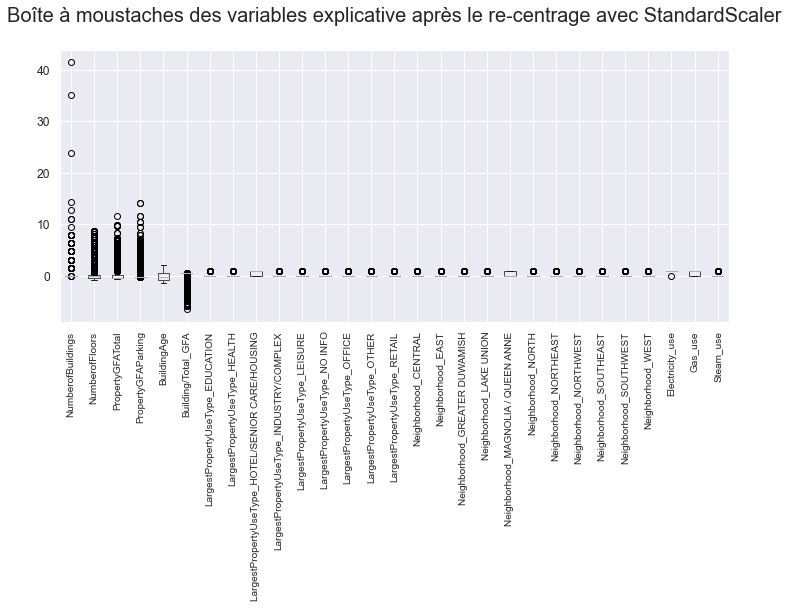

In [189]:
# selectionner les variable à re-scaler 
to_scale = ['NumberofBuildings', 'NumberofFloors', 
            'PropertyGFATotal', 'PropertyGFAParking',
            'BuildingAge', 'Building/Total_GFA' 
           ]                      
scaler = StandardScaler()
X1 = X_features.copy()

X1[to_scale]= scaler.fit_transform(X1[to_scale]) 

plt.figure(figsize = (12,5))
X1.boxplot()

plt.xticks(rotation = 90, fontsize = 10)
plt.title("Boîte à moustaches des variables explicative après le re-centrage avec StandardScaler\n", fontsize = 20)
plt.show()

In [190]:
X1.max()

NumberofBuildings                                   41.450812
NumberofFloors                                       8.737408
PropertyGFATotal                                    11.632504
PropertyGFAParking                                  14.200736
BuildingAge                                          2.136420
Building/Total_GFA                                   0.453546
LargestPropertyUseType_EDUCATION                     1.000000
LargestPropertyUseType_HEALTH                        1.000000
LargestPropertyUseType_HOTEL/SENIOR CARE/HOUSING     1.000000
LargestPropertyUseType_INDUSTRY/COMPLEX              1.000000
LargestPropertyUseType_LEISURE                       1.000000
LargestPropertyUseType_NO INFO                       1.000000
LargestPropertyUseType_OFFICE                        1.000000
LargestPropertyUseType_OTHER                         1.000000
LargestPropertyUseType_RETAIL                        1.000000
Neighborhood_CENTRAL                                 1.000000
Neighbor

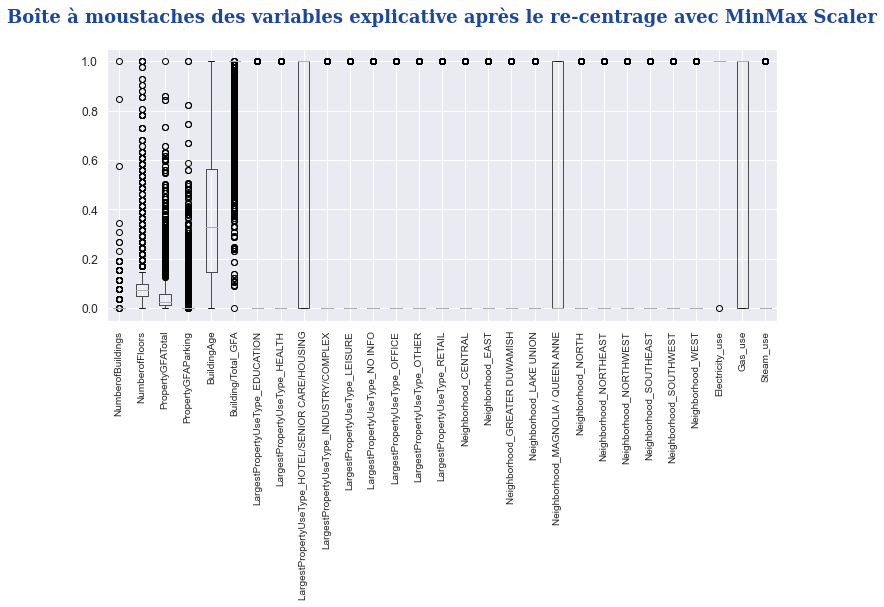

In [191]:
X2 = X_features.copy()

minmax= MinMaxScaler()
X2[to_scale]= minmax.fit_transform(X2[to_scale])

plt.figure(figsize = (12,5))
X2.boxplot()
plt.xticks(rotation = 90, fontsize = 10)
plt.title("Boîte à moustaches des variables explicative après le re-centrage avec MinMax Scaler\n", fontdict =font_title)
plt.savefig('transformation_predictors.png',orientation='portrait', bbox_inches='tight') 
plt.show()

In [192]:
X2.var().T

NumberofBuildings                                   0.000580
NumberofFloors                                      0.010927
PropertyGFATotal                                    0.006599
PropertyGFAParking                                  0.004758
BuildingAge                                         0.080684
Building/Total_GFA                                  0.020520
LargestPropertyUseType_EDUCATION                    0.042052
LargestPropertyUseType_HEALTH                       0.017567
LargestPropertyUseType_HOTEL/SENIOR CARE/HOUSING    0.241484
LargestPropertyUseType_INDUSTRY/COMPLEX             0.067053
LargestPropertyUseType_LEISURE                      0.042717
LargestPropertyUseType_NO INFO                      0.019498
LargestPropertyUseType_OFFICE                       0.120790
LargestPropertyUseType_OTHER                        0.023338
LargestPropertyUseType_RETAIL                       0.042384
Neighborhood_CENTRAL                                0.037196
Neighborhood_EAST       

- **On constate que le transformer le plus pertinent pour les varibles explicatives est MinMaxScaler**

#### Recentrage de la variable cibles 

- Pour le rescaling des variables à prédire, on a essayer plusieurs "transformer" 

In [193]:

#PowerTransfor
pt = PowerTransformer(method='box-cox')
pt2 = PowerTransformer(method='yeo-johnson')

# Robust scaler
rs=RobustScaler(quantile_range=(5.0, 95.0))

#MinMax
mm= MinMaxScaler()

#StandardScaler
ss = StandardScaler()

In [194]:
## Recentrage du variable de la consommation énergétique

y_energy1 = pd.DataFrame(pt.fit_transform(y_energy.values), columns= y_energy.columns)

y_energy2 = pd.DataFrame(pt2.fit_transform(y_energy), columns= y_energy.columns)

y_energy3 = pd.DataFrame(rs.fit_transform(y_energy), columns = y_energy.columns)

y_energy4 = pd.DataFrame(mm.fit_transform(y_energy), columns = y_energy.columns)

y_energy5 = pd.DataFrame(ss.fit_transform(y_energy), columns = y_energy.columns)

#Log transformer 
y_energy_log = np.log(y_energy)
y_energy_log2p = np.log2(1+y_energy)


# Vérifier le "skweness"
print("skewness avec Powertransform(box_cox) :",  y_energy1.skew())
print("skewness avec Powertransform(yeo_johnson) :",  y_energy2.skew())
print("skewness avec RebustScaler :",  y_energy3.skew())
print("skewness avec MinMax Scaler :",  y_energy4.skew())
print("skewness avec StandardScaler :",  y_energy5.skew())
print("skewness avec Logtransform :",  y_energy_log.skew())
print("skewness avec Logtransform :",  y_energy_log2p.skew())


skewness avec Powertransform(box_cox) : SiteEnergyUse(kBtu)    0.004891
dtype: float64
skewness avec Powertransform(yeo_johnson) : SiteEnergyUse(kBtu)    0.004891
dtype: float64
skewness avec RebustScaler : SiteEnergyUse(kBtu)    3.523003
dtype: float64
skewness avec MinMax Scaler : SiteEnergyUse(kBtu)    3.523003
dtype: float64
skewness avec StandardScaler : SiteEnergyUse(kBtu)    3.523003
dtype: float64
skewness avec Logtransform : SiteEnergyUse(kBtu)    0.497658
dtype: float64
skewness avec Logtransform : SiteEnergyUse(kBtu)    0.49766
dtype: float64


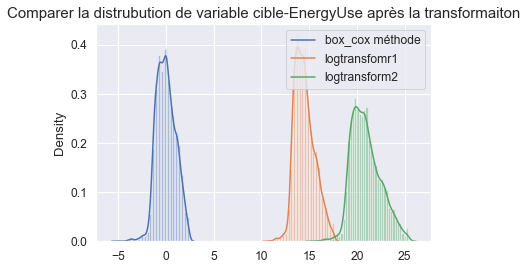

In [195]:
# Visualisé la variables recentrée 
transformers_energy = [y_energy1, y_energy_log, y_energy_log2p] 

for df in transformers_energy : 
    sns.distplot(df)
    plt.legend(labels=['box_cox méthode', "logtransfomr1", "logtransform2"])
    plt.title ("Comparer la distrubution de variable cible-EnergyUse après la transformaiton", fontsize= 15)

plt.savefig('transformation_energy.png',orientation='portrait', bbox_inches='tight')  

In [196]:
# ## Recentrage du variable de l'émission de CO2'


y_gaz1 = pd.DataFrame(pt.fit_transform(y_gaz), columns= y_gaz.columns)

y_gaz2 = pd.DataFrame(pt2.fit_transform(y_gaz), columns= y_gaz.columns)

y_gaz3 = pd.DataFrame(rs.fit_transform(y_gaz), columns = y_gaz.columns)

y_gaz4 = pd.DataFrame(mm.fit_transform(y_gaz), columns = y_gaz.columns)

y_gaz5 = pd.DataFrame(ss.fit_transform(y_gaz), columns = y_gaz.columns)


#Log transformer 
y_gaz_log = np.log(y_gaz)
y_gaz_log2p = np.log2(1+y_gaz)


print("skewness avec Powertransform(box_cox) :",  y_gaz1.skew())
print("skewness avec Powertransform(yeo_johnson) :",  y_gaz2.skew())
print("skewness avec RebustScaler :",  y_gaz3.skew())
print("skewness avec MinMax Scaler :",  y_gaz4.skew())
print("skewness avec StandardScaler :",  y_gaz5.skew())
print("skewness avec Logtransform :",  y_gaz_log.skew())
print("skewness avec Logtransform :",  y_gaz_log2p.skew())


skewness avec Powertransform(box_cox) : TotalGHGEmissions    0.016295
dtype: float64
skewness avec Powertransform(yeo_johnson) : TotalGHGEmissions    0.038322
dtype: float64
skewness avec RebustScaler : TotalGHGEmissions    4.47487
dtype: float64
skewness avec MinMax Scaler : TotalGHGEmissions    4.47487
dtype: float64
skewness avec StandardScaler : TotalGHGEmissions    4.47487
dtype: float64
skewness avec Logtransform : TotalGHGEmissions    0.137081
dtype: float64
skewness avec Logtransform : TotalGHGEmissions    0.253488
dtype: float64


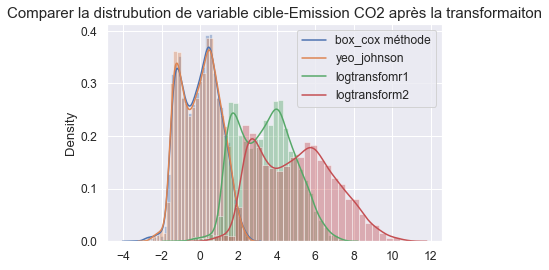

In [197]:
transformers_gaz = [y_gaz1 , y_gaz2, y_gaz_log, y_gaz_log2p] 

for df in transformers_gaz : 
    sns.distplot(df)
    plt.legend(labels=['box_cox méthode',"yeo_johnson","logtransfomr1", "logtransform2"])
    plt.title ("Comparer la distrubution de variable cible-Emission CO2 après la transformaiton", fontsize= 15)

plt.savefig('transformation_GHG.png',orientation='portrait', bbox_inches='tight')  

- On constate qu'entre plusieurs transformer le Logarithmique transformer est la plus pertinent. 
- Ce transformer a normalisé au mieux la distribution de la variable cible. 
 
- Cela montre que logarithmique transformer est le transformer pertient 

### Split data en train/test

In [198]:
xtrain, xtest, ytrain_energy, ytest_energy = train_test_split(X2,
                                                              y_energy_log2p,
                                                             test_size = 0.3, random_state=42)


xtrain, xtest, ytrain_gaz, ytest_gaz = train_test_split(X2,
                                                        y_gaz_log2p,
                                                        test_size= 0.3, random_state= 42)

In [200]:
print("la dimension de training set(variable explicatives) : ", xtrain.shape)
print("la dimension de test set(variable explicative) : ", xtest.shape)

print("la dimension de training set(variable cible): ", ytrain_energy.shape)
print("la dimension de test set(variable cible): ", ytest_energy.shape)

print("la dimension de training set(variable cible): ", ytrain_gaz.shape)
print("la dimension de test set(variable cible): ", ytest_gaz.shape)

la dimension de training set(variable explicatives) :  (3836, 29)
la dimension de test set(variable explicative) :  (1644, 29)
la dimension de training set(variable cible):  (3836, 1)
la dimension de test set(variable cible):  (1644, 1)
la dimension de training set(variable cible):  (3836, 1)
la dimension de test set(variable cible):  (1644, 1)


In [201]:
# Vérification finale de la Multicolinéarité des variables explicative avant model fitting

correlation2 = xtrain.corr()


threshold3 = 0.7
corr_pairs_t= correlation2 .unstack().sort_values(kind="quicksort")
fort_corr_t = (pd.DataFrame(corr_pairs_t[(abs(corr_pairs_t) > threshold3)])
               .reset_index().rename(columns={0:'corr_coeff'}))
fort_corr_t = fort_corr_t[(fort_corr_t.index%2 == 0) & (fort_corr_t['level_0'] != fort_corr_t['level_1'])]
fort_corr_t.sort_values('corr_coeff', ascending=False)

,level_0,level_1,corr_coeff
0,Building/Total_GFA,PropertyGFAParking,-0.702431


## 5.2 Créer le modèle baseline : Régression linéaire multivarié

In [202]:
# créer un object de la classe LinearRegression 
lr = LinearRegression()


lr_gaz = lr.fit(xtrain, ytrain_gaz)
lr_energy =  lr.fit(xtrain, ytrain_energy)

#### Rappel des mesure de performance des algorithme de régression apprentissage automatique supervisée**
- R2 : R-squared (Coefficinet de détermination) représente la part de la variance de la variable dépendante expliquée par les variables indépendantes du modèle. Il mesure la force de la relation entre votre modèle et la variable dépendante
- MAE : (Mean Absolute Error) la moyenne de la différence absolue entre la valeur cible et la valeur prédite par le modèle. Non préféré dans les cas où les valeurs aberrantes sont importantes
- MSE : (Mean Squared Error) : la moyenne de la différence au carré entre la valeur prédite et la valeur réelle. 
- RMSE : (Racine carré de MSE):  représnete l'écart type des résidus (erreurs de prédiction) -
- RMSLE: (Root Mean Squared Log Error) cette métrique est utilisée quand les variables cibles ont de grands écarts type. 
- MAPE : (Mean Absolute Percentage Error) 

## 5.3 Optimiser des hyperpramètres

#### L'optimisation des hyperparamètres avec "Random search" & "Grid Search"



**Rappel :** 
- Random Search configure une grille de valeurs d'hyperparamètres et sélectionne des combinaisons aléatoires pour former le modèle et le score.
- Grid Search : La méthode GridSearchCV applique une grid search et une validation croisée (5 découpes par défaut, mais modifiable en paramètre).



In [203]:
# Adjuster les hyperparamètres : l'approcne recherch aléatoire 

def random_model(model_base, params, label_train) :
    tuned_model = RandomizedSearchCV(estimator = model_base, param_distributions= params,
                            n_iter = 100, n_jobs = -1, 
                            return_train_score= True, cv = 5,
                            scoring =('r2','neg_mean_squared_error'),
                            refit='neg_mean_squared_error').fit(xtrain, label_train)
    
                           
    return (tuned_model)



# Adjuster les hyperparamètre;:  l'approche grid search 
#tester une série de paramètres et de comparer les performances pour en déduire le meilleur paramétrage.

def grid_model(model_base, params, label_train) :
    
    tuned_model = GridSearchCV(estimator = model_base, param_grid= params,
                              n_jobs = -1, cv = 5, 
                             scoring =('r2','neg_mean_squared_error'),
                            refit='neg_mean_squared_error',
                            return_train_score = True).fit(xtrain, label_train)
    
    return (tuned_model)
    

def model_scoring (model) : 
    
    df_perform = pd.DataFrame(model.cv_results_)
    best_params = model.best_params_
    best_mse= model.best_score_
    best_model = model.best_estimator_ 
    best_r2 =  np.mean(df_perform[df_perform.rank_test_r2 == 1]['mean_test_r2'])   
    training_time = round((np.mean(df_perform.mean_fit_time)*xtrain.shape[0]),2)
    
    print("Meilleur score MSE : {}\nMeilleur Score R2 : {}\nMeilleurs paramètres :\ {}\nTemps moyen d'entrainement : {}s"\
          .format(round(best_mse,3), round(best_r2,3), best_params, training_time))
    
    return df_perform[['mean_fit_time',
'mean_train_neg_mean_squared_error',
'mean_test_neg_mean_squared_error',
'rank_test_r2',
'mean_train_r2',
'mean_test_r2']].head()
    

In [204]:
# afficher les paramètre utilisés par le modèle actuel 
print('Les paramètres utilisés de modèle Lineare Regression" :\n')
mlr_params = lr.get_params().keys()
pprint(mlr_params)

Les paramètres utilisés de modèle Lineare Regression" :

dict_keys(['copy_X', 'fit_intercept', 'n_jobs', 'normalize'])


In [205]:
param_mlr = {"fit_intercept": [True, False],
             "normalize": [True, False]}

lr_energy = grid_model(lr, param_mlr, ytrain_energy)

lr_gaz = grid_model(lr, param_mlr, ytrain_gaz)


In [206]:

print("Modèle performance Regression Linéaire pour la consommatiaon de l'energy\n:")
model_scoring(lr_energy)

Modèle performance Regression Linéaire pour la consommatiaon de l'energy
:
Meilleur score MSE : -0.899
Meilleur Score R2 : 0.604
Meilleurs paramètres :\ {'fit_intercept': True, 'normalize': False}
Temps moyen d'entrainement : 46.31s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.020047,-0.861344,-7.908809e+10,2,0.620395,-3.447895e+10
1,0.006249,-0.875261,-8.989571e-01,1,0.614208,6.035952e-01
2,0.006248,-0.861166,-4.185906e+21,3,0.620473,-1.824872e+21
3,0.015740,-0.861166,-4.185906e+21,3,0.620473,-1.824872e+21


In [207]:
print("Modèle performance Regression Linéaire pour l'émssion de gaz\n:")
model_scoring(lr_gaz)

Modèle performance Regression Linéaire pour l'émssion de gaz
:
Meilleur score MSE : -1.168
Meilleur Score R2 : 0.69
Meilleurs paramètres :\ {'fit_intercept': True, 'normalize': False}
Temps moyen d'entrainement : 30.18s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.006246,-1.134025,-1.114519e+11,2,0.699911,-2.796317e+10
1,0.009373,-1.141382,-1.167751e+00,1,0.697971,6.898990e-01
2,0.009374,-1.133540,-6.391379e+20,3,0.700038,-1.603590e+20
3,0.006479,-1.133540,-6.391379e+20,3,0.700038,-1.603590e+20


## 5.4 Tester les modèle de régression

### Régression régularisée : ElasticNet

**Rappel: Comment fonctionne la régularisation par l'algorithme ElasticNet?**
 
 - L'objectif principal est de trouver les coefficients qui minimisent la somme des carrés d'erreur en appliquant une pénalité à ces coefficients. ElasticNet combine les approches L1 et L2 (Lasso et Ridge).

In [208]:
#Instantier le modèle base d'eElasticNet regressor
elasticnet= ElasticNet()
#elasticnet_gaz = ElasticNet()

# afficher les paramètre utilisés par le modèle actuel 
print('Les paramètres utilisés du model "Elastic Net" :\n')
random_param_en = elasticnet.get_params()
pprint(random_param_en)

Les paramètres utilisés du model "Elastic Net" :

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'l1_ratio': 0.5,
 'max_iter': 1000,
 'normalize': False,
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}


**Nous allons essayer d'ajuster l'ensemble d'hyperparamètres suivant :**

- **l1_ratio** : This is called the ElasticNet mixing parameter. Its range is 0 < = l1_ratio < = 1. If l1_ratio = 1, the penalty would be L1 penalty. If l1_ratio = 0, the penalty would be an L2 penalty. If the value of l1 ratio is between 0 and 1, the penalty would be the combination of L1 and L2.
- **Alpha** = the constant that multiplies the L1/L2 term, is the tuning parameter that decides how much we want to penalize the model. The default value is 1.0.  

- **selection** = 
   - Cyclic − The default value is cyclic which means the features will be looping over sequentially by default.

  - Random − If we set the selection to random, a random coefficient will be updated every iteration.

#### Adjuster les hypèparamètre; l'approche grid search aléatoire 

In [209]:
#alpha, coef qui multiplie le terme de pénalité
alpha_r = np.logspace(-4, 4, 10, endpoint=True)

#L1 ratio , =1 équivaut à un Lasso, 0 à un Ridge
en_l1ratio_r = np.linspace(0, 1, 100, endpoint = False)[1:]

max_iter_r= np.linspace(10,1000,100)

en_params = {'alpha': alpha_r,
            'l1_ratio': en_l1ratio_r, 
            'max_iter' : max_iter_r
            }

In [210]:
energy_elasticnet = random_model(elasticnet, en_params, ytrain_energy)
print("Performance du modèle ElasticNet pour la consommation de l'energy\n")
model_scoring(energy_elasticnet)


Performance du modèle ElasticNet pour la consommation de l'energy

Meilleur score MSE : -0.879
Meilleur Score R2 : 0.612
Meilleurs paramètres :\ {'max_iter': 570.0, 'l1_ratio': 0.79, 'alpha': 0.0001}
Temps moyen d'entrainement : 66.12s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.000000,-0.907027,-0.919265,24,0.600258,0.594326
1,0.006249,-2.269224,-2.269327,47,0.000000,-0.000121
2,0.009374,-2.269224,-2.269327,47,0.000000,-0.000121
3,0.003125,-2.269224,-2.269327,47,0.000000,-0.000121
4,0.047978,-0.865164,-0.881129,15,0.618711,0.611162


- On constate que le "Ratio_l1" du modèle ElasticNet pour la consommation de l'énergie équivaut à 1. 
- Ce qui veut dire que le modèle régularisé est un modèle Ridge 


In [211]:
gaz_elasticnet = random_model(elasticnet, en_params, ytrain_gaz)

print("Performance du modèle ElasticNet pour l'emission Gaz\n")
model_scoring(gaz_elasticnet)

Performance du modèle ElasticNet pour l'emission Gaz

Meilleur score MSE : -1.159
Meilleur Score R2 : 0.692
Meilleurs paramètres :\ {'max_iter': 580.0, 'l1_ratio': 0.8300000000000001, 'alpha': 0.0001}
Temps moyen d'entrainement : 73.91s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.012498,-2.711710,-2.713861,60,0.282520,0.281855
1,0.006254,-3.779738,-3.780364,62,0.000000,-0.000476
2,0.009376,-1.228454,-1.246393,30,0.674925,0.669101
3,0.037166,-1.150379,-1.173855,22,0.695584,0.688305
4,0.009374,-3.779738,-3.780364,62,0.000000,-0.000476


- Suite à cette première modélisation par ElasticNet, les métriques ne se sont que légérement améliorées pour les prédictions de la consommation d'énergie et des émissions de CO2.

- Nous allons à présent tester un modèle non linéaire ensemblist : RandomForestRegressor

### Régression non-linéaire, méthode ensembliste : RandomForestRegressor 

 **Rappel : Comment fonctionne un random forest de régression?** 
- Un random forest fonctionne sur le principe du bagging. La première étape consiste à découper un dataset en sous-ensembles (arbres de décision), puis de proposer un modèle d'entraînement à chacun de ses groupes. Enfin, on combine les résultats de ces arbres afin d'obtenir la prévision la plus solide

In [212]:
# Créer modèle de base 
rf= RandomForestRegressor()

# afficher les paramètre utilisés par le modèle actuel 
print('Les paramètres utilisés du model "Random Forest Regressor" :\n')
rf_params = rf.get_params()
pprint(rf_params)



Les paramètres utilisés du model "Random Forest Regressor" :

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}


**Nous allons essayer d'ajuster l'ensemble d'hyperparamètres suivant :**

- n_estimators = nombre d'arbres 
- max_features = nombre maximum de variable explicatives prises en compte pour diviser un nœud
- max_depth = nombre maximum de niveaux de foret
- min_samples_split = nombre minimum des échantillion dans un nœud avant que le nœud ne soit divisé
- min_samples_leaf = nombre minimal des échantillon  dans chaque feuille
- bootstrap = méthode d'échantillonnage des points de données (avec ou sans remplacement

In [213]:
#nombre maximum de variables 
max_features = ['auto','sqrt'] 

# chemin le plus long entre la racine et les feuilles
max_depth = np.linspace(10, 1000, 200, dtype = int)

# le nombre minimum des echantillon dans chaque noeud 

min_samples_split = np.linspace(5, 20, 5, dtype = int)

min_samples_leaf = np.linspace(5, 20, 5, dtype = int)

# méthode utilisée pour échantillonner les points de données
bootstrap = [False, True] 


rf_params_tune = {'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap
                 }

In [214]:
rf_energy = random_model(rf, rf_params_tune, ytrain_energy)
rf_gaz = random_model(rf, rf_params_tune, ytrain_gaz)

In [215]:
print("Performance du modèle RandomForestRegressor pour la consommation de l'energy\n")
model_scoring(rf_energy)

Performance du modèle RandomForestRegressor pour la consommation de l'energy

Meilleur score MSE : -0.464
Meilleur Score R2 : 0.795
Meilleurs paramètres :\ {'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 532, 'bootstrap': True}
Temps moyen d'entrainement : 4164.63s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.396818,-0.521576,-0.609906,50,0.770149,0.731094
1,1.487954,-0.348280,-0.609438,51,0.846519,0.730951
2,1.063472,-0.354423,-0.509481,5,0.843801,0.775268
3,1.323745,-0.481147,-0.644644,74,0.787948,0.715698
4,0.910991,-0.478925,-0.575925,23,0.788931,0.746147


In [216]:
print("Performance du modèle RandomForestRegressor pour l'emission GHG\n")
model_scoring(rf_gaz)

Performance du modèle RandomForestRegressor pour l'emission GHG

Meilleur score MSE : -0.72
Meilleur Score R2 : 0.809
Meilleurs paramètres :\ {'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 920, 'bootstrap': True}
Temps moyen d'entrainement : 3527.75s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.414948,-0.875031,-0.977116,70,0.768452,0.741027
1,0.951801,-0.787888,-0.947685,54,0.791487,0.748722
2,0.449043,-0.867942,-0.964057,65,0.770320,0.744498
3,0.462864,-0.871036,-0.970546,67,0.769515,0.742771
4,0.431866,-0.921446,-1.005519,76,0.756183,0.733497


In [217]:
print(rf_energy.best_params_)
print(rf_gaz.best_params_)

{'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 532, 'bootstrap': True}
{'min_samples_split': 8, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 920, 'bootstrap': True}


In [218]:
#nombre maximum de variables 
max_features_test= ['auto'] 

# chemin le plus long entre la racine et les feuilles
max_depth_test = np.linspace(100, 1000, 10, dtype = int)

# le nombre minimum des echantillon dans chaque noeud 

min_samples_split_test = [2, 4, 10]

min_samples_leaf_test = [5, 10, 15]

# méthode utilisée pour échantillonner les points de données
bootstrap_test = ['Ture'] 


rf_params_test = {'max_features': max_features_test,
               'max_depth': max_depth_test,
               'min_samples_split': min_samples_split_test,
               'min_samples_leaf': min_samples_leaf_test,
               'bootstrap': bootstrap_test
                 }

In [219]:
rf_energy_test = grid_model(rf, rf_params_test, ytrain_energy)


print("Performance du modèle RandomForestRegressor pour la consommation de l'energy\n")
model_scoring(rf_energy_test)



Performance du modèle RandomForestRegressor pour la consommation de l'energy

Meilleur score MSE : -0.462
Meilleur Score R2 : 0.796
Meilleurs paramètres :\ {'bootstrap': 'Ture', 'max_depth': 1000, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 2}
Temps moyen d'entrainement : 4795.65s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,1.222569,-0.262514,-0.467396,28,0.884311,0.793757
1,1.294364,-0.262506,-0.466458,22,0.884313,0.794196
2,1.366203,-0.262167,-0.465805,18,0.884465,0.794492
3,1.110753,-0.395452,-0.533536,59,0.825721,0.764686
4,1.088109,-0.394952,-0.529935,35,0.825942,0.766302


In [220]:
rf_gaz_test = grid_model(rf, rf_params_test, ytrain_gaz)
print("Performance du modèle RandomForestRegressor pour l'emission de gaz'\n")
model_scoring(rf_gaz_test)

Performance du modèle RandomForestRegressor pour l'emission de gaz'

Meilleur score MSE : -0.719
Meilleur Score R2 : 0.809
Meilleurs paramètres :\ {'bootstrap': 'Ture', 'max_depth': 500, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 10}
Temps moyen d'entrainement : 4778.61s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,1.463893,-0.392289,-0.723867,24,0.896186,0.807803
1,1.513913,-0.393089,-0.719666,2,0.895973,0.808889
2,1.638861,-0.394219,-0.723554,23,0.895678,0.807850
3,1.297805,-0.596970,-0.830763,37,0.842013,0.779471
4,1.420958,-0.599949,-0.835917,59,0.841236,0.778085


In [221]:
print(rf_energy_test.best_params_)
print(rf_gaz_test.best_params_)

{'bootstrap': 'Ture', 'max_depth': 1000, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 2}
{'bootstrap': 'Ture', 'max_depth': 500, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 10}


- On constate qu'appliquer la méthode de "recherche aléatoire" pour l'adjustement de modèles de RandomForestRegressor est très couteux en terme de 'time_consuming'. Par ailleures les scores (MSE) ne sont que légèrement modifiés. 
- On va donc essayer d'optimiser le modèle par "GridSearch" 

- On constate que ce dernier "grid space" donne le meilleur résultat que les deux précedants. 
- Les modèle adjusté pour RandomForestRegressor sont donc : 
     - "rf_energy_test
     - "rf_gaz_test

### Régression non-linéaire, boosting de gradient : XGBoost (eXtreme Gradient Boosting)

- L'algorithme Xtreme Gradiant Boosting appartien à la famille des GBM (Gradient Boosting Machine)

In [222]:
xgb_base = xgb.XGBRegressor()
# afficher les paramètre utilisés par le modèle actuel 
print('Les paramètres utilisés du model "XGBoost" :\n')
param_xgb= xgb_base.get_params
pprint(param_xgb)

Les paramètres utilisés du model "XGBoost" :

<bound method XGBModel.get_params of XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None,
             enable_categorical=False, gamma=None, gpu_id=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_delta_step=None, max_depth=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, reg_alpha=None, reg_lambda=None,
             scale_pos_weight=None, subsample=None, tree_method=None,
             validate_parameters=None, verbosity=None)>


- **Les hyperparamètres les plus important pour un algorithme XGBoost sont les suivant:**
- learning_rate'
- 'gamma'
- 'max_depth'
- 'min_child_weight' 
- 'n_estimators'


In [223]:
param_xgb = {'learning_rate' : [0.001, 0.01, 0.1, 0.2, 0,3],
             'gamma': [0, 0.25, 0.5, 1.0],
             'max_depth': [6, 10, 15, 20],
             'min_child_weight' : [0.5, 1.0, 3.0, 5.0, 7.0],
             'n_estimators': [25, 50, 100]}


In [224]:
xgb_energy = random_model(xgb_base, param_xgb, ytrain_energy.values)
print("Performance du modèle XGBoosting pour la consommation de l'energy-GridSearchCV\n")
model_scoring(xgb_energy)

Performance du modèle XGBoosting pour la consommation de l'energy-GridSearchCV

Meilleur score MSE : -0.35
Meilleur Score R2 : 0.846
Meilleurs paramètres :\ {'n_estimators': 100, 'min_child_weight': 0.5, 'max_depth': 20, 'learning_rate': 0.2, 'gamma': 0}
Temps moyen d'entrainement : 3020.56s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,1.517593,-0.211511,-0.430088,15,0.906774,0.810390
1,0.288644,-154.391466,-154.379572,34,-67.042624,-67.128568
2,0.150132,-399.262781,-399.264802,59,-174.961138,-175.199317
3,0.787492,-0.272457,-0.463450,23,0.879896,0.795652
4,1.689171,-0.243908,-0.440121,18,0.892491,0.805948


In [225]:
xgb_gaz = random_model(xgb_base, param_xgb, ytrain_gaz.values)
print("Performance du modèle XGBoosting pour la consommation de l'energy-GridSearchCV\n")
model_scoring(xgb_gaz)

Performance du modèle XGBoosting pour la consommation de l'energy-GridSearchCV

Meilleur score MSE : -0.535
Meilleur Score R2 : 0.858
Meilleurs paramètres :\ {'n_estimators': 100, 'min_child_weight': 0.5, 'max_depth': 20, 'learning_rate': 0.1, 'gamma': 0}
Temps moyen d'entrainement : 5272.31s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,1.291296,-4.062260e-01,-8.226291e-01,26,8.925023e-01,7.821417e-01
1,0.819045,-1.681733e+61,-1.681733e+61,100,-4.452472e+60,-4.451014e+60
2,0.611171,-1.490754e+01,-1.494571e+01,49,-2.944447e+00,-2.960894e+00
3,0.520511,-2.283654e+01,-2.284156e+01,67,-5.042397e+00,-5.054514e+00
4,0.854318,-1.687648e+31,-1.685206e+31,91,-4.468832e+30,-4.457308e+30


- On constate qu'avec l'algorithme XGBoost, les scores sont améliorés. Cependant cet algoritheme , ainis que RandomForestRegressor sont très coûteux en termes de time du calcul. 
- On va donc essayer un autre algorithme basé sur le Gradient Boosting Machine (GBM) qui est aussi rapide. 

### Régression de boosting de gradients : LightGBM

**Quels sont les avantage du modèle LightGBM**

- LightGBM est un algorithme de machine learning basé sur le Gradient Boosting Machine. 

- Cet algorithme repose sur des arbres de décisions.

**- Les avantages de LightGBM :**
   - Vitesse d'entraînement 
   - Moins d'utilisation de la mémoire
   - Réduction des coûts de communication pour l’apprentissage parallèle
   - Réduction des coûts pour le calcul du gain pour chaque division dans l’arbre de décision.
   
**- Les inconvénients de LightGBM :** 
  - Overfitting : comme LightGBM s’entraîne beaucoup plus rapidement, cela peut parfois entraîner un surapprentissage


In [226]:
import lightgbm as lgb

In [227]:
lgb_base = lgb.LGBMRegressor()
# afficher les paramètre utilisés par le modèle actuel 
print('Les paramètres utilisés du model "XGBoost" :\n')
param_lgb= lgb_base.get_params().keys()
pprint(param_lgb)

Les paramètres utilisés du model "XGBoost" :

dict_keys(['boosting_type', 'class_weight', 'colsample_bytree', 'importance_type', 'learning_rate', 'max_depth', 'min_child_samples', 'min_child_weight', 'min_split_gain', 'n_estimators', 'n_jobs', 'num_leaves', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'silent', 'subsample', 'subsample_for_bin', 'subsample_freq'])


- **Pour obtenir le meilleur ajustement ainsi que la précision  les paramètres suivants doivent être réglés **:

**bossting type** : Permet d'optimiser la méthode de "boosting". Ici on choisit entre "goss" (Gradient-based One-Side Sampling) qui est une méthode utilisant le sous-échantillonnage et "dart" utilisant la méthode Dropout de Neural Networks 
**num_leaves** : Étant donné que LightGBM grandit par feuille, cette valeur doit être inférieure à 2^(max_depth) pour éviter un scénario de surapprentissage. (2*depth - 1)

**min_child_samples** : pour les grands ensembles de données, sa valeur doit être définie en centaines ou en milliers.

**max_depth** : Un paramètre clé dont la valeur doit être définie en conséquence pour éviter le surapprentissage.

**max_bin** : permet d'optimiser le "memory stockage" une valeur élevée aura un impact majeur sur la précision mais finira par entraîner un surapprentissage.

In [228]:
boosting_type_lgb = ['dart', 'goss', 'gbdt']
max_depth_lgb= [3, 6, 9 , 12]
num_leaves_lgb = [(i * 2)- 1 for i in max_depth_lgb]
min_child_samples_lgb = [100,200]


lgb_params = { 'boosting_type' : boosting_type_lgb,
              'num_leaves' : num_leaves_lgb,
              'max_depth' : max_depth_lgb,
              'min_child_samples' : min_child_samples_lgb
              }

In [229]:
boosting_type_lgb = ['dart', 'goss', 'gbdt']


# chemin le plus long entre la racine et les feuilles
max_depth_lgb = np.linspace(3, 15, 10, dtype = int)
num_leaves_lgb = [(i * 2)- 1 for i in max_depth_lgb]
# le nombre minimum des echantillon dans chaque noeud 

min_child_samples_lgb = np.linspace(2, 10, 5, dtype = int)

lgb_params = { 'boosting_type' : boosting_type_lgb,
              'max_depth' : max_depth_lgb,
              'num_leaves' : num_leaves_lgb,
              'min_child_samples' : min_child_samples_lgb
              }

lgb_params

{'boosting_type': ['dart', 'goss', 'gbdt'],
 'max_depth': array([ 3,  4,  5,  7,  8,  9, 11, 12, 13, 15]),
 'num_leaves': [5, 7, 9, 13, 15, 17, 21, 23, 25, 29],
 'min_child_samples': array([ 2,  4,  6,  8, 10])}

In [230]:
lgb_energy = random_model(lgb_base, lgb_params, ytrain_energy)

print("Performance du modèle LighGBM pour la consommation de l'energy-GridSearchCV\n")
model_scoring(lgb_energy)


Performance du modèle LighGBM pour la consommation de l'energy-GridSearchCV

Meilleur score MSE : -0.441
Meilleur Score R2 : 0.806
Meilleurs paramètres :\ {'num_leaves': 23, 'min_child_samples': 4, 'max_depth': 12, 'boosting_type': 'gbdt'}
Temps moyen d'entrainement : 1826.02s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.659362,-0.298958,-0.476640,31,0.868259,0.789619
1,0.625046,-0.270641,-0.456981,9,0.880723,0.798486
2,0.641046,-0.275870,-0.463515,15,0.878424,0.795610
3,0.576706,-4.955115,-5.037102,88,-1.183786,-1.223130
4,0.618739,-0.310118,-0.472672,23,0.863322,0.791608


In [231]:
lgb_gaz = random_model(lgb_base, lgb_params, ytrain_gaz)
print("Performance du modèle LighGBM pour l'emission GHG'-GridSearchCV\n")
model_scoring(lgb_gaz)

Performance du modèle LighGBM pour l'emission GHG'-GridSearchCV

Meilleur score MSE : -0.69
Meilleur Score R2 : 0.817
Meilleurs paramètres :\ {'num_leaves': 25, 'min_child_samples': 2, 'max_depth': 8, 'boosting_type': 'gbdt'}
Temps moyen d'entrainement : 1701.29s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.311400,-0.604768,-0.774361,39,0.839983,0.794488
1,0.252978,-1.135864,-1.205571,98,0.699452,0.680920
2,0.932597,-0.797398,-1.029601,72,0.789001,0.727298
3,0.385663,-0.550216,-0.761158,32,0.854395,0.797881
4,0.216440,-0.675737,-0.802371,57,0.821190,0.787079


### 5.5 Comparer les algorithmes 

In [232]:
# Créer une liste des métriques pour comparer les modèles 

metrics = ['mean_fit_time', 
           'mean_score_time', 
           'mean_test_neg_mean_squared_error',
           'mean_train_neg_mean_squared_error']


In [233]:
# Créer un dataframe pour comparer tous les modèles pour la consommation de l"énergy

df_energy1 = pd.DataFrame(lgb_energy.cv_results_) 
df_energy2 = pd.DataFrame(rf_energy_test.cv_results_) 
df_energy3 = pd.DataFrame(energy_elasticnet.cv_results_)
df_energy4 = pd.DataFrame(xgb_energy.cv_results_) 
df_energy5 = pd.DataFrame(lgb_energy.cv_results_)


lr_results_energy = pd.DataFrame(df_energy1[metrics].mean(), columns= ['Linear Regression'] )
rf_results_energy = pd.DataFrame(df_energy2[metrics].mean(), columns = ['RandomForestRegressor'])
en_results_energy = pd.DataFrame(df_energy3[metrics].mean(), columns = ['ElasticNet'] ) 
xgb_results_energy = pd.DataFrame(df_energy4[metrics].mean(), columns=['XGBoost'])
lgb_results_energy = pd.DataFrame(df_energy5[metrics].mean(), columns=['LightGBM'])

energy_model_compare  = pd.concat([lr_results_energy,
                                   rf_results_energy, en_results_energy, xgb_results_energy, lgb_results_energy], axis= 1)


energy_model_compare

,Linear Regression,RandomForestRegressor,ElasticNet,XGBoost,LightGBM
mean_fit_time,0.476023,1.250170,0.017236,7.874251e-01,0.476023
mean_score_time,0.009198,0.028209,0.005644,8.367732e-03,0.009198
mean_test_neg_mean_squared_error,-1.944635,-0.522541,-1.748652,-5.030095e+61,-1.944635
mean_train_neg_mean_squared_error,-1.815702,-0.375238,-1.742563,-5.030095e+61,-1.815702


In [234]:
# Créer un dataframe pour comparer les modèles de l'emission de GHG

df_gaz1 = pd.DataFrame(lr_gaz.cv_results_) 
df_gaz2 = pd.DataFrame(rf_gaz_test.cv_results_)  
df_gaz3 = pd.DataFrame(gaz_elasticnet.cv_results_)
df_gaz4 = pd.DataFrame(xgb_gaz.cv_results_) 
df_gaz5 = pd.DataFrame(lgb_gaz.cv_results_)

lr_results = pd.DataFrame(df_gaz1[metrics].mean(), columns= ['Linear Regression'] )
rf_results = pd.DataFrame(df_gaz2[metrics].mean(), columns = ['RandomForestRegressor'])
en_results = pd.DataFrame(df_gaz3[metrics].mean(), columns = ['ElasticNet'] ) 
xgb_results = pd.DataFrame(df_gaz4[metrics].mean(), columns=['XGBoost'])
lgb_results = pd.DataFrame(df_gaz5[metrics].mean(), columns=['LightGBM'])

gaz_model_compare  = pd.concat([lr_results, rf_results, en_results, xgb_results, lgb_results], axis= 1)
#gaz_model_compare.reset_index(inplace = True)

gaz_model_compare

,Linear Regression,RandomForestRegressor,ElasticNet,XGBoost,LightGBM
mean_fit_time,7.867789e-03,1.245728,0.019267,1.374429e+00,0.443506
mean_score_time,5.524707e-03,0.028152,0.006155,8.788821e-03,0.008518
mean_test_neg_mean_squared_error,-3.195689e+20,-0.819556,-2.429255,-9.764466e+59,-0.867587
mean_train_neg_mean_squared_error,-1.135622e+00,-0.568599,-2.419448,-9.764466e+59,-0.685266


- On peut constater que pour chaque algorithme 'il n' y a pas de différence significative entre les deux score(MSE) pour les données d'entrainement et les données de test. Par conséquent, les modèles ont fait une estimation assez précise.

- On élimine le modèle 'XGBoost , car il est hor norms.


In [235]:
energy_models = energy_model_compare.drop(['XGBoost'], axis= 1)


energy_models= energy_models.T.reset_index().rename({'index': 'Model'}, axis=1)



energy_models[['mean_test_neg_mean_squared_error',
      'mean_train_neg_mean_squared_error']] = np.abs(energy_models[['mean_test_neg_mean_squared_error',
     'mean_train_neg_mean_squared_error']])

energy_models


,Model,mean_fit_time,mean_score_time,mean_test_neg_mean_squared_error,mean_train_neg_mean_squared_error
0,Linear Regression,0.476023,0.009198,1.944635,1.815702
1,RandomForestRegressor,1.250170,0.028209,0.522541,0.375238
2,ElasticNet,0.017236,0.005644,1.748652,1.742563
3,LightGBM,0.476023,0.009198,1.944635,1.815702


In [236]:
gaz_models = gaz_model_compare.drop(['XGBoost', 'Linear Regression'], axis= 1)




gaz_models= gaz_models.T.reset_index().rename({'index': 'Model'}, axis=1)
gaz_models[['mean_test_neg_mean_squared_error',
       'mean_train_neg_mean_squared_error']] = np.abs(gaz_models[['mean_test_neg_mean_squared_error',
       'mean_train_neg_mean_squared_error']])

gaz_models

,Model,mean_fit_time,mean_score_time,mean_test_neg_mean_squared_error,mean_train_neg_mean_squared_error
0,RandomForestRegressor,1.245728,0.028152,0.819556,0.568599
1,ElasticNet,0.019267,0.006155,2.429255,2.419448
2,LightGBM,0.443506,0.008518,0.867587,0.685266


#####  Visualisation de Time/Quality TradeOff pour le choix de l'algorithme pour la consommation énergétique

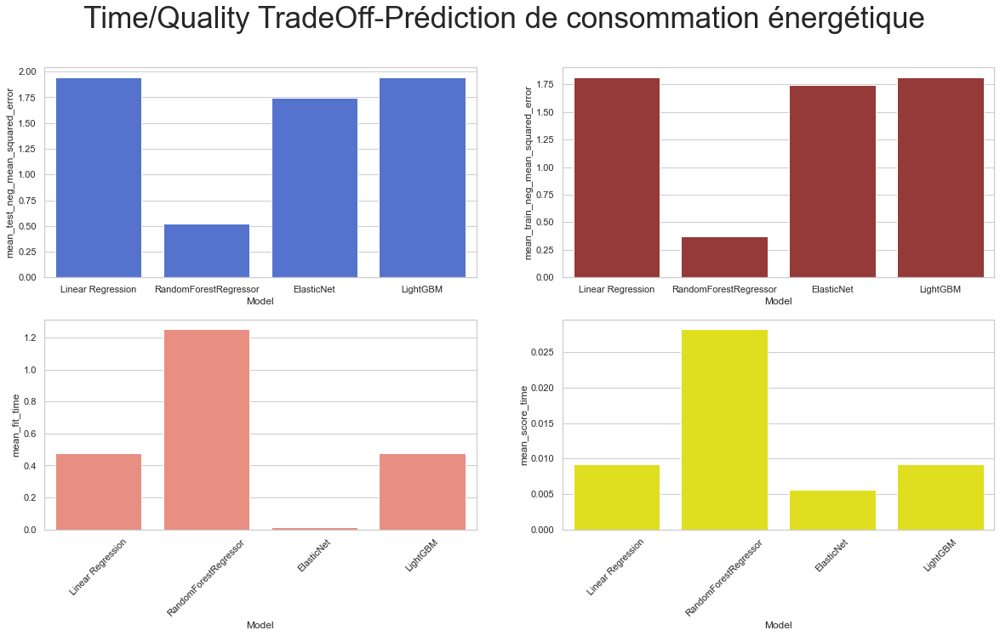

In [237]:
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(20,10))

fig.suptitle("Time/Quality TradeOff-Prédiction de consommation énergétique", fontsize = 35)

mse_test = sns.barplot(data = energy_models, x= 'Model',
            y = 'mean_test_neg_mean_squared_error',ax=axes[0,0], color = 'royalblue')

#mse_test.set_xticklabels(mse_test.get_xticklabels(), rotation=90)

mse_train= sns.barplot(data = energy_models, x= 'Model',
            y = 'mean_train_neg_mean_squared_error', ax=axes[0,1],  color= 'brown')
#mse_train.set_xticklabels(mse_train.get_xticklabels(), rotation=90)
    
time_fit = sns.barplot(data = energy_models, x= 'Model',
            y = 'mean_fit_time', ax= axes[1,0], color = 'salmon')   
time_fit.set_xticklabels(time_fit.get_xticklabels(), rotation=45)

time_predict = sns.barplot(data = energy_models, x= 'Model',
            y = 'mean_score_time', ax= axes[1,1], color = 'yellow')
time_predict.set_xticklabels(time_predict.get_xticklabels(), rotation=45)
plt.savefig("energy_modeles", orientation='portrait',bbox_inches='tight') 
plt.show()

 - La projection graphique montre que pour la **prévision de la consommation de l'energie**,  le modèle **LightGBM** offre le meilleur compromis score / temps. Il est en effet meilleur en terme de score MSE et également bien plus rapide que les deux algorithmes avec Boostig.

- Le modèle retenu pour la modélisation de la variable de "SitEnergyUse" est donc le modèle "LightGBM". 

##### Visualisation de Time/Quality TradeOff pour le choix de l'algorithme pour l'émission de GHG

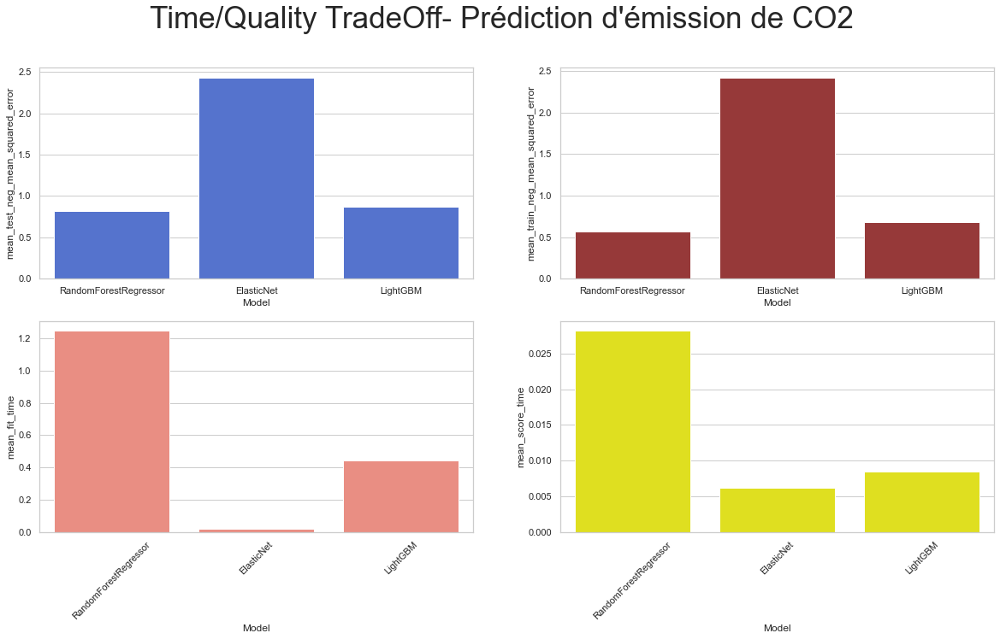

In [238]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))

fig.suptitle("Time/Quality TradeOff- Prédiction d'émission de CO2", fontsize = 35)

mse_test = sns.barplot(data = gaz_models, x= gaz_models['Model'],
            y = gaz_models['mean_test_neg_mean_squared_error'],ax=axes[0,0], color = 'royalblue')


mse_train= sns.barplot(data = gaz_models, x= gaz_models['Model'],
            y = gaz_models['mean_train_neg_mean_squared_error'], ax=axes[0,1], color= 'brown')
                       
                       
time_fit = sns.barplot(data = gaz_models, x= gaz_models['Model'],
            y = gaz_models['mean_fit_time'], ax= axes[1,0], color = 'salmon')   
time_fit.set_xticklabels(time_fit.get_xticklabels(), rotation=45)

time_predict = sns.barplot(data = gaz_models, x= gaz_models['Model'],
            y = gaz_models['mean_score_time'], ax= axes[1,1], color = 'yellow')

time_predict.set_xticklabels(time_predict.get_xticklabels(), rotation=45)
plt.savefig("gaz_modeles", orientation='portrait',bbox_inches='tight') 

plt.show()

 - La projection graphique montre que pour la **émission de GHG**,  le deux  modèle  **LightGBM** offre le meilleur compromis score / temps. Il est en effet meilleur en terme de la rapidité que les deux autre algorithme

- Le modèle retenu pour la modélisation de la variable de "TotalGHGEmissions" est donc le modèle "LightGBM".


##  5.6 Feature importance

- Nous allons à présent évaluer l'importance de chaque variable pour le modèle selectionné. 
#### Rappel : 
Evaluer l'importace des variables pour le modèle  fait référence à des techniques qui calculent un score pour toutes les variables pour un modèle donné - les scores représentent simplement «l'importance» de chaque variables. Un score plus élevé signifie que la caractéristique spécifique aura un effet plus important sur le modèle utilisé pour prédire une certaine variable.

##### Feature Importance du modèle LightGBM pour la consommation de l'énergie 

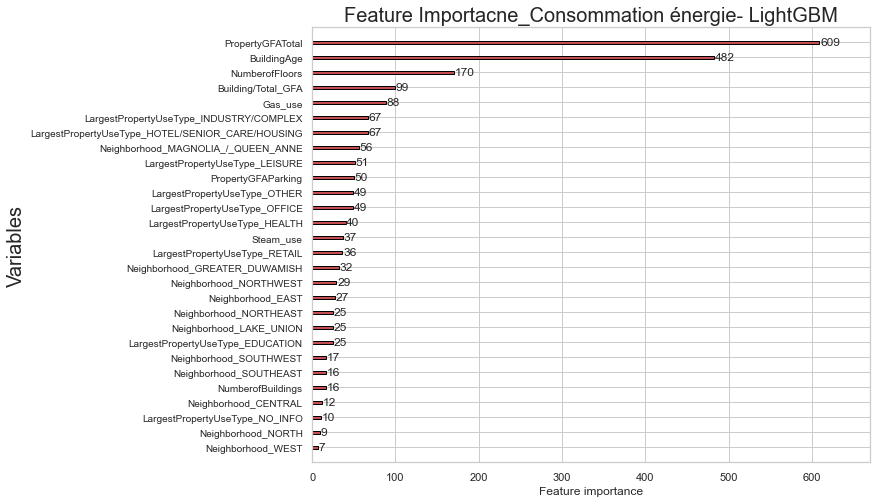

In [239]:
fig, ax = plt.subplots(figsize=(10, 8))

lgb.plot_importance(lgb_energy.best_estimator_, ax= ax, 
                    color = 'r', edgecolor='black')
#fig.patch.set_facecolor('#17becf')
fig.patch.set_alpha(1)
plt.yticks(fontsize = 10)
plt.ylabel('Variables', fontsize = 20)
plt.title('Feature Importacne_Consommation énergie- LightGBM', fontsize = 20)
plt.savefig("Feature Importacne_énergie", orientation='portrait',bbox_inches='tight') 

##### Feature Importance de LightGBM pour l'emission de GHG 

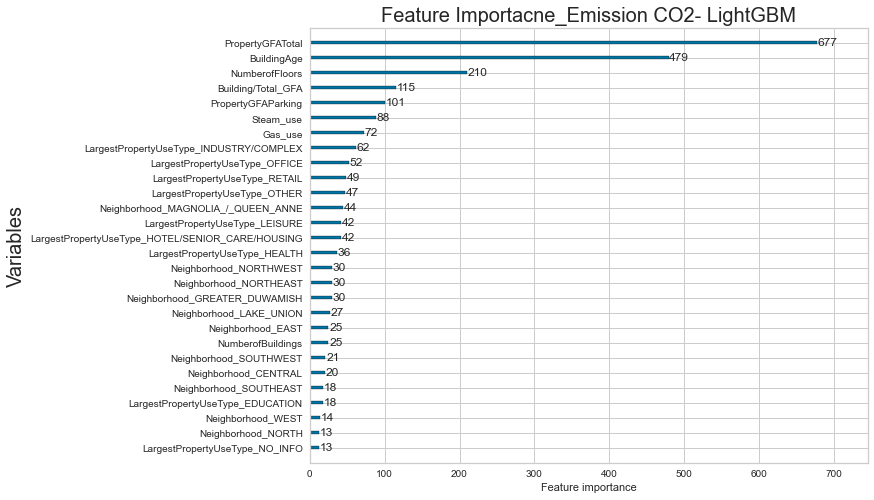

In [288]:
fig, ax = plt.subplots(figsize=(10, 8))


lgb.plot_importance(lgb_gaz.best_estimator_, ax =ax, color = 'b', edgecolor='black')
fig.patch.set_alpha(1)
plt.yticks(fontsize = 10)
plt.ylabel('Variables', fontsize = 20)
plt.title('Feature Importacne_Emission CO2- LightGBM', fontsize = 20)

plt.savefig("Feature Importacne_Emission GHG", orientation='portrait',bbox_inches='tight') 

- On constate que le résultat de la prédiction dépend principalement des caractéristiques de chaque établissement, à savoir sa superficie, et son 'année de construction.

- Le quartier et le type d'usage des chaque établissement ont des impacts plus modests sur le modèle.

## 5.7 Evaluer le modèle selectionné

In [241]:
# Foction pour évaluer l"algorithme de regression 

def evaluate(y_true, y_pred):
    
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true ,y_pred))
    mae = mean_absolute_error(y_true ,y_pred)
    dict_metrics = {"Métrique":["MSE", "R2", "RMSE", "MAE"], "Résultats":[mse, r2, rmse, mae]}
    df_metrics = pd.DataFrame(dict_metrics)


    print('Coefficient de déterminatiaon (R2)=',round(r2,3))
    print('Le carré moyen des erreurs (MSE) =', round(mse,3))
    print("Racine carré de MSE (RMSE) = ", round(rmse,3))
    print("Mean absolute Error (MAE) = ", round(mae,3))
    return df_metrics
 

In [242]:
### Rappel des meuillers paramètres du modèl LightGBM 

print("Meuilleurs modèle pour la consommation de l'energy :\n",'\n',lgb_energy.best_estimator_,"\n")
lgb_energy_pred =lgb_energy.best_estimator_.predict(xtest)

Meuilleurs modèle pour la consommation de l'energy :
 
 LGBMRegressor(max_depth=12, min_child_samples=4, num_leaves=23) 



In [243]:
print("Score du pour la prédiction de la consommation énergétique : \n")
evaluate(ytest_energy,lgb_energy_pred)

Score du pour la prédiction de la consommation énergétique : 

Coefficient de déterminatiaon (R2)= 0.808
Le carré moyen des erreurs (MSE) = 0.458
Racine carré de MSE (RMSE) =  0.677
Mean absolute Error (MAE) =  0.47


,Métrique,Résultats
0,MSE,0.458168
1,R2,0.808303
2,RMSE,0.676881
3,MAE,0.469880


In [244]:
print("Meuilleurs modèle pour l'émission de GHG' :\n",'\n',lgb_gaz.best_estimator_,"\n")


lgb_gaz_pred = lgb_gaz.best_estimator_.predict(xtest)

print("Score du model final pour l'emission de GHG : ")
evaluate(ytest_gaz['TotalGHGEmissions'].values, lgb_gaz_pred)


Meuilleurs modèle pour l'émission de GHG' :
 
 LGBMRegressor(max_depth=8, min_child_samples=2, num_leaves=25) 

Score du model final pour l'emission de GHG : 
Coefficient de déterminatiaon (R2)= 0.828
Le carré moyen des erreurs (MSE) = 0.691
Racine carré de MSE (RMSE) =  0.832
Mean absolute Error (MAE) =  0.595


,Métrique,Résultats
0,MSE,0.691458
1,R2,0.828498
2,RMSE,0.831540
3,MAE,0.594870


**Rappel**
- Le R-carré ou le  coefficient de détermination indique la proportion de la variance de la variable dépendante qui s’explique par des variables indépendantes dans le modèle de régression

- Lex deux modèles de prédiction de la consommation énergétique et de l'émission de CO2, on a pu obtenu un R2 > 80%. 
- Cela signifie que plus de 80% de la variance 80% de la dispersion est expliquée par notre modèle de régression.

 

#### Visualisation des erreurs du modèle; la prédiction de la consommation énergétique

In [245]:
# Créer un dataframe des valuers réel de la consomariont de l"énergy (ytest_energy) et les valeurs prédites 

df_energy_model = pd.DataFrame(list(zip(ytest_energy['SiteEnergyUse(kBtu)'].values,
                                        lgb_energy_pred)), columns = ['Valeur réel','Valeur prédite'])

df_energy_model["Residual"] = abs(df_energy_model['Valeur réel'] - df_energy_model['Valeur prédite'])
df_energy_model = df_energy_model.sort_values (by = 'Valeur réel')

df_energy_model.head(3)

,Valeur réel,Valeur prédite,Residual
735,15.802067,19.258316,3.456249
1432,16.731266,19.468474,2.737208
1579,16.809931,18.263520,1.453589


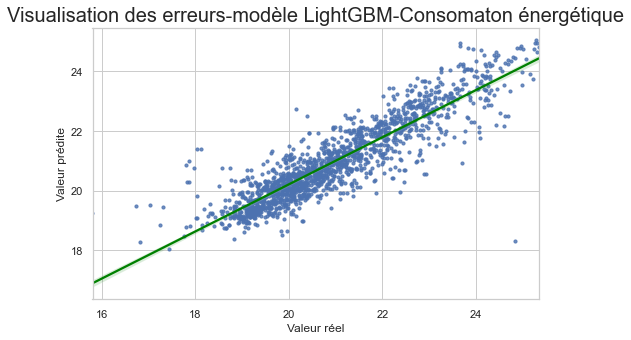

In [246]:
plt.figure(figsize= (8,5))
g = sns.regplot(data = df_energy_model , x= 'Valeur réel' , y = 'Valeur prédite',
              scatter_kws={"s": 10},
              line_kws={"color": "green"})


plt.title("Visualisation des erreurs-modèle LightGBM-Consomaton énergétique", size= 20)

plt.savefig("energy_erreur", orientation='portrait',bbox_inches='tight') 
plt.show()

#### Visualisation des résidus et leur distribution

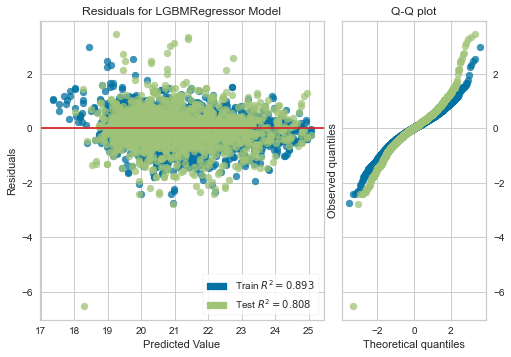

In [286]:
from yellowbrick.regressor import ResidualsPlot

visualizer = ResidualsPlot(lgb_energy.best_estimator_ , hist=False, qqplot=True, train_color='b', test_color= 'g',
                           line_color='#d62728')
visualizer.fit(xtrain, ytrain_energy['SiteEnergyUse(kBtu)'].values)  
visualizer.score(xtest, ytest_energy["SiteEnergyUse(kBtu)"].values)  
visualizer.show()  
visualizer.finalize()

#### Visualisation des erreurs du modèle; la prédiction de l'émission de CO2

In [249]:
# Créer un dataframe des valuers réel de la consomariont de l"énergy (ytest_energy) et les valeurs prédites 

df_gaz_model = pd.DataFrame(list(zip(ytest_gaz['TotalGHGEmissions'].values,
                                        lgb_gaz_pred)), columns = ['Valeur réel','Valeur prédite'])

df_gaz_model["Residual"] = abs(df_gaz_model['Valeur réel'] - df_gaz_model['Valeur prédite'])
df_gaz_model = df_gaz_model.sort_values (by = 'Valeur réel')

df_gaz_model.head(3)

,Valeur réel,Valeur prédite,Residual
735,0.485427,2.571968,2.086541
1432,0.831877,3.351675,2.519798
1579,0.847997,2.456443,1.608446


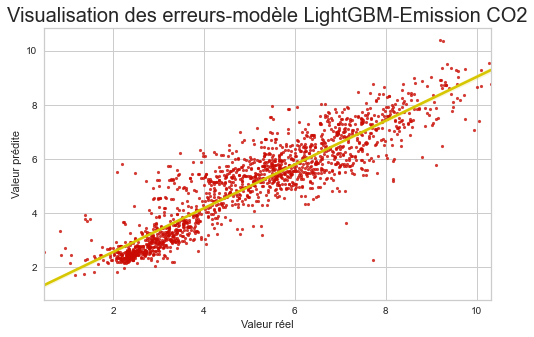

In [287]:
plt.figure(figsize= (8,5))
g = sns.regplot(data = df_gaz_model , x= 'Valeur réel' ,
                y = 'Valeur prédite',
                scatter = True, 
                color="r", 
               scatter_kws={"s": 10},
              line_kws={"color": "y"})
plt.title("Visualisation des erreurs-modèle LightGBM-Emission CO2", size= 20)
plt.savefig("gaz_erreurs", orientation='portrait',bbox_inches='tight') 

#### Visualisation des résidus et leur distribution

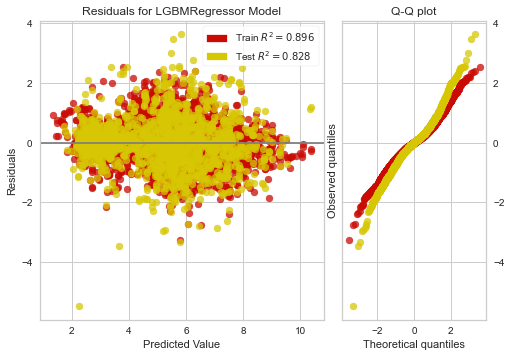

In [285]:
visualizer_gaz = ResidualsPlot(lgb_gaz.best_estimator_ , hist=False, qqplot=True, train_color='r', test_color= 'y',
                               line_color='#7f7f7f')
visualizer_gaz.fit(xtrain, ytrain_gaz['TotalGHGEmissions'].values)  
visualizer_gaz.score(xtest, ytest_gaz["TotalGHGEmissions"].values)  

visualizer_gaz.show() 
visualizer_gaz.finalize()

# 6-Modélisation avec "EnergyStarSocre"

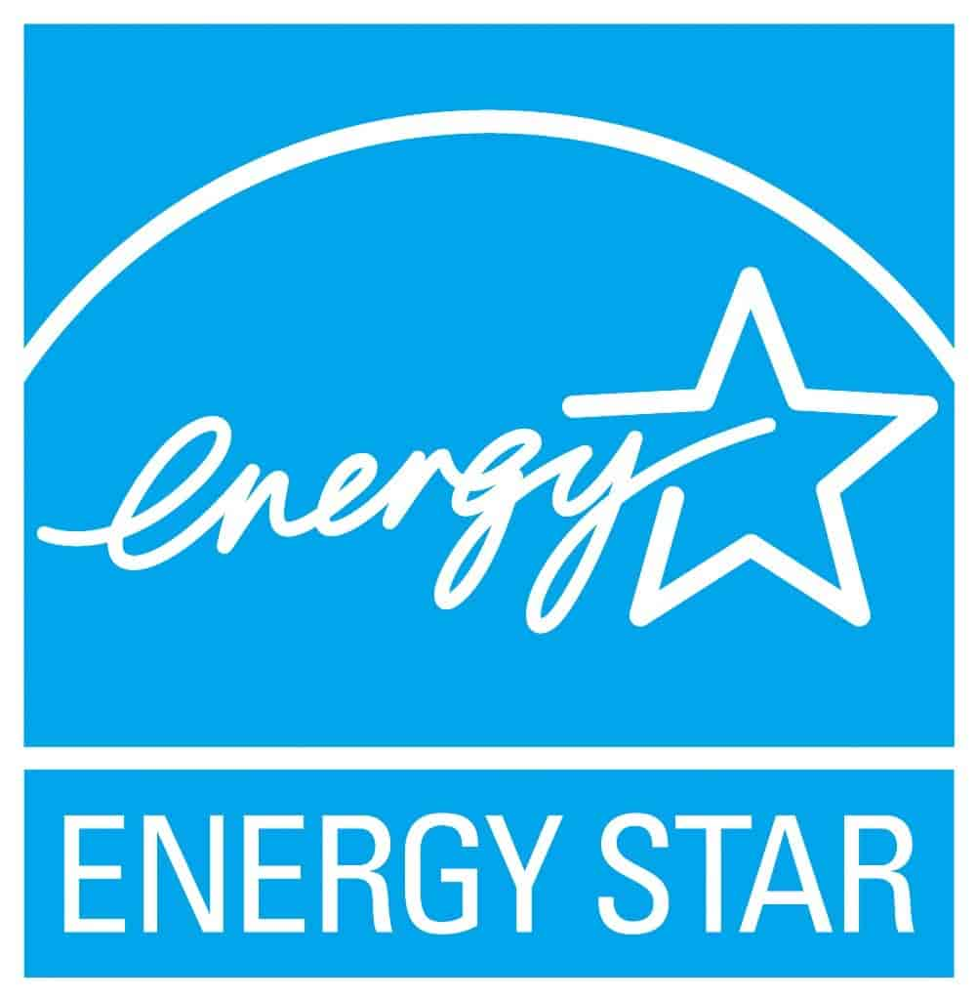

In [252]:
# Créer un nouveau df avec la varaible de ENERGYSTARScore
df_model_s= df_final[['Neighborhood','NumberofBuildings', 
                      'NumberofFloors', 'PropertyGFATotal',
                      'PropertyGFAParking', 'Building/Total_GFA',
                      'LargestPropertyUseType', 'ENERGYSTARScore', 
                      'SiteEnergyUse(kBtu)','TotalGHGEmissions', 
                      'BuildingAge', 'Electricity_usage',
                       'Gas_usage','Steam_usage']]

In [253]:
# Transformation des variables catégorielles en varibales ordinales 
df_dummies_s = pd.get_dummies(df_model_s, columns = ['LargestPropertyUseType', 'Neighborhood',
                                                'Electricity_usage','Gas_usage', 'Steam_usage'])


df_dummies_s = df_dummies_s.drop(['Gas_usage_No', 'Steam_usage_No',], axis = 1)

df_dummies_s = df_dummies_s.rename(columns= {
       'Electricity_usage_Yes': 'Electricity_use' ,
       'Gas_usage_Yes': 'Gas_use' ,
        'Steam_usage_Yes': 'Steam_use'})




In [254]:

# Identifier les deux variable cibless 
df_energy_s = df_dummies_s.drop(['TotalGHGEmissions'], axis= 1)
df_gaz_s = df_dummies_s.drop(['SiteEnergyUse(kBtu)'], axis = 1)



# Créer un dataframe pour les variables explicatives 
X_s = df_dummies_s.drop(['SiteEnergyUse(kBtu)', 'TotalGHGEmissions'],axis= 1)
y_energy_s =  df_dummies_s[['SiteEnergyUse(kBtu)']]
y_gaz_s = df_dummies_s[['TotalGHGEmissions']]

X_s.columns

Index(['NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'Building/Total_GFA', 'ENERGYSTARScore',
       'BuildingAge', 'LargestPropertyUseType_EDUCATION',
       'LargestPropertyUseType_HEALTH',
       'LargestPropertyUseType_HOTEL/SENIOR CARE/HOUSING',
       'LargestPropertyUseType_INDUSTRY/COMPLEX',
       'LargestPropertyUseType_LEISURE', 'LargestPropertyUseType_NO INFO',
       'LargestPropertyUseType_OFFICE', 'LargestPropertyUseType_OTHER',
       'LargestPropertyUseType_RETAIL', 'Neighborhood_CENTRAL',
       'Neighborhood_EAST', 'Neighborhood_GREATER DUWAMISH',
       'Neighborhood_LAKE UNION', 'Neighborhood_MAGNOLIA / QUEEN ANNE',
       'Neighborhood_NORTH', 'Neighborhood_NORTHEAST',
       'Neighborhood_NORTHWEST', 'Neighborhood_SOUTHEAST',
       'Neighborhood_SOUTHWEST', 'Neighborhood_WEST', 'Electricity_usage_No',
       'Electricity_use', 'Gas_use', 'Steam_use'],
      dtype='object')

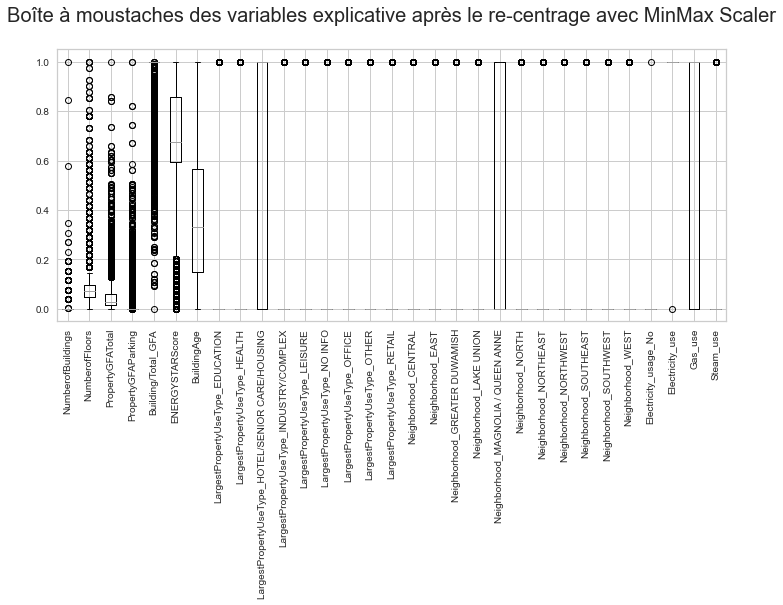

In [255]:

#Transformation/ Normalisation des prédicteurs 
to_scale_s = ['NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'Building/Total_GFA', 'ENERGYSTARScore',
       'BuildingAge']

minmax= MinMaxScaler()
X_s[to_scale_s]= minmax.fit_transform(X_s[to_scale_s])

plt.figure(figsize = (12,5))
X_s.boxplot()
plt.xticks(rotation = 90, fontsize = 10)
plt.title("Boîte à moustaches des variables explicative après le re-centrage avec MinMax Scaler\n", fontsize = 20)
plt.show()


In [256]:
# Transformation des variables à prédire 


#Log transformer 

y_energy_s = np.log2(1+y_energy_s)

y_gaz_s = np.log2(1+y_gaz_s)



In [257]:
#Test/train split 

xtrain_s, xtest_s, ytrain_energy_s, ytest_energy_s = train_test_split(X_s,
                                                              y_energy_s,
                                                             test_size = 0.3, random_state=42)


xtrain_s, xtest_s, ytrain_gaz_s, ytest_gaz_s = train_test_split(X_s,
                                                        y_gaz_s,
                                                        test_size= 0.3, random_state= 42)



print("la dimension de training set(variable explicatives) : ", xtrain_s.shape)
print("la dimension de test set(variable explicative) : ", xtest_s.shape)
print("la dimension de training set(variable cible): ", ytrain_energy_s.shape)
print("la dimension de test set(variable cible): ", ytest_energy_s.shape)

la dimension de training set(variable explicatives) :  (3836, 31)
la dimension de test set(variable explicative) :  (1644, 31)
la dimension de training set(variable cible):  (3836, 1)
la dimension de test set(variable cible):  (1644, 1)


In [258]:
def random_model_s(model_base, params, label_train) :
    tuned_model = RandomizedSearchCV(estimator = model_base, param_distributions= params,
                            n_iter = 100, n_jobs = -1, 
                            return_train_score= True, cv = 5,
                            scoring =('r2','neg_mean_squared_error'),
                            refit='neg_mean_squared_error').fit(xtrain_s, label_train)
    
                           
    return (tuned_model)

def grid_model_s(model_base, params, label_train) :
    
    tuned_model = GridSearchCV(estimator = model_base, param_grid= params,
                              n_jobs = -1, cv = 5, 
                             scoring =('r2','neg_mean_squared_error'),
                            refit='neg_mean_squared_error',
                            return_train_score = True).fit(xtrain_s, label_train)
    
    return (tuned_model)

## 6.1 Créer le modèle

In [259]:
lgb_energy_s = random_model_s(lgb_base, lgb_params, ytrain_energy_s)
lgb_gaz_s = random_model_s(lgb_base, lgb_params, ytrain_gaz_s)

print("Performance du modèle LighGBM pour la consommation de l'energy_RandomSearchCV\n")
model_scoring(lgb_energy_s)
print("\nPerformance du modèle LighGBM pour l'emission GHG'-RandomSearchCV\n")
model_scoring(lgb_gaz_s)

Performance du modèle LighGBM pour la consommation de l'energy_RandomSearchCV

Meilleur score MSE : -0.35
Meilleur Score R2 : 0.846
Meilleurs paramètres :\ {'num_leaves': 29, 'min_child_samples': 4, 'max_depth': 12, 'boosting_type': 'gbdt'}
Temps moyen d'entrainement : 1340.69s

Performance du modèle LighGBM pour l'emission GHG'-RandomSearchCV

Meilleur score MSE : -0.61
Meilleur Score R2 : 0.838
Meilleurs paramètres :\ {'num_leaves': 29, 'min_child_samples': 2, 'max_depth': 11, 'boosting_type': 'gbdt'}
Temps moyen d'entrainement : 1317.08s


,mean_fit_time,mean_train_neg_mean_squared_error,mean_test_neg_mean_squared_error,rank_test_r2,mean_train_r2,mean_test_r2
0,0.344773,-0.482139,-0.681667,38,0.872429,0.818935
1,0.464723,-0.398815,-0.661518,26,0.894456,0.824268
2,0.334915,-0.411289,-0.660545,24,0.891158,0.824657
3,0.125604,-0.648776,-0.736566,73,0.828330,0.804491
4,0.491860,-0.313056,-0.628454,4,0.917154,0.833142


## - 6.2  Feature importance du modèle avec EnergyScore

##### Feature Importance du modèle LightGBM pour la consommation de l'énergie 

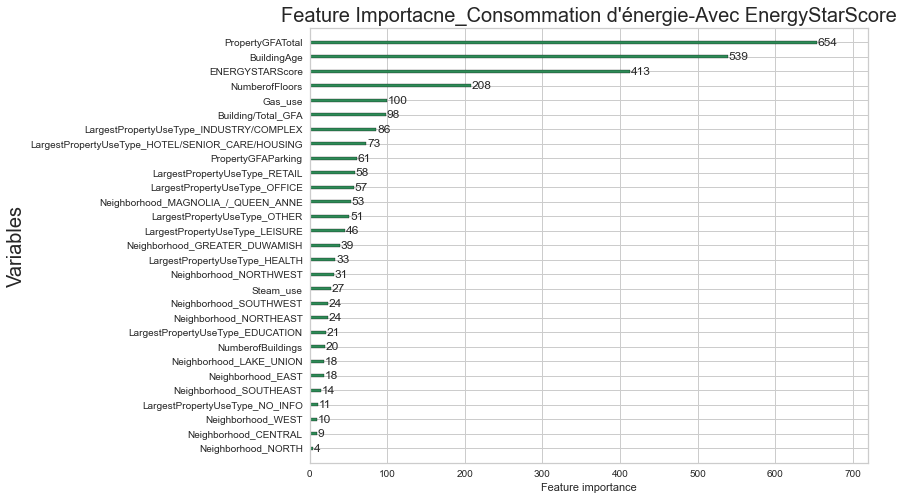

In [290]:
fig, ax = plt.subplots(figsize=(10, 8))

lgb.plot_importance(lgb_energy_s.best_estimator_, ax= ax, 
                    color = 'seagreen', edgecolor='black')
#fig.patch.set_facecolor('#17becf')
fig.patch.set_alpha(1)
plt.yticks(fontsize = 10)
plt.ylabel('Variables', fontsize = 20)
plt.title("Feature Importacne_Consommation d'énergie-Avec EnergyStarScore", fontsize = 20)

plt.savefig("feauture importance_energy_s", orientation='portrait',bbox_inches='tight') 
plt.show()

##### Feature Importance de LightGBM pour l'emission de GHG 

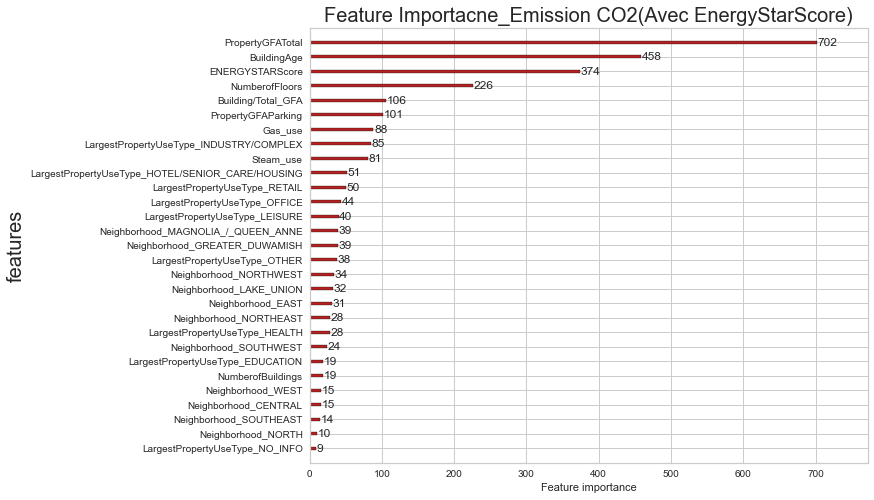

In [289]:
fig, ax = plt.subplots(figsize=(10, 8))


lgb.plot_importance(lgb_gaz_s.best_estimator_, ax =ax, color = 'firebrick', edgecolor='black')
fig.patch.set_alpha(1)
plt.yticks(fontsize = 10)
plt.ylabel('features', fontsize = 20)
plt.title('Feature Importacne_Emission CO2(Avec EnergyStarScore)', fontsize = 20)

plt.savefig("feauture importance_CO2_s", orientation='portrait',bbox_inches='tight') 
plt.show()

- Après avoir choisi le modèle, nous allons à présent le testet. Test des modèles sélectionnés¶


**- Le résultat de la modélisation avec EnergyStarScor montre que ce dernier ainsi que la superficie, et l'année de construction ont  des impacts importants sur le modèle.**  
**- Le résultat du modèle dépend plus modédestement des quartiers et  le type d'usage des chaque.**

## Tester le modèle avec EnergyStarScore pour la prédiction de l'émission de CO2 et de la consommation énergétique

In [262]:
print("Meuilleurs modèle pour la consommation de l'energy :\n",'\n',lgb_energy_s.best_estimator_,"\n")
lgb_energy_pred_s =lgb_energy_s.best_estimator_.predict(xtest_s)

print("Score du model final pour la consommation énergétique_avec EnergyStarScore : ")
evaluate(ytest_energy_s['SiteEnergyUse(kBtu)'].values, lgb_energy_pred_s)

Meuilleurs modèle pour la consommation de l'energy :
 
 LGBMRegressor(max_depth=12, min_child_samples=4, num_leaves=29) 

Score du model final pour la consommation énergétique_avec EnergyStarScore : 
Coefficient de déterminatiaon (R2)= 0.846
Le carré moyen des erreurs (MSE) = 0.369
Racine carré de MSE (RMSE) =  0.608
Mean absolute Error (MAE) =  0.404


,Métrique,Résultats
0,MSE,0.369142
1,R2,0.845551
2,RMSE,0.607570
3,MAE,0.404492


In [263]:
print("Meuilleurs modèle pour l'émission de CO2' :\n",'\n',lgb_gaz_s.best_estimator_,"\n")
lgb_gaz_pred_s = lgb_gaz_s.best_estimator_.predict(xtest_s)
print("Score du model final pour l'emission de CO2_avec EnergyStarScore : ")
evaluate(ytest_gaz_s['TotalGHGEmissions'].values, lgb_gaz_pred_s)

Meuilleurs modèle pour l'émission de CO2' :
 
 LGBMRegressor(max_depth=11, min_child_samples=2, num_leaves=29) 

Score du model final pour l'emission de CO2_avec EnergyStarScore : 
Coefficient de déterminatiaon (R2)= 0.851
Le carré moyen des erreurs (MSE) = 0.601
Racine carré de MSE (RMSE) =  0.775
Mean absolute Error (MAE) =  0.547


,Métrique,Résultats
0,MSE,0.601028
1,R2,0.850928
2,RMSE,0.775260
3,MAE,0.547373


## 6.3  Analyser la performance du modèle sélectionné avec EnergyScore

In [264]:
# Créer un dataframe avec les valeur réelle de l'émission de GHG et les valeurs prédites 
df_gaz_model_s = pd.DataFrame(list(zip(ytest_gaz_s['TotalGHGEmissions'].values,
                                        lgb_gaz_pred_s)), columns = ['Valeur réel','Valeur prédite'])

display(df_gaz_model_s.head(3))

,Valeur réel,Valeur prédite
0,7.260778,5.905590
1,4.742006,4.320936
2,7.710531,7.025699


#### Visualisation des erreurs du modèle pour la prédiction de l'émission de CO2

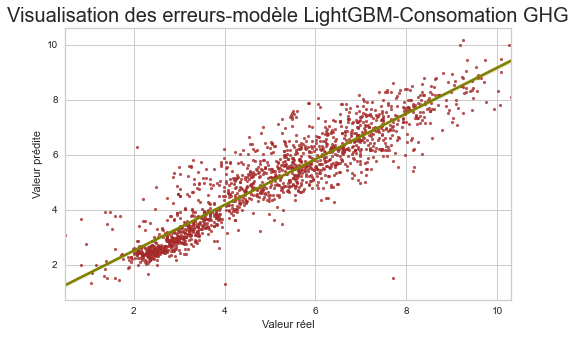

In [265]:
plt.figure(figsize= (8,5))
g = sns.regplot(data = df_gaz_model_s , x= 'Valeur réel' ,
                y = 'Valeur prédite',
                scatter = True, 
                color="brown", 
               scatter_kws={"s": 10},
              line_kws={"color": "olive"})
plt.title("Visualisation des erreurs-modèle LightGBM-Consomation GHG", size= 20)
plt.savefig("gaz", orientation='portrait',bbox_inches='tight') 

In [266]:
print("Score du pour la prédiction de la consommation énergétique-avec EnergyStarScore : \n")
evaluate(ytest_energy_s,lgb_energy_pred_s)


Score du pour la prédiction de la consommation énergétique-avec EnergyStarScore : 

Coefficient de déterminatiaon (R2)= 0.846
Le carré moyen des erreurs (MSE) = 0.369
Racine carré de MSE (RMSE) =  0.608
Mean absolute Error (MAE) =  0.404


,Métrique,Résultats
0,MSE,0.369142
1,R2,0.845551
2,RMSE,0.607570
3,MAE,0.404492


- Les valeurs prédites sont très éloignées des valuers réelles ! 
- On va vérifier le score d"entrainement pour notre modèle : 




#### Visualisation des résidus et leur distribution pour la prédiction de l'émission de CO2

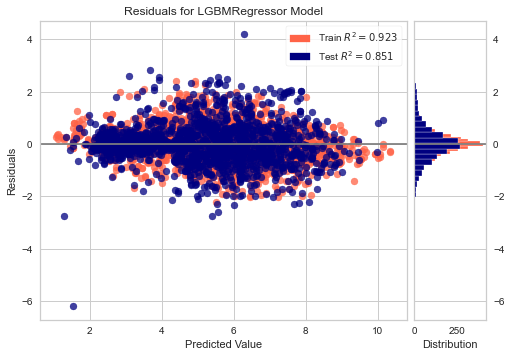

<AxesSubplot:title={'center':'Residuals for LGBMRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [282]:
visualizer_gaz_s = ResidualsPlot(lgb_gaz_s.best_estimator_ ,train_color='tomato', test_color= 'navy',
                               line_color='#7f7f7f')

visualizer_gaz_s.fit(xtrain_s, ytrain_gaz_s['TotalGHGEmissions'].values)  
visualizer_gaz_s.score(xtest_s, ytest_gaz_s["TotalGHGEmissions"].values)  


visualizer_gaz_s.show() 

##### Tester le modèle avec EnergyStarScore pour la prédiction de la consommation de l'énergie

In [268]:
# Créer un dataframe des valuers réel de la consomariont de l"énergy (ytest_energy) et les valeurs prédites 

df_energy_model_s = pd.DataFrame(list(zip(ytest_energy_s['SiteEnergyUse(kBtu)'].values,
                                        lgb_energy_pred_s)), columns = ['Valeur réel','Valeur prédite'])

#df_energy_model["Residual"] = df_energy_model['Energy_reel'] - df_energy_model['Energy_pred_lgb']
df_energy_model = df_energy_model.sort_values (by = 'Valeur réel')

df_energy_model.head(3)

,Valeur réel,Valeur prédite,Residual
735,15.802067,19.258316,3.456249
1432,16.731266,19.468474,2.737208
1579,16.809931,18.263520,1.453589


#### Visualisation des erreurs

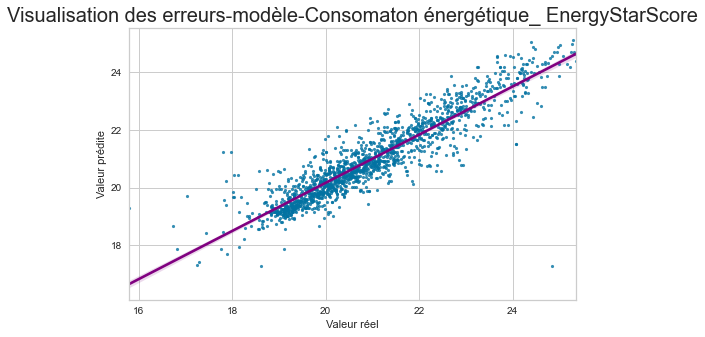

In [269]:
plt.figure(figsize= (8,5))
g = sns.regplot(data = df_energy_model_s , x= 'Valeur réel' , y = 'Valeur prédite',
              scatter_kws={"s": 10},
              line_kws={"color": "purple"})


plt.title("Visualisation des erreurs-modèle-Consomaton énergétique_ EnergyStarScore", size= 20)
plt.show()
#plt.savefig("energy", orientation='portrait',bbox_inches='tight') 

#### Visualisation des résidus et leur distribution

In [270]:
lgb_energy_s.best_estimator_

LGBMRegressor(max_depth=12, min_child_samples=4, num_leaves=29)

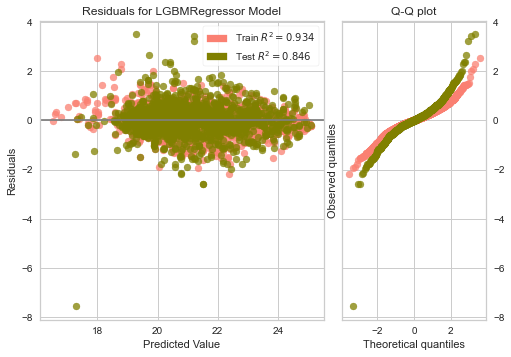

<AxesSubplot:title={'center':'Residuals for LGBMRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [283]:
visualizer_s = ResidualsPlot(lgb_energy_s.best_estimator_ ,
                             hist=False, qqplot=True, train_color='salmon', test_color= 'olive',
                               line_color='#7f7f7f')


visualizer_s.fit(xtrain_s, ytrain_energy_s['SiteEnergyUse(kBtu)'].values)  
visualizer_s.score(xtest_s, ytest_energy_s["SiteEnergyUse(kBtu)"].values)  

visualizer_s.show()  


# Synthèse 

- **On constate qu'avec EnergyStarsScore la performance de 2 modèles a légèrement amélioré.**
-
- **La performance énergétique des bâtiments (EnergyStarScore) a des influence importante sur le modèle de la prédiction de'émission de CO2.**
